In [ ]:
import pandas as pd
import xml.etree.ElementTree as ET
import os
from urllib.request import urlretrieve as download
from glob import glob as g
from Bio.Blast import NCBIWWW, NCBIXML
from mypdb import PDB_file as mypdb
from Bio.Blast.Applications import NcbipsiblastCommandline
from time import time as t
from tqdm import tqdm


import glob
import xml.etree.ElementTree as ET
from collections import defaultdict

import re
import MDAnalysis as mda
from time import time as t

BLAST the PDB to get structures with similar sequence to the BRAF.

In [ ]:
#Class to handle and download the hits from a blast search



def merge_dicts(dict1, dict2):
    for k2, v2 in dict2.items():
        if k2 in dict1:
            if isinstance(dict1[k2], list):
                dict1[k2].append(v2)
            else:
                dict1[k2] = [dict1[k2], v2]
        else:
            print(f"New Key : {k2}")
            dict1[k2] = v2
    return dict1

class hit:
    def __init__(self, xml_hit):
        self.hit_num = xml_hit[0].text
        pdb_info = xml_hit[1].text.split("|")[1:]
        self.pdb_id = pdb_info[0]
        self.pdb_chain = pdb_info[1]
        self.description = xml_hit[2].text
        data = [[y.tag.replace("Hsp_", ""), y.text] for y in xml_hit[5][0]]
        self.data = dict(data)
        self.pdb = None
        self._not_exists = False

    @staticmethod
    def download2(code, pdir=None):
        base_url = "https://files.rcsb.org/download"
        pdb_url = f"{base_url}/{code}.pdb"
        f_p = os.path.join(pdir, f"{code}.pdb")
        try:
            download(pdb_url, f_p)
            return f_p  # Return the file path if succeeded
        except Exception:
            print(f"File {code} not found.")
            return None  # Return None if failed

    def _assign(self, f_p):
        self.pdb_path = f_p
        self.pdb = mypdb(f_p)
        
    def check_for_pdb(self, pdir=None):
        if pdir is None:
            pdir = "./pdbs/"
        elif pdir[-1] != "/":
            pdir += "/"
        if not os.path.isdir(pdir):
            os.makedirs(pdir, exist_ok=True)
        matches = g(pdir + f"{self.pdb_id}*")
        if matches:
            if not self.pdb:
                self._assign(matches[0])
            return True
        else:
            return False

In [ ]:
#Class to handle the blast search
class blast:
    def __init__(self, sequence, name, database, path, program="blastp", hitlen=10000):
        self.sequence = sequence
        self.program = program
        self.database = database
        self.path = path
        self.name = name
        self.hitlen = hitlen

        if program == "blastp" and (self.path and os.path.isfile(self.path)):
            self.parse_search()
        elif program == "psiblast":
            self.psiblast_search()
        else:
            self.bsearch()

    def bsearch(self):
        # Perform the initial BLASTP search
        if self.program == "blastp":
            print("Searching BLASTP...")
            t1 = t()
            self.results = NCBIWWW.qblast(self.program, self.database, self.sequence, hitlist_size=self.hitlen)
            t2 = t()
            print(f"BLASTP took {round(t2-t1,4)} seconds")
            if not self.path:
                self.path = f"{self.name}-blast.xml"
            with open(self.path, "w") as output_xml:
                output_xml.write(self.results.read())
            self.parse_search()

    def psiblast_search(self):
        # Run local PSI-BLAST using NcbipsiblastCommandline
        print(f"Running PSI-BLAST on {self.name}...")
        input_fasta = f"{self.name}.fasta"
        with open(input_fasta, "w") as f:
            f.write(f">query\n{self.sequence}\n")

        psiblast_cline = NcbipsiblastCommandline(
            query=input_fasta,
            db="/home/marmatt/ncbi-blast-2.16.0+/bin/pdbaa",
            evalue=10,
            num_iterations=3,
            out_ascii_pssm=f"{self.name}.pssm",
            out=f"{self.name}-psiblast.xml",
            outfmt=5
        )
        stdout, stderr = psiblast_cline()
        if stderr:
            print(f"PSI-BLAST ERROR: {stderr}")
        else:
            print("PSI-BLAST search completed.")
            self.parse_search(xml_file=f"{self.name}-psiblast.xml")

    def parse_search(self, xml_file=None):
        xml_file = xml_file or self.path
        if not xml_file:
            raise Exception("No XML file path provided.")
        t1 = t()
        tree = ET.parse(xml_file)
        iteration = tree.findall("./BlastOutput_iterations/Iteration/")
        self.query_length = iteration[3].text
        hits = [hit(x) for x in iteration[-2]] #returns hit objects
        self.hits = hits
        mega_dict = hits[0].data
        for x in hits[1:]:
            mega_dict = merge_dicts(mega_dict, x.data)
        mega_dict["PDB ID"] = [x.pdb_id for x in hits]
        mega_dict["Chain"] = [x.pdb_chain for x in hits]
        mega_dict["Description"] = [x.description for x in hits]
        self.df = pd.DataFrame.from_dict(mega_dict)
        print(self.df)
        t2 = t()
        print(f"Time taken to parse {t2-t1}")
    
    def download_pdbs(self, pdir=None):
        default_dir = "./PDBs"
        pdir = os.path.abspath(pdir if pdir else default_dir)
        if not os.path.isdir(pdir):
            os.makedirs(pdir, exist_ok=True)
        
        files = [os.path.splitext(f)[0] for f in os.listdir(pdir)]
        hit_bar = tqdm(self.hits, desc="Processing Hits")
        
        for x in hit_bar:
            if x.pdb_id not in files:
                hit_bar.set_description(f"Downloading {x}")
                
                try:
                    file_path = x.download2(x.pdb_id, pdir=pdir)

                    if file_path:
                        x._assign(file_path)
                    else:
                        # In case download2 does not return a valid path
                        raise Exception("Download failed")
                except Exception as e:
                    # Print a message if download fails or file path is invalid
                    print(f"Structure {x.pdb_id} was not found...")

## Actually running the blast search

In [ ]:

"""
Here we perform a blast search on:
 1.   The BRAF monomer
"""
with open("./fastas.txt") as f:
    fastas = f.readlines()

braf_fasta = fastas[1]
name = "braf"

# Directory for storing blast search results
output_dir = "./blast_search"
# Ensure the directory exists
os.makedirs(output_dir, exist_ok=True)

res_path = os.path.join(output_dir, f"{name}-blast.xml")  # Path for the results file

# Check for saved results in the specified directory
if os.path.exists(res_path):
    bs = blast(braf_fasta, name, database="pdb", path=res_path)
else:
    bs = blast(braf_fasta, name, database="pdb", path=None)

bs.download_pdbs()

## Counting the number of pdb files in the directory

In [ ]:


import glob
def count_pdb_files(directory):
    # Ensure the directory path ends with a slash
    directory = os.path.join(directory, '')

    # Use glob to find all .pdb files in the directory
    pdb_files = glob.glob(os.path.join(directory, '*.pdb'))

    # Return the count of .pdb files
    return len(pdb_files)

# Specify the directory
pdb_directory = 'PDBs'

# Get the count of PDB files
pdb_count = count_pdb_files(pdb_directory)

print(f"There are {pdb_count} PDB files in the directory '{pdb_directory}'.")

## Counting the number of pdb hits in the xml file and checking which ones have not been downloaded


In [ ]:


def count_pdb_files(directory):
    # Use glob to find all .pdb files in the directory
    pdb_files = glob.glob(os.path.join(directory, '*.pdb'))

    # Extract the base filenames (without extension) to compare with PDB IDs
    pdb_file_ids = {os.path.splitext(os.path.basename(f))[0] for f in pdb_files}

    return pdb_file_ids

def find_unique_and_duplicate_pdb_hit_ids(xml_file):
    # Parse the XML file
    tree = ET.parse(xml_file)
    root = tree.getroot()

    # Dictionary to count occurrences of each PDB hit ID
    hit_id_counts = defaultdict(int)

    # Iterate over all Hit elements in the XML
    for hit in root.findall('.//Hit'):
        # Extract the Hit_id text
        hit_id = hit.find('Hit_id').text

        # Assuming the Hit_id format is 'pdb|PDB_ID|Chain', extract the PDB_ID
        pdb_id = hit_id.split('|')[1]

        # Increment the count for this PDB_ID
        hit_id_counts[pdb_id] += 1

    # Find all PDB IDs (unique and duplicates)
    all_hit_ids = set(hit_id_counts.keys())

    return all_hit_ids

# Specify the directory and XML file
pdb_directory = 'PDBs'
xml_file = 'braf-blast.xml'

# Get the PDB file IDs from the directory
pdb_file_ids = count_pdb_files(pdb_directory)

# Get all PDB hit IDs from the XML
all_pdb_ids = find_unique_and_duplicate_pdb_hit_ids(xml_file)

# Calculate the number of total PDB hits
total_pdb_hits = len(all_pdb_ids)

# Find PDB IDs in XML that are not in the directory
missing_pdb_ids = all_pdb_ids - pdb_file_ids

print(f"There are {total_pdb_hits} total PDB hits in the file '{xml_file}'.")
print(f"There are {len(missing_pdb_ids)} PDB IDs in the XML not found in the directory '{pdb_directory}':")
print(missing_pdb_ids)


## Here we are stripping the downloaded pdb files to only contain the chain of interest


In [ ]:
import os
from glob import glob
import re
import MDAnalysis as mda
from time import time as t
!ls
def sglob(fp, absolute=True):
    fps = sorted(glob(fp))
    if absolute:
        fps = [os.path.abspath(f) for f in fps]
    return fps

def strip_to_chain(pdb_file, chain_ID):
    u = mda.Universe(pdb_file)
    print(f"Loaded trajectory from {pdb_file} with {len(u.atoms)} atoms.")

    chain = u.select_atoms(f"protein and chainID {chain_ID}")
    if len(chain) == 0:
        print(f"Chain {chain_ID} not found in {pdb_file}.")
        return None
    return chain

def post_process(fname):
    with open(fname, "r") as f_o:
        initial_lines = f_o.readlines()

    print(f"File {fname} before post_process, first few lines:")
    print("".join(initial_lines[:20]))

    final_lines = initial_lines[-2:].copy()
    no_ter = [line for line in initial_lines if line[:3] != "TER" or line in final_lines]

    if len(no_ter) != len(initial_lines):
        with open(fname, "w") as f_o:
            print(f"Rewriting {fname}, lines reduced from {len(initial_lines)} to {len(no_ter)}")
            f_o.write("".join(no_ter))

    print(f"File {fname} after post_process, first few lines:")
    with open(fname, "r") as f_r:
        print("".join(f_r.readlines()[:20]))

def parse_xml(xml_file):
    hit_id = re.compile(r"<Hit_id>(.*?)<.Hit_id>")
    with open(xml_file, "r") as f:
        text = f.read()
        results = [h.split("|")[1:] for h in hit_id.findall(text)]
        pdb_chain_dict = {}
        for r in results:
            pdb_chain_dict[r[0]+f"_{r[1]}"] = r[1]
    return pdb_chain_dict

def get_pdb_id(fp):
    fp = fp.rsplit(".", 1)[0]
    if "/" in fp:
        fp = fp.rsplit("/", 1)[1]
    return fp

def target_name(fp, target_dir, chain):
    orig_path, file_name = fp.rsplit("/", 1)
    fp = fp.replace(orig_path, target_dir)
    fp = fp.split(".")[0] + f"_{chain}.pdb"
    return fp

def find_pdb_file(PDB_chain_id, files):
    print(files)
    if "_" in PDB_chain_id:
        PDB_id = PDB_chain_id.split("_")[0]
    assert len(PDB_id) == 4
    for f in files:
        filename = os.path.basename(f).split('.')[0]
        if filename.startswith(PDB_id):
            print(f"Found file: {f} for PDB ID: {PDB_id}")
            return f

print("BEGIN")
t1 = t()
xml = "braf-blast.xml"
pdb_dir = "PDBs"
target_dir = "Results/activation_segments/unaligned"

# Ensure the target directory exists
os.makedirs(target_dir, exist_ok=True)

xml_chain_dict = parse_xml(xml)
print(xml_chain_dict)

pdb_files = sorted(sglob("PDBs/*.pdb"))
print(pdb_files)
keys = sorted([*xml_chain_dict.keys()], key=get_pdb_id)

print(keys)
files = [find_pdb_file(k, pdb_files) for k in keys]
print(files)
chain_IDs = [xml_chain_dict[k] for k in keys]
print(len(chain_IDs))

valid_file_chain_pairs = [(f, c) for f, c in zip(files, chain_IDs) if f is not None]
print(len(valid_file_chain_pairs))
new_file_paths = [target_name(f, target_dir, c) for f, c in valid_file_chain_pairs]
print(new_file_paths)
file_paths = [f for f, c in valid_file_chain_pairs]
print(file_paths)
print(len(file_paths))

for (fp, chain_ID, tp) in zip(file_paths, chain_IDs, new_file_paths):
    if fp is not None:
        try:
            print(fp, chain_ID, tp)
            chain = strip_to_chain(fp, chain_ID)
            if chain is not None:
                with mda.Writer(tp) as w:
                    w.write(chain)
                post_process(tp)
        except Exception as e:
            print(f"An error occurred while processing {fp} with chain {chain_ID}: {e}")
        
t2 = t()
t_t = round(t2 - t1, 3) // 60
t_t = str((t_t // 60)) + ":" + str(t_t % 60)
print(f"Time taken {t_t} for sequential processing")


## Counting again how many pdb files are in the directory after stripping the chains

In [ ]:
import glob

def count_pdb_files(directory):
    # Ensure the directory path ends with a slash
    directory = os.path.join(directory, '')

    # Use glob to find all .pdb files in the directory
    pdb_files = glob.glob(os.path.join(directory, '*.pdb'))

    # Return the count of .pdb files
    return len(pdb_files)

# Specify the directory
pdb_directory = 'Results/activation_segments/unaligned'

# Get the count of PDB files
pdb_count = count_pdb_files(pdb_directory)

print(f"There are {pdb_count} PDB files in the directory '{pdb_directory}'.")

In [ ]:
#Extracting the full sequence from the pdb files, checking if there are any non-natural amino acids and substituting them and selecting only sequences with a maximum gap length of 4 amino acids to be reconstructed
from Bio.PDB import PDBParser, PPBuilder
from Bio.SeqUtils import seq1
from glob import glob
from tqdm import tqdm
import os

def substitute_non_natural_amino_acid(residue, aligned_atom, index):
    """Substitute non-natural amino acids with their natural counterparts."""
    substitutions = {
        'X': 'G',  # Glycine
        'B': 'N',  # Asparagine
        'Z': 'Q',  # Glutamine
        'J': 'L'   # Leucine
    }
    
    if residue == 'X':
        # Check if 'X' is surrounded by missing amino acids in aligned_atom
        if index > 0 and aligned_atom[index - 1] == '-':
            return residue
        if index < len(aligned_atom) - 1 and aligned_atom[index + 1] == '-':
            return residue

    return substitutions.get(residue, residue)

def extract_seqres_sequence(pdb_file):
    """Extract SEQRES sequences for each chain from a PDB file."""
    seq_dict = {}
    with open(pdb_file, "r") as file:
        lines = file.readlines()

    current_chain = None
    current_seq = []

    for line in lines:
        if line.startswith("SEQRES"):
            parts = line.split()
            chain_id = parts[2]
            if chain_id != current_chain:
                if current_chain is not None:
                    seq_dict[current_chain] = ''.join(seq1(residue) for residue in current_seq)
                current_chain = chain_id
                current_seq = []
            current_seq.extend(parts[4:])

    if current_chain is not None:
        seq_dict[current_chain] = ''.join(seq1(residue) for residue in current_seq)

    return seq_dict

def extract_atom_sequence(pdb_file, chain_id):
    """Extract sequence from atomic coordinates for a specific chain."""
    parser = PDBParser(QUIET=True)
    structure = parser.get_structure('PDB', pdb_file)
    
    for model in structure:
        chain = model[chain_id]
        
        ppb = PPBuilder()
        sequence = ''
        for pp in ppb.build_peptides(chain):
            sequence += pp.get_sequence()
        return sequence
    return None

def find_motif_indices(sequence, motif):
    """Find the start index of a motif in a sequence."""
    index = sequence.find(motif)
    return index if index != -1 else None

def align_and_highlight_gaps(seqres_segment, atom_segment):
    """Align SEQRES and ATOM segments and highlight gaps in ATOM."""
    aligned_seqres = ''
    aligned_atom = ''
    atom_index = 0
    max_gap_length = 0
    current_gap_length = 0

    for res_seqres in seqres_segment:
        if atom_index < len(atom_segment) and res_seqres == atom_segment[atom_index]:
            aligned_seqres += res_seqres
            aligned_atom += atom_segment[atom_index]
            atom_index += 1
            current_gap_length = 0
        else:
            aligned_seqres += res_seqres
            aligned_atom += '-'
            current_gap_length += 1
            max_gap_length = max(max_gap_length, current_gap_length)

    return aligned_seqres, aligned_atom, max_gap_length

def main():
    target_dir = "Results/activation_segments/unaligned"
    pdb_dir = "PDBs"
    fasta_output_file = "seqres_sequences.fasta"  # File to store full sequences
    text_output_file = "seqres_info.txt"
    aligned_sequences = {}
    satisfying_structures_count = 0

    pdb_files = glob(os.path.join(target_dir, "*.pdb"))

    with open(text_output_file, "w") as text_output, open(fasta_output_file, "w") as fasta_output:
        for pdb_file in tqdm(pdb_files, desc="Processing PDB files"):
            pdb_name = os.path.basename(pdb_file)
            pdb_id, chain_id_file = os.path.splitext(pdb_name)[0].split('_')
            chain_id = chain_id_file

            full_pdb_path = os.path.join(pdb_dir, pdb_id + '.pdb')
            if not os.path.isfile(full_pdb_path):
                print(f"Corresponding full PDB for {pdb_id} not found.")
                continue

            seqres_seqs = extract_seqres_sequence(full_pdb_path)
            atom_seq = extract_atom_sequence(full_pdb_path, chain_id)

            if chain_id in seqres_seqs and atom_seq:
                seqres_sequence = seqres_seqs[chain_id]
                seqres_dfg_index = find_motif_indices(seqres_sequence, 'DFG')
                seqres_ape_index = find_motif_indices(seqres_sequence, 'APE')
                atom_dfg_index = find_motif_indices(atom_seq, 'DFG')
                atom_ape_index = find_motif_indices(atom_seq, 'APE')

                # Determine the start and end indices for the segments
                if None not in [seqres_dfg_index, seqres_ape_index, atom_dfg_index, atom_ape_index]:
                    seqres_start = min(seqres_dfg_index, seqres_ape_index)
                    seqres_end = max(seqres_dfg_index + 3, seqres_ape_index + 3)
                    atom_start = min(atom_dfg_index, atom_ape_index)
                    atom_end = max(atom_dfg_index + 3, atom_ape_index + 3)

                    seqres_segment = seqres_sequence[seqres_start:seqres_end]
                    atom_segment = atom_seq[atom_start:atom_end]

                    aligned_seqres, aligned_atom, max_gap_length = align_and_highlight_gaps(seqres_segment, atom_segment)
                    
                    # Check for differences and substitute non-natural amino acids
                    exclude_due_to_non_natural_diff = False
                    corrected_seqres = ''
                    for index, (res_seqres, res_atom) in enumerate(zip(aligned_seqres, aligned_atom)):
                        if res_seqres != res_atom:
                            corrected_residue = substitute_non_natural_amino_acid(res_seqres, aligned_atom, index)
                            corrected_seqres += corrected_residue
                            if corrected_residue != res_seqres:
                                print(f"Substituting non-natural amino acid '{res_seqres}' with '{corrected_residue}' in SEQRES for {pdb_id}_{chain_id}.")
                        else:
                            corrected_seqres += res_seqres

                    if not exclude_due_to_non_natural_diff and max_gap_length <= 4:
                        satisfying_structures_count += 1
                        info = (f"Aligned Sequences for {pdb_id}_{chain_id}: (Max gap length: {max_gap_length})\n"
                                f"SEQRES Segment: {corrected_seqres}\n"
                                f"ATOM Segment:   {aligned_atom}\n\n")
                        print(info)
                        text_output.write(info)
                        
                        aligned_sequences[f"{pdb_id}_{chain_id}_SEQRES"] = corrected_seqres
                        aligned_sequences[f"{pdb_id}_{chain_id}_ATOM"] = aligned_atom

                        # Write full SEQRES and ATOM sequences to the FASTA file
                        fasta_output.write(f">{pdb_id}_{chain_id}_SEQRES\n{seqres_sequence}\n")
                        fasta_output.write(f">{pdb_id}_{chain_id}_ATOM\n{atom_seq}\n")
                    else:
                        exclusion_msg = f"Excluding {pdb_id}_{chain_id} due to gap length: {max_gap_length} or non-natural amino acid difference.\n"
                        print(exclusion_msg)
                        text_output.write(exclusion_msg)
                else:
                    motif_msg = f"Motifs not found in {pdb_id}_{chain_id}.\n"
                    print(motif_msg)
                    text_output.write(motif_msg)
            else:
                chain_msg = f"Chain {chain_id} not found in SEQRES of {pdb_id} or no atomic sequence available.\n"
                print(chain_msg)
                text_output.write(chain_msg)
                
        count_msg = f"Total structures satisfying the condition: {satisfying_structures_count}"
        text_output.write(count_msg)
        print(count_msg)

if __name__ == '__main__':
    main()


In [ ]:
#COunting how many seqences are in the fasta file
def count_total_pdb_ids(file_path):
    total_pdb_ids = 0

    with open(file_path, 'r') as file:
        for line in file:
            if line.startswith('>'):
                total_pdb_ids += 1

    print(f"Total number of PDB IDs: {int(total_pdb_ids/2)} in {file_path}") #here we divide by 2 because we have two lines per PDB ID

# Provide the path to your seqres_sequence.fasta file
file_path = "seqres_sequences.fasta"
count_total_pdb_ids(file_path)


Use MODELLER to reconstruct structures in their entirety even if we are only interested in reconstructing activation loops. 

In [ ]:
#Code to use MODELLER to reconstruct the sequences that have a gap length of 4 or less, if there are no differences between the SEQRES and ATOM sequences, the original PDB file is copied to the target directory
# FIX was to eliminate remarks from the pdb file
import os
import shutil
from Bio.PDB import PDBParser, PPBuilder
from modeller import *
from modeller.automodel import *

def read_fasta_sequences(fasta_file):
    """Read sequences from a FASTA file into a dictionary."""
    sequences = {}
    with open(fasta_file, "r") as f:
        lines = f.readlines()
        header = None
        sequence = []
        for line in lines:
            line = line.strip()
            if line.startswith(">"):
                if header:
                    sequences[header] = ''.join(sequence)
                header = line[1:]
                sequence = []
            else:
                sequence.append(line)
        if header:
            sequences[header] = ''.join(sequence)
    return sequences

def extract_atom_sequence(pdb_file):
    """Extract sequence from atomic coordinates for the first chain found in the PDB file."""
    parser = PDBParser(QUIET=True)
    structure = parser.get_structure('PDB', pdb_file)
    
    for model in structure:
        for chain in model:
            ppb = PPBuilder()
            sequence = ''
            for pp in ppb.build_peptides(chain):
                sequence += pp.get_sequence()
            return str(sequence)
    return None

def find_motif_indices(sequence, motif):
    """Find the start index of a motif in a sequence."""
    index = sequence.find(motif)
    return index if index != -1 else None

def reconstruct_with_modeller(pdb_chain_id, pdb_path, target_path, full_sequence, atom_sequence):
    print(f"Processing {pdb_chain_id}")

    # Find indices of the DFG and APE motifs
    seqres_dfg_index = find_motif_indices(full_sequence, 'DFG')
    seqres_ape_index = find_motif_indices(full_sequence, 'APE')
    atom_dfg_index = find_motif_indices(atom_sequence, 'DFG')
    atom_ape_index = find_motif_indices(atom_sequence, 'APE')

    # Determine if reconstruction is needed
    if None not in [seqres_dfg_index, seqres_ape_index, atom_dfg_index, atom_ape_index]:
        seqres_start = min(seqres_dfg_index, seqres_ape_index)
        seqres_end = max(seqres_dfg_index + 3, seqres_ape_index + 3)
        atom_start = min(atom_dfg_index, atom_ape_index)
        atom_end = max(atom_dfg_index + 3, atom_ape_index + 3)

        seqres_segment = full_sequence[seqres_start:seqres_end]
        atom_segment = atom_sequence[atom_start:atom_end]

        # Check for differences in the segment
        if seqres_segment != atom_segment:
            print(f"Reconstructing full sequence for {pdb_chain_id} using MODELLER")

            # Setting up MODELLER
            env = environ()
            aln = alignment(env)
            
            # Read the structure to work on
            mdl = model(env, file=pdb_path)
            aln.append_model(mdl, align_codes='template', atom_files=pdb_path)

            # Append the full target sequence
            aln.append_sequence(full_sequence)
            aln[-1].code = 'target'
            
            # Perform the alignment
            aln.align2d(max_gap_length=50)

            # Create AutoModel object and build models
            a = automodel(env, alnfile=aln, knowns='template', sequence='target')
            a.starting_model = 1
            a.ending_model = 1
            
            # Build the model
            a.make()
            
            # Save the best model to the target directory
            model_path = os.path.join(target_path, f"{pdb_chain_id}_filled.pdb")
            os.rename(a.outputs[0]['name'], model_path)
            print(f"Reconstruction completed for {pdb_chain_id}. File saved at {model_path}")

            # Post-process to remove REMARK lines
            remove_remark_lines(model_path)
        else:
            # No reconstruction needed, copy original PDB
            shutil.copy(pdb_path, os.path.join(target_path, f"{pdb_chain_id}.pdb"))
            print(f"No differences found for {pdb_chain_id}. Original PDB copied to target directory.")
    else:
        print(f"Motifs not found in {pdb_chain_id}.")

def remove_remark_lines(pdb_file):
    """Remove lines starting with 'REMARK' from the PDB file."""
    with open(pdb_file, 'r') as file:
        lines = file.readlines()
    
    with open(pdb_file, 'w') as file:
        for line in lines:
            if not line.startswith("REMARK"):
                file.write(line)
    
    print(f"Removed REMARK lines from {pdb_file}")

def main():
    seqres_fasta = "seqres_sequences.fasta"
    pdb_dir = "Results/activation_segments/unaligned"
    target_dir = "Results/activation_segments/reconstructedModeller"

    # Read the sequences from the FASTA file
    seqres_sequences = read_fasta_sequences(seqres_fasta)

    for header, full_sequence in seqres_sequences.items():
        if "_SEQRES" in header:  # Only consider SEQRES entries
            pdb_chain_id = header.replace("_SEQRES", "")
            pdb_file_path = os.path.join(pdb_dir, f"{pdb_chain_id}.pdb")

            # Extract the atomic sequence
            atom_sequence = extract_atom_sequence(pdb_file_path)

            if atom_sequence is None:
                print(f"Could not extract sequence for {pdb_chain_id}. Skipping...")
                continue

            if not os.path.exists(target_dir):
                os.makedirs(target_dir)
            
            reconstruct_with_modeller(pdb_chain_id, pdb_file_path, target_dir, full_sequence, atom_sequence)

    print("Processing complete!")

if __name__ == '__main__':
    main()

In [ ]:
#Counting the number of pdb files in the directory after reconstruction
import glob
import os
def count_pdb_files(directory):
    # Ensure the directory path ends with a slash
    directory = os.path.join(directory, '')

    # Use glob to find all .pdb files in the directory
    pdb_files = glob.glob(os.path.join(directory, '*.pdb'))

    # Return the count of .pdb files
    return len(pdb_files)

# Specify the directory
pdb_directory = 'Results/activation_segments/reconstructedModeller'

# Get the count of PDB files
pdb_count = count_pdb_files(pdb_directory)

print(f"There are {pdb_count} PDB files in the directory '{pdb_directory}'.")


In [ ]:
#Fast checking if reconstruction was successful, need to just change the pdb id and chain id
import MDAnalysis as mda
import nglview as nv
from Bio.PDB import PDBParser
from MDAnalysis.analysis import align

# Dictionary to convert three-letter amino acid codes to one-letter codes
three_to_one = {
    'ALA': 'A', 'ARG': 'R', 'ASN': 'N', 'ASP': 'D',
    'CYS': 'C', 'GLU': 'E', 'GLN': 'Q', 'GLY': 'G',
    'HIS': 'H', 'ILE': 'I', 'LEU': 'L', 'LYS': 'K',
    'MET': 'M', 'PHE': 'F', 'PRO': 'P', 'SER': 'S',
    'THR': 'T', 'TRP': 'W', 'TYR': 'Y', 'VAL': 'V'
}

def extract_sequence_and_mapping(pdb_file):
    """Extract sequence and create a mapping from sequence index to PDB residue ID."""
    parser = PDBParser(QUIET=True)
    structure = parser.get_structure('PDB', pdb_file)
    
    sequence = []
    index_to_resid = {}
    
    for model in structure:
        for chain in model:
            for residue in chain:
                if 'CA' in residue:  # Check if it's an amino acid
                    resname = residue.get_resname()
                    if resname in three_to_one:
                        sequence.append(three_to_one[resname])
                        index_to_resid[len(sequence) - 1] = residue.get_id()[1]  # Map sequence index to PDB resid
            break
        break

    return sequence, index_to_resid

def find_motif_indices(sequence, motif):
    """Find the start index of a motif in a sequence."""
    sequence_str = ''.join(sequence)
    index = sequence_str.find(motif)
    return index if index != -1 else None

# Extract the sequence and mapping for the single chain
atom_sequence, index_to_resid = extract_sequence_and_mapping("Results/activation_segments/unaligned/7OPO_A.pdb")

# Find indices of DFG and APE motifs
dfg_index = find_motif_indices(atom_sequence, 'DFG')
ape_index = find_motif_indices(atom_sequence, 'APE')

# Ensure indices are found and select the residues between them
if dfg_index is not None and ape_index is not None:
    # Use the mapping to get the correct residue IDs
    dfg_resid = index_to_resid[dfg_index]
    ape_resid = index_to_resid[ape_index + 2]  # +2 to include the entire 'APE' motif

    u_missing = mda.Universe("Results/activation_segments/unaligned/7OPO_A.pdb")
    selected_atoms = u_missing.select_atoms(f"resid {dfg_resid}:{ape_resid}")

    print("Number of Atoms Selected:", selected_atoms.n_atoms)

    u_reconstructed = mda.Universe("Results/activation_segments/reconstructedModeller/7OPO_A_filled.pdb")
    print("Number of Atoms Reconstructed:", u_reconstructed.select_atoms(f"all").n_atoms)

    # Merge the aligned atoms for visualization
    merged = mda.Merge(selected_atoms, u_reconstructed.atoms)
    print(merged.residues)

    # Create NGLView widget
    w = nv.show_mdanalysis(merged)

    # Add a representation for each residue name with the corresponding color
    w.clear()
    w.add_cartoon(color="resname")

    

else:
    print("Motifs not found in the sequence.")

w

In [ ]:
#Counting the number of files representing the number of pdb files that did not need reconstruction
import os
from glob import glob as g

def count_non_filled_pdbs(directory):
    # Find all PDB files in the directory
    pdb_files = g(os.path.join(directory, "*.pdb"))

    # Filter out files with '_filled' in their names
    non_filled_pdbs = [pdb for pdb in pdb_files if "_filled" not in os.path.basename(pdb)]

    # Return the count of non '_filled' PDB files
    return len(non_filled_pdbs)

# Specify the directory
pdb_directory_path = 'Results/activation_segments/reconstructedModeller'

# Get the count of non '_filled' PDB files
non_filled_pdb_count = count_non_filled_pdbs(pdb_directory_path)

print(f"There are {non_filled_pdb_count} PDB files without '_filled' in the directory '{pdb_directory_path}'.")


Use structural alignment algorithm MUSTANG to check what are the structurally conserved regions. This is applied to structures with unresolved residues to not compromise alignment.

In [10]:
#Helper functions and function to run MUSTANG on the reconstructed pdb files

import subprocess
import os
from glob import glob as g
import mdtraj as md
from mpi4py import MPI
from time import time as t
from tqdm import tqdm
from time import time

def sg(f_p):
    return sorted(g(f_p))


def find_pdbs(directory):
    """
    Find topologies in a directory.
    Currently excludes cif files.
    """
    return sg(directory+"/*.pdb")


def fname(file):
    return file.rsplit(".", 1)[0].rsplit("/", 1)[-1]


def ifnotmake(dir_path):
    if not os.path.isdir(dir_path):
        os.makedirs(dir_path)
    return dir_path


def run_mustang(f1, f2, name=None):
    """
    Writes a MUSTANG input file which aligns
    file1 to file 2.
    If no name defaults to the second file.
    """
    if name is None:
        name = fname(f2)
    if not os.path.isdir(f"./{name}"):
        os.makedirs(f"./{name}")
    new_fp = f"./{name}/{name}"
    structs = f"{f1} {f2} "
    command = f"/home/marmatt/Downloads/MUSTANG_v3.2.4/bin/mustang-3.2.4 -i {structs} -o {new_fp} -F fasta -s ON" #here you should change the path to where you install MUSTANG
    command = command.split()
    new_fp = f"{new_fp}.pdb"
    try:
        result = subprocess.run(command, capture_output=True, text=True)
        print(f"Running command: {' '.join(command)}")
        print(f"STDOUT: {result.stdout}")
        print(f"STDERR: {result.stderr}")
        if result.returncode != 0:
            print("Error in MUSTANG execution")
            return None
    except Exception as e:
        print(f"Exception occurred: {e}")
        return None
    return new_fp


def postprocess(file_path):
    """
    file_path is the name of a pdb file.
    It deletes the first chain which is always the alignment structures
    """
    structure = md.load(file_path)
    aligned_chain_idx = [[atom.index for atom in res.atoms] for res in
                         structure.top._chains[1]._residues]
    aligned_chain_idx = sum(aligned_chain_idx, [])
    structure = structure.atom_slice(aligned_chain_idx)
    structure.save(file_path)
# Main execution
if __name__ == '__main__':
    base_dir = "/home/marmatt/Documents/projects/BRAF/myWork/8kStructures"
    pdb_path = os.path.join(base_dir, "Results/activation_segments/nonReconstructed4Mustang_filtered")
    template_pdb = os.path.join(base_dir, "6UAN_chainD.pdb")

    # Get list of PDB files
    pdbs = find_pdbs(pdb_path)
    print(f"Found {len(pdbs)} PDB files to process")
    
    # Process each file
    t1 = time()
    
    for pdb in pdbs:
        name = fname(pdb)
        new_fp = run_mustang(template_pdb, pdb, name=name)
    
    t2 = time()
    print(f"Processing complete in {round(t2-t1, 3)} seconds")

Found 3808 PDB files to process
Running command: /home/marmatt/Downloads/MUSTANG_v3.2.4/bin/mustang-3.2.4 -i /home/marmatt/Documents/projects/BRAF/myWork/8kStructures/6UAN_chainD.pdb /home/marmatt/Documents/projects/BRAF/myWork/8kStructures/Results/activation_segments/nonReconstructed4Mustang_filtered/1A9U_A.pdb -o ./1A9U_A/1A9U_A -F fasta -s ON
STDOUT: 
      MUSTANG (v3.2.4): A MUltiple STuructural AligNment alGorithm.        
 Authors:         A S Konagurthu,  J Whisstock, and P J Stuckey, A M Lesk. 
 Reference:       A S Konagurthu et al. Proteins 64(3):559-574, 2006       


Parsing the PDB file: 6UAN_chainD.pdb  (...contains  284 residues.)  [ OK ]
Parsing the PDB file:      1A9U_A.pdb  (...contains  351 residues.)  [ OK ]
Calculating Distance Matrices...                                     [ OK ]
Pairwise Comparisons:            1 of                                                  [ OK ]
Extending Edge-Weights thro' intermediate structures...              [ OK ]
Final Alignment

In [2]:
import re
import os
import h5py
import numpy as np
import mdtraj as md
import pickle as p
from tqdm import tqdm
from glob import glob
from pprint import pprint as pp
alignment_dir = "Results/activation_segments/nonReconstructed_filtered_mustang"

class alignment:
    """
    Class to hold alignments.
    Currently only supports braf_monomers!
    """
    def __init__(self,name,seq1,seq2):
        self.name = name
        self.seq1 = seq1
        self.seq2 = seq2
        self.aligned = self.find_aligned()

    def find_pdb(self):
        pdb_files = []
        for root, dirs, files in os.walk(alignment_dir):
            pdb_files += [os.path.join(root, file) for file in files if file.endswith('.pdb')]
        
        pdb = [f for f in pdb_files if self.name in f]
        print(pdb)
        if len(pdb) == 1:
            return pdb[0]
        

    def find_aligned(self):
        aligned = []
        for char1, char2 in zip(self.seq1,self.seq2):
            if char1 != "-":
                aligned.append((char1,char2))
        return aligned

    def aligned_res(self):
        seq1, seq2 = self.seq1, self.seq2
        aligned = [[*item] for item in self.aligned]
        seq_length = len(aligned)
        pdb2_top = self.load_pdb()
        full_seq2 = "".join(char for char in seq2 if char != "-")
        residues = pdb2_top.top._residues
        n_res = len(residues)
        res_counter = 0
        for i in range(seq_length):
            if res_counter >= n_res:
                break
            if aligned[i][1] != "-":
                aligned[i][1] = residues[res_counter]
                res_counter += 1
            else:
                continue
        return [tuple(a) for a in aligned]

    def aligned_xyz(self):
        """
        Return xyz of aligned residues
        """
        xyz = self.load_pdb()._xyz[0] # Only one frame
        aligned = [[*item] for item in self.aligned]
        for k,(_,res) in enumerate(self.residues):
            if not isinstance(res,str):
                idxs = []
                for atom in res._atoms:
                    idxs.append(atom.index)
                res_xyz = xyz[idxs]
                aligned[k][1] = res_xyz
            else:
                continue
        return [tuple(a) for a in aligned]

    def aligned_ca_xyz(self):
        """
        Return xyz of aligned residues
        """
        xyz = self.load_pdb()._xyz[0] # Only one frame
        aligned = [[*item] for item in self.aligned]
        for k,(_,res) in enumerate(self.residues):
            if not isinstance(res,str):
                for atom in res._atoms:
                    if atom.name == "CA":
                        idxs = atom.index
                        break
                try:
                    res_xyz = xyz[idxs]
                except Exception as e:
                    print(e)
                    print("ERROR FOR:")
                    print(self.name)
                    return None
                aligned[k][1] = res_xyz
            else:
                continue
        return [tuple(a) for a in aligned]

    def load_pdb(self):
        return md.load(self.pdb_file)

    def __getitem__(self,idx):
        return (self.seq1[idx],self.seq2[idx])

    def __repr__(self):
        return self.name

    def find_match_id(self):
        seq1, seq2 = self.seq1, self.seq2
        full_seq2 = "".join(char for char in seq2 if char != "-")
        pp(full_seq2)
        aligned = self.aligned
        actv_low = 155
        actv_hgh = 181
        match_residues = aligned[actv_low:actv_hgh] # These are what we need
        seq2_Seq = [a[1] for a in match_residues if a[1] != "-"]
        begin_idx = 0

In [3]:
def afasta_parse(file):
    """
    Parse mustang afasta format output file.
    Returns two lists of equal length
    """
    with open(file,"r") as f:
        lines = f.readlines()
    names = [l.split(".")[0][1:] for l in lines if l[0] == ">"]
    for i in range(1,len(lines)):
        if lines[i].isspace():
            lines[i] = "BREAK"
            break
        elif lines[i][0] == ">":
            lines[i] = "BREAK" + lines[i]
            break
    lines = [l.strip() for l in lines if l[0] != ">"]
    lines = "".join(lines)
    fastas = lines.split("BREAK")
    fastas = [*filter(None,fastas)]
    return fastas[0], fastas[1]

def load_alignments(kind="mustang"):
    if kind=="mustang":
        #ppath = "/home/marmatt/Documents/projects/BRAF/myWork/reproduceBRAFWork/Results/activation_segments/mustangs/mustang_alignments.fasta"
        ppath = "Results/activation_segments/nonReconstructed_filtered_mustang/mustang_alignments.fasta"
        
        #print("Loading pickled alignments...")
    elif kind=="blast":
        ppath = "blast_alignments.fasta"
    if os.path.isfile(ppath):
        with open(ppath,"rb") as pickled:
            #print("Loading pickled alignments...")
            return p.load(pickled)
    else:
        make_align_pickle()
        #print("No pickled alignments found. Creating...")
        return load_alignments()
    
def make_align_pickle(kind="mustang"):
    if kind == "mustang":

        alignments = []

        # Iterate over directories in the alignment directory
        for directory_name in os.listdir(alignment_dir):
            directory_path = os.path.join(alignment_dir, directory_name)

            # Ensure we are working with directories
            if os.path.isdir(directory_path):
                #print(f"Processing directory: {directory_name}")
                fasta_files = tqdm(glob(os.path.join(directory_path, "*.afasta")), desc=f"Processing {directory_name} .afasta files")
                
                for fasta_file in fasta_files:
                    name = os.path.splitext(os.path.basename(fasta_file))[0]
                    fasta_files.set_description(f"Working on {name}")

                    # Simulate the alignment logic
                    aligned = alignment(name, *afasta_parse(fasta_file))  # Assuming `alignment` and `afasta_parse` are predefined
                    alignments.append(aligned)

        # Define a path for the output pickle file
        ppath = os.path.join(alignment_dir, "mustang_alignments.fasta")
        with open(ppath, "wb") as pickled:
            p.dump(alignments, pickled)
    
    elif kind == "blast":
        b = BLAST_results()
        alignments = []
        for k, dicti in tqdm(b.alignments.items(),total=len(b.alignments)):
            seq1 = dicti["Query"]
            seq2 = dicti["Subject"]
            alignments.append(alignment(k,seq1,seq2))
        ppath = "blast_alignments.fasta"
        with open(ppath, "wb") as pickled:
            p.dump(alignments, pickled)

In [4]:
import pickle
import numpy as np
from matplotlib import pyplot as plt
from sklearn.decomposition import PCA
from glob import glob as g
import os
import matplotlib as mpl
from tqdm.notebook import tqdm
mpl.rcParams['figure.dpi'] = 300
mpl.rcParams.update({'font.size': 8})
kind = "mustang"
make_align_pickle(kind) #create MSA file --> important, substituted .p with .html in alignment class
aligned = load_alignments(kind)

Processing 8AOB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6N7A_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N23_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7F3G_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7NUR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N3D_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FT8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FT3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3MS9_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6WTQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5J1V_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1YQJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GUB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7U31_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3LCD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3OW4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5D7V_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7Q7K_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1CDK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4UWC_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4WSQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7MP9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2O5K_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EOM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QNY_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5USY_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1H26_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3A7I_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5CY3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7BKO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DK3_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OUY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6TCA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QYH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2NO3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3IEC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8GMD_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6MM6_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FH4_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8HMT_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8G8O_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3KRJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8BX9_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8CGC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8C7X_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4W8D_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5UPL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4F1O_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6PAW_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4I0R_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QRC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNF_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6TCA_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FT7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4MX9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5LAR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4GJ2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5TQ3_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1Q4L_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2JFL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3F5X_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ZZO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HM7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3UNJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7BMK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1W8C_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4I6Q_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5EZR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FMA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2HZI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1SVH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2CJM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2W1I_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5M07_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FQH_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7Z1G_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6SM8_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8R4U_G .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6KHD_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FJZ_F .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6EH0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7CCV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6G97_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7NR9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5V60_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZDI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8AUZ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5RA4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EQC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FSU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1H27_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QTW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FKO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7KX8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FYN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ZSJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N3Q_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4W9X_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7M0K_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5UI0_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P76_J .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8KH9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6DBM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1WMK_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4W4X_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ZHX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8SWE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1RE8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FC8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FBV_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3X2W_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2Y7J_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3PY3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Q4I_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7T4W_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EOS_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HD4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4UJ1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3TT0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8I7S_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QRK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5T31_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3EJ1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1ATP_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GJO_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2QR7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5CI7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VND_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HHG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5USY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4LGD_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3AC4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4Q9Z_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7JUS_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3MY5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2J51_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6QAS_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3MPM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4J71_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GGH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4E4N_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5X8I_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UW0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6TCA_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2HYY_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6DC0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8GMD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1H0V_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1Q3W_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5RA5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6JOJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5AV3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1U5Q_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2OZA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3R8U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1SVE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6OPK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FTK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6NPV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2G2H_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EI4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ULZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5E1E_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6MM5_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EZ7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ZSL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5TOZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4UWY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OUK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Y2U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2GU8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6SO2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YDK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5W5Q_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8UYH_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E8C_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4TXC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5H0H_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2X8E_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5KHW_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4HYH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5F9E_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7U31_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5QIN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4J1R_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1PXP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VND_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6P68_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C6T_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SDM_F .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7Y1G_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3GU8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SDM_G .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1QL6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QZF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QKL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8WF4_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UVY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5HEZ_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7LV3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5E8X_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2H96_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2XYN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5UPK_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3BHT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3WF8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5FWK_K .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7BAQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3VUD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4L3J_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7DHH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1O9U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3LPB_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7O7I_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C5X_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FQH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OZ1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6I5L_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XG4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6W3C_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1QPD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4D28_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4NTS_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8DJD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YEX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2JDO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NK6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WTJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7UKZ_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CZU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8A5J_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5M06_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BDD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4NM0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5LCJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6B1U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7W7Y_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8OKU_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6I5I_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VN8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6W3K_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FP5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5ISO_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BYS_G .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2R2P_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E88_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4OTD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4DFN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5RA2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8AOE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3LPB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3Q32_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6DTL_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2VU3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QXO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GES_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R98_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3AD5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2FVD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XBU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1J1B_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3JS2_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E7O_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5O49_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3EB0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4G6N_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1JLU_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3L9M_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4MYG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NK7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YDI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FE5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1ZWS_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P73_J .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2EUF_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8D6E_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6LVL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5MZ3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N7P_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HK4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BCQ_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1XJD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3AC2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EOO_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5I0B_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8UYI_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6QAS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4RWK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7C2W_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3IEC_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3TL8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4JG6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8BXC_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XCU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4LG4_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6I2B_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4A4L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BBU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YG1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3R1Y_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BDK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1H1S_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5ZTN_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2XF0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7U2Z_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WEI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6QAW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R9C_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1R0E_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4M84_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7YC3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SDJ_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4LOP_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7NVR_8 .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3AMA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5JQ5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VSN_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XW6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VSN_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CFM_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1UA2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4DG0_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WMA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5CLR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4RZV_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8V2F_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FT5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6N7A_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8KH6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5CF6_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IQ6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5LW1_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1JSV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4HW7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4AE9_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNB_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5LXD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QQL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BUU_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EI4_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ZCS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4Q9Z_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4LOP_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7NQQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1YDR_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FUX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7M0W_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5OAT_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5H2U_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1BMK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2H96_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5O1S_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ESA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SRV_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8UYI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6TCA_G .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FCK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2CCI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EOL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6OVA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8X88_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FJQ_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZUV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3MWU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VCW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5K5N_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8UAK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4NW6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4J95_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5FLF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3KUL_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5YVC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1QMZ_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7X4U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SAY_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SDJ_I .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8R4Q_G .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1GY3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NK4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6XI8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E8C_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6QAU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QPS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7MFC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7YC1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1YDS_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4NW5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3KY2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CFV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3IK3_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7SIU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6P3W_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3JVR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GLB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4P7E_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VEE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5CYI_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 9D8S_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3AC5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Q0T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5OUC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EOI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3HAV_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2PSQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3D5W_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Q4B_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4DH8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7T4K_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2CCI_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6SMB_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4UV0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1ZLT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7CCU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4J7B_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N3F_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DK3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4J99_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FYK_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GLA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FIF_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNK_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CFF_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3R6X_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2IW6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6WTO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2HYY_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6SPY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ACH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5AV0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8PAW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6QAL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QRI_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8GW3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3R7E_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FJB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1JST_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4WB8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6TCA_F .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4PX6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3R1S_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4WA9_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4GFG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4II5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6EIM_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OL2_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6PAW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1E9H_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YZC_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6TPE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3H4J_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7YAZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NGU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OIY_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YJV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6AGX_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FBV_L .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1HCL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1YHW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZRM_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VRE_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FKO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C1A_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3O7L_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6AAH_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WMX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E8E_I .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2W4J_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6RIJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4KD1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7W5C_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BKU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DK6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7NR5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6V6Q_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UZE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7AXT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7Q7L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3HAM_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FTL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5DLS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SD0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FK6_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4RT7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3RHX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6XDF_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7OPO_K .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FKU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3A7J_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7KHG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5HEZ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1Q5K_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5U6I_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3GU6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YTI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R9E_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8X3M_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E8D_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3HAV_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3PPZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IFC_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1BI8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2A27_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6G91_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2JLD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4NK9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HHI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6A32_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8QCW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Y9S_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Y9R_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WZJ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P77_J .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2F7Z_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4W4W_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4GJ3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3Q4Z_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5EK7_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6V2W_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Q4C_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8YGZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5AV4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8AOD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4WIH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6U2H_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DLS_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5T8Q_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5AWM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4NM3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7W7X_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VCZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5HX8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FMM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3V5T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6P69_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4J96_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5UI0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7UY0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VCX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FJZ_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1PXN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XRJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FSF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FQE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6SMB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5K5N_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5OL3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3VF9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6AE3_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2OW3_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2NRU_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5O7I_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4K9Y_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2F57_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6AE3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1H25_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C5V_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SDJ_J .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3IPH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FXV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GGH_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7V29_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6G9N_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XUF_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1NVQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EOQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UW9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OPK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6N33_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XG7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6E4T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8PQH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1Q5K_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FYK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FMN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1O6L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YA9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EOR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5D7V_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4GT3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E3P_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R9W_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5KPL_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5E8U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5WFJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3O7L_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8VMG_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NKH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7E73_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N36_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IZ5_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6OQI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1T45_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2X1N_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4C3F_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4W8E_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5RA9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5ETI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6G33_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SAY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EOI_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Y9S_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3G0F_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2HAK_F .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QMN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YJU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N3B_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5LCQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YJS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N1D_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Q3C_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7QUE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7YBP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7BKN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2A4L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2ZM1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3KB7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5M75_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3AC1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UZL_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6AAK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3TNW_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4GVJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2V0D_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4MBJ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FCF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8JFK_K .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8BOK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IE9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NZZ_F .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ACD_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6C9F_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6P3W_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4D4R_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3C4F_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8X5L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2G2H_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5CF5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C5Y_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1Q62_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XJ0_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6AE3_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2J0I_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8PT8_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ITT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5D7V_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7MKX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CZT_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4WG5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5AIR_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6CPW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1PXL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4NTT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6G76_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8A66_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8HMT_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ZCP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2Q0B_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3R9D_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N1K_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7PIG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8H59_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3X2U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6I2D_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ONA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IDV_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4C37_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1DI9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5FLF_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4U8Z_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N3A_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5XYX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7Y1G_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1FVV_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2R5T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6G33_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8UOH_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2JDS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6G9D_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2ZAZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7R9L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2G01_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3L9L_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2I0E_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IDV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4X6Q_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QYZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5LMK_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4H3B_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4G3E_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VGL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FV3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FBV_F .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ASX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8R4U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3AMB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QZH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1PF8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4J1R_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8AO6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FV1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3IW4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HXF_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IZ5_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2R3H_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YTH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1WBO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7M0L_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7S46_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QTB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1IA8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6QMO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3IW4_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FBV_H .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2A27_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3LXP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6NFY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7DHK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1U5R_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ITV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZRL_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IJP_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2A27_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5C27_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7E75_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7M0T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6TCU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5AUV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DOG_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1CDK_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7CTV_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6P7G_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4MXA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4D0X_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5W8R_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VJA_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P72_J .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5F95_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5FLF_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2QHM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2I40_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6TCA_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IAF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7CTX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5T8P_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4E4L_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7OPO_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3HAV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1NVS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3PA5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2FGI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3POO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZRL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HH1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1PXI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XP2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P5J_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4TWP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CFU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4L46_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1W98_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7DH9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5TR6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ACC_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7V29_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6EGW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1URC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1GJO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YZB_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UZB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3V3V_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BYR_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VS3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4J97_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3BYO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FLW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2XEY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5DEW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1B38_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FBV_G .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1PKD_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6W8L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R8Z_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BDI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3LE6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6I2H_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6IL3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Q4F_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5B7V_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8HO6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2PZP_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6PAW_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IVD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2NRU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5AUX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2ERK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8R4O_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8UVY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QTE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FST_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1BLX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1QMZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R9S_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8UOK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3R73_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XRL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6NPU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1GNG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5UMO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2XZS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QNA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1R3C_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3HRB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Z50_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2EXM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4J97_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8R4O_I .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GJB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HHJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4V0G_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7QGP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1Y8Y_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8PT8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7CCW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2PZ5_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6KYR_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3IK3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5MJB_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4DCA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4RX7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3CKX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8A66_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2X0G_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3R7V_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8X88_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QHR_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4WB6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5RA6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8BZP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7KP6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4J95_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3A7H_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2GNJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1W82_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8R4Q_I .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7NR8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5T5T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XBR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BG2_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BCO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4GSB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XP0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5TA8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4RVT_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ROY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2G2I_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C69_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4UJA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6LVK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1ZWS_F .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8BM2_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8BM2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5XVF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5KHX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6EM6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EOL_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Q4A_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5KPK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5DVR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7L25_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IVB_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1XH4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ETA_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2BRN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WIP_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6XR7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4TWP_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7R9T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZRM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4TYG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2GMX_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8I7S_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3WF5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5E8V_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3X2V_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3MFR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4WNP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3I4B_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4WBB_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2VO7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BG2_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2VO3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7W5O_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4WNM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5V62_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3VUI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EON_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7M0Z_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7T4V_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1PXK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7M0K_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6KHD_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2PVF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OIU_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FSZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VEF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7U33_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6WLY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FIG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1REK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4Y46_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FBV_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QMZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8PYR_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ACH_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7K0V_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3NR9_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YCS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3EQR_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4V05_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EL9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZRK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7KUE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2HCK_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1JSU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8V1O_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8BZO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4DIN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QWJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2Y7J_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EKK_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2B53_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BL8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CFF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6XRG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1XH9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1Q8W_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1PKD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FSQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6QAV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QQJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6G9H_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8PLZ_J .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6I5L_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5UY6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4LOP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GVA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4K11_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3EYG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FSM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R9D_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5UQ3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7AK3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6F3F_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1Z9X_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1ZWS_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3TKI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3R28_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7PID_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VIO_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5UQ1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6W3C_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5DYK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E8C_F .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4KKG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2GHG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4RA5_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WXV_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EWH_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6DBN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8PQJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5CXH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DLS_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5OAT_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2BRO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VIL_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2XM9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3CS9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4O0V_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3EOC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5X02_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BQQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2VTR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3NYX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1U46_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4GL9_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1SYK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YCF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6V6L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3O17_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8H7H_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6NO7_G .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8I7T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2FO0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1SZM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5KPK_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ATH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UW6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8XEY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7T4L_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6SOD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5A6N_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6LXY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7Z1F_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6KYR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5KQ5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6N7C_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1FIN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2HZ4_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BDL_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3R71_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3U9N_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4F0F_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5M09_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6RSC_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6MOB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6DBK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3K2L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QXP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ZK5_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3A7G_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6QF4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8A8M_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7DT2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2VO0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3P0M_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2G2F_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8B54_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5J5X_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1B39_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4C35_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5M06_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1J1B_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1AD5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3R9H_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1H07_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4AAC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FIF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5M08_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7MP8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BBF_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6EQI_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FUP_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7UG1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3BHY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2GNI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OKV_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7M0U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6SG4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VIO_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BCM_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8PT9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XW5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3TNP_F .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R97_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8V2F_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5MHI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6R6E_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1CMK_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4F08_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YIR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1XHA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6NFZ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YAA_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VSN_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6I2C_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2GTM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4D9T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1PXO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5W86_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WIP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P5K_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4F09_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3CLY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4GFM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2OJI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FF8_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4C38_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3N51_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3CQU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E8C_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2Y9Q_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7DHN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E8E_L .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3OCB_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1YRP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4JG8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3TI1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5DEY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8BXC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QP1_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FSW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ERK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P5J_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4HPT_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DNE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DQW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GN1_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5T8O_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1UV5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6T8X_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3HDN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QML_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5M6V_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7PNS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZO3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2W7X_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5H0B_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2AUH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VN8_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6CQE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4S32_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4U40_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6I99_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8V1O_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6QA4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FUP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N3T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GE0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7Z4V_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7DHV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 9BYJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6G54_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WIH_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EOS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N1E_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4P7E_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FG7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 9DW7_G .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1BI8_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8R4O_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5L4Q_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5WAL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4DH1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FJZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5OT3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8TUC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3OWP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4V05_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VGL_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6G92_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HK7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 9CJ2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3NR9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YNC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6CZ4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8SF8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6KHE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2CCH_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CZU_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6E2N_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6P68_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2Q0N_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6W3C_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BBV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SKC_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8DJE_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3O2M_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3CBL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7M0X_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R8Y_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5AUZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1STC_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2VTM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VO6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2BPM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3MSS_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5LMA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8XYB_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4RER_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2JFM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4J98_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6K0J_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BQP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5KBQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6NYB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WZJ_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZMM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4C62_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HD6_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6AAK_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2XM8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7O7J_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8DGS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FV0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4Z16_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3UE4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1XO2_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OKW_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6MM6_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WAJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4L42_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8GW3_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZRK_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8AO8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4RWL_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WMQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XG6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5CLR_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4Z84_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BBE_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8GW3_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OL1_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WMR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YXS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1ZWS_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2HY0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5LMB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2QR8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QFS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1JKL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VT1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ASX_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R8U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5JMS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2ZB0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4UX9_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6R8J_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5L4Q_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3HX4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4AA4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5A46_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8R4O_K .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6NY4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6I2A_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ZP5_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P5H_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1ZWS_G .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4UWC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6CD6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNK_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HK3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FTU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3PXF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P5G_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VIO_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5AUY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FYI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8ERN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7Q7W_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2V5Q_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7OPM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2QHN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4J99_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7PIF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4K77_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4E7W_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6AAJ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IZ5_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R9J_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8AV1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8R4U_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4HGE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UZV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8R4V_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ZSG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4Z16_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YOT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Q4H_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FJZ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XOY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ETA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6PAW_F .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5CF6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WPA_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8G6Z_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2ONL_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2A27_H .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7KJS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6R6X_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FIE_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7KX6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3KXX_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7DHO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3BHU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6AE3_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3Q3B_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P74_J .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CFX_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6NSQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3D83_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NHP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2BKZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2Z60_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7U33_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3IEC_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2A0C_X .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7M0L_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4U45_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FTT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3OCB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3MFU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FTO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5T6I_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1ZWS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4RZ7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6V6Q_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XEY_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P71_J .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6AAJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5OUA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4LOQ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N3E_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YM3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8HMT_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6QJ7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4Y5Q_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2B4S_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6TCA_H .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3OVV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8WGF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UZD_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8ORM_J .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6WTN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3OT3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8I7Z_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YJQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C6L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7S6V_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4K6Z_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5CYI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4L67_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2X8I_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7L25_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E88_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6JMF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5TQ5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2XEZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2Y7J_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N1H_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3NR9_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IVA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1FPU_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QKK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6EIM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6RSE_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WMU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FL4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6RSD_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4H36_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4UXQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IH8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2BPM_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QO9_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4WB7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1GOL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N1L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ZLN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3LFQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4PTG_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2W0J_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IAC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7L24_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FT9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8AOA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5M0B_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OL2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FBV_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EK4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2XBJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VIO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VCV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FLV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7T4T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YIX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BYS_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2GCD_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2W1I_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1WBV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6CD6_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5F95_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6IG8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3GC7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UZL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4RA4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4F08_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SDM_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IC7_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8DGT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YTC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FUY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7APF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZEP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7C2W_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OPJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5ETC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EOK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2Z8C_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N3P_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5ZTN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4Z16_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5J1W_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2A27_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3Q5I_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EOO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3LXL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4NIF_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1PHK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8AV1_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8E1X_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4H3B_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UW5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZMM_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Y8C_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1E1V_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5AV1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4II5_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1WVW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6N78_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2CGV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1REJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ZY4_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6DA4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BYS_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6G33_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3IDB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FII_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IEB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4U3Y_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6SOT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2CKE_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5XKA_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6NPZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2HXQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6OPG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IBM_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6WXJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3AG9_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BUU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7V0G_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5F9E_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4C34_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8R4Q_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNE_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5T8P_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4PTC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4WB5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IZA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2QOH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8IE8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5TQ4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4NIF_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2W4K_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P6Z_J .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8PYR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2W96_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3PXR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7OY5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6DC0_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4LG4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1YI6_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Y05_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4N4S_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YTE_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2ZOQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3IO7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2PVY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4K33_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6CD6_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4J97_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3A7H_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7DL6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7MFE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EOK_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CFX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FN5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QRU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3VUG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4WNP_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5DYL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2G1T_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1BKX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8R9A_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YSJ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6C0U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7MFD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2LGC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3TL8_H .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4JDJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 9INV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DDP_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5AV2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2OIB_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2XMY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1JKK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BCK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2XZS_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OPL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5T6A_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6G93_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5AUW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P5K_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2B4S_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5XYY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3MFT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4GII_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3F7Z_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YM5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZEP_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7E34_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6PJJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2GFC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4AA5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7Q4A_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7AKM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ZSA_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6SPS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4GL9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6RSC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4NTT_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7AKG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FHI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BCN_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YA9_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BBF_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4E4M_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2E9V_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8D6C_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3MSS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7Z1F_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5KPM_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2HZ0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FEC_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1IEP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6CMJ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4RJ3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2HY8_1 .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FHA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3GC8_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NHJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4C62_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1ZZL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7WCL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P5I_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8BX6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4RVM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7KIA_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VOV_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E8E_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YJP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5GHV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6EH2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6I5H_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7CC2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4WSQ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2QLU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2JDT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8DJC_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7UKZ_F .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1SYK_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ZCX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3GUB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3NLB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DLS_F .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8AO4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8H75_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4S31_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WZJ_F .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3GC8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4AFJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BRC_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5BMM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4E4L_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FEC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2PHK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3KRR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YIQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C6M_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2GNF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5F0A_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FI6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CZU_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6JPJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IVB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3VN9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1WMK_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8BX9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IAY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C5O_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZEW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7Q7I_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4O0T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WEV_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4E4M_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2OIB_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5OSJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8U8K_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7C3N_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6N77_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6R3D_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3PUP_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CFM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6QAG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3RAI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2J0L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GUC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YZB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ACK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E64_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YPD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3AG9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8GMC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4F1T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5T8O_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5T31_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P5L_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ZCQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3A7G_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QYY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3I7B_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R9Y_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2G1T_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5TQ6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7APG_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N3O_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FT0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YPS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4OTG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7MYJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HZV_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3K5V_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4GH2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2GQG_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ZY5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3MFS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WTD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BBM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7U36_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6E9L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2OW3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QO9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4PTE_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QRT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5I3R_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3KU2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1Z9X_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Q4J_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1QPE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8R5E_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6CZ2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6X8F_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GUF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2OFU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5EK7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CZT_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4O0Y_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Q7T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3PJC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4JIK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DND_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3LXN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2A2A_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QTQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3Q4T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8AO2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8EM8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3AGM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FLY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2GQG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3JS2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5LXC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ZY4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6TPE_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CFN_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7KIE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7UY0_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1RDQ_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8XN6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4RWL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7UYV_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BCP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1BX6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3M1S_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4RIO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3VQH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VHB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ZIM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2OH4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UUE_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4U3Z_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8JOT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8R4V_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VJA_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YO4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5TTV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3MY5_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QTZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VJA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5CKW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5OQ7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1O6K_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FD3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GJD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3F88_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Q4D_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7OPO_I .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E87_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6QAH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5W80_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5Z0S_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VED_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FY0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7L24_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2ZYB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3OOG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ZXT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3HNG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R9K_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1YHV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5F94_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6PJJ_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3WF7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1FQ1_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6RSH_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5YV9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2OJF_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ITJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3EYH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SA0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1RJB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8A5J_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4TTH_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZEP_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2PZ5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7M0K_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4DG2_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5FLF_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5Y86_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3BHV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7DT2_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HDP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4TRL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YPP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3GU5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3NPC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4JG7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IIR_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FH4_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8AHH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6JUU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2CDZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4RX8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3IW4_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4GL9_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2DS1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4J53_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C4G_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WMB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3R83_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YJO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1J1C_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5LCT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1BI7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8H7H_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FGB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5UNP_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2IW8_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5I9X_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1ZYS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5J95_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XG8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5DFP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FYK_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UUE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4A4O_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6DMG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7KXW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8PT9_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4KKE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7O9Y_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7F3M_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2E9V_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3LLT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YQ1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6XR6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2F7X_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2XNB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5CF4_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6DB3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QZG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SX9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6EQ9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GL9_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6T2W_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7NQW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FZ7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6RSB_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2BVA_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2CCH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YQ1_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1FOT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6CQD_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1P5E_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GLB_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4J1R_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4REW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HM6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SDJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8UDT_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2A2A_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8G8O_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2B54_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2W9Z_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8X2A_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1U54_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2HYY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7MKX_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6O9L_8 .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4E4M_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3Q32_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5M0C_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2CGU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4E4L_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QMM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3GFE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R9I_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5F1Z_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FTQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FBV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3PA4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1G3N_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5W9R_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5RA0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3V6R_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3RI1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6EH3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1JBP_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3Q3B_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XG3_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1SMH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2W99_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P6V_J .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3WF6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8KH8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8V2F_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8UOH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1H27_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FBV_M .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5UZK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7DG4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E87_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNK_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1Q4L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6RAA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2J7T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5F20_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3UE4_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4N0S_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7AXV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6SNX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3V6S_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Q8K_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6E2O_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FRP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5WEV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3VUH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OIR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IAK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NEV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3GVU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4AFJ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8AO7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6SSB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YG1_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3PYY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XLI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VSN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6CCF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GL9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BYS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HZU_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3NNV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5RA7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6MOM_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4TZR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7OY5_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3R8P_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8PTA_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7R9P_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7T4T_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3M1S_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EOQ_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4AE6_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Q4K_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5FET_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YNB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7M0K_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7YAW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4WG3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EHZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XNE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1XBC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZHP_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5HLN_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7EJV_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GUC_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4AE9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5T68_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1W7H_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1M52_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1NVR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8UDT_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3OW3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7JUT_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2CLX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3KXX_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6LVL_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4J95_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1RQQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2JLD_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5WP1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Z4Z_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1BL6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6G4Z_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5IA2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2PWL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3UNK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2VO6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5JR7_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNM_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C3K_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7Q4A_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3MPT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3L9L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7KX6_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1HCK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3NNW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7YAW_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5E91_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2PZR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6G77_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XG3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1H1P_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SXF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QQH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6IN4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FJZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4GMY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7KIE_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2QUR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XOZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4E5W_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FIJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2R3O_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FYO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8X5Z_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VAM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5HLP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7ZW8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4E1Z_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QMU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4DAW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C4G_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5AM7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5CEN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3MSS_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5OQ7_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SDJ_G .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OI9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6P69_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6WJG_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4J98_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4UWB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1WBN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3NZ0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3TJC_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1U5Q_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SXS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5M71_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6TPD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DBE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DFC_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YAB_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5OSM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3BU6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3PY1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3R8L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7S4T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2CN5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Q0K_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7UY3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5GHV_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1J3H_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8DJD_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2HXL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1PME_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5E1E_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6I5L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8JN9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3UTO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E63_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3LCK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2ZM4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4H3Q_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4HVD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6JOK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Z44_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2B7A_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 9CJ2_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2HIW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GDM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8B54_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ZOG_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IAD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E8E_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FBV_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7DHL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5M0L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QX4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6NFY_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8JMZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3GQI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QTX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5BMS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3KXZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6EM7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7KAC_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ZIM_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4H58_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WTC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4O0R_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SDJ_M .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QKM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5LWN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Z08_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3WE4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E8E_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8I7T_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5ANE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3RK9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6QAQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5OAT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4GIH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3V51_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7OPO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6CTH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7B5L_L .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QNY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3OT8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XLI_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5ISO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IVC_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WZJ_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1WBS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IVD_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HDR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1U4D_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5IA4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2HZ4_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GLA_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YM7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3MW1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6C9H_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4PY1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VCW_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3TJC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ZY6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R9M_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5Y5U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3AC8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7B5R_L .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DK7_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8R9B_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1Q61_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BLE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P6W_J .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3S00_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2F7E_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Y0B_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7L24_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YIT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3BHT_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2PVY_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7W7Y_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5AUU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZO4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FBV_J .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6QAV_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8R4O_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4PUZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R9P_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5XVG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3BEA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YC8_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7TNH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ZC0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4NM5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VS3_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GUF_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C5X_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2V22_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1H26_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6PP9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2G2I_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4RSS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SDJ_H .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5MHQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4S34_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4R7H_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QMY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N3S_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7REE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8PTA_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4RX9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6G9J_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2PVY_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7DTZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2E9U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7ZY6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8JFK_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5M08_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3PA3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N3R_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8VMG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YWP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6RFP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3OY3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3BHV_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ZR5_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6WLX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3MSS_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BBF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BXI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C5N_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5JN2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7ACK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2G2F_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FTI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6OT6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4C61_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8U37_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QFR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N3L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1AD5_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4LOP_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4LOQ_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5J5T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2CJM_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6RIJ_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6MM7_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5HLP_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8HLT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5A4C_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7M0M_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4JI9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1XBB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1KOA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5AM6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4JI9_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5OO0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8PT9_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1RQQ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3J4Q_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E8C_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NEV_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5GRN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CZU_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8XN6_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5BMM_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8BPW_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EHE_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EK5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CFH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6B1U_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2HOG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNL_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7CC2_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6JPE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4NTS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6C7Y_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2JDR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EHZ_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3R63_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5CF5_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FBV_I .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4DFZ_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N3G_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YJN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2XIK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6CQD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FK6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YTD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7UYV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P08_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4PTE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NK9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5OTG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4DH3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R9A_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VD3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4E6Q_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NK5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2JAM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5LCP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QPA_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1M7Q_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5BX6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5TTS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4D28_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5M07_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4AQC_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1YDT_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DU8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2QNJ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2CGX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7UKZ_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FF8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2X4Z_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NKE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6PJJ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QQT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4V0G_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7KJB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CFW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4J99_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2QCS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2HAK_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2BRM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GDQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4GFO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5JZN_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5HEZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IBM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7T3X_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZC6_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FT9_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FQS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C3L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2I1M_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8R4V_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4B7T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1H1S_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R90_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7QHL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N39_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6XDD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3AGL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7KP6_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7AKO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P6X_J .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VOV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1WZY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2SRC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FE9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6G77_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2BAJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2BRG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1WMK_G .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3GU7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8OKU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R94_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5K5X_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4RWI_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4E6D_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SDM_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1R39_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5WO4_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FZ6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4I0S_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EHZ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7BAR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1Q24_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3TV4_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3LFS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6X8E_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4C36_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1ZWS_H .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2BR1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SDJ_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OIU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Y6H_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6X8F_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XG2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FKL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4DFX_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EOJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WFY_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5CF8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7S47_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VQL_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7OPG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1P5E_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6B16_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3RPV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7M0L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3CS9_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DLS_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3RNI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IB1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YTI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3UTO_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8BXH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R9N_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3D0E_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5UQ2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1W83_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2V5Q_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5LW1_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6XLO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5J1W_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3RM7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8QJI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8AOI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3OD6_X .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5TA6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3EQP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6E99_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2R0U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P5K_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5HGI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1H25_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BG2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3MVJ_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6N7B_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HX1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8UVL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7SZR_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4JBV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2BRH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NK3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QYG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3KFA_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BDB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BCO_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5E90_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1GAG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DOG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BBM_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7AKH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2XH5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DGK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7ACK_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1WMK_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8BYA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7YBX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5E8Y_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4APP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6CQE_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4U3Y_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HK4_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1F5Q_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1UA2_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YXR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3F5U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2J90_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YAT_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7OPO_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4U41_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SDJ_F .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2VTL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N3N_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2A2A_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IIR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FTA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3NX8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8G6Z_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7OPG_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6H0U_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P04_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QHW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6JOL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNH_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7WCX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3PVB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YL6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QMX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FSY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EOP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2Q0B_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6RA5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5HX8_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1TVO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QYG_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BCM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Q7S_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4OBO_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5D7V_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3D5U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4K77_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7M0Y_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8R4Q_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N1F_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2XA4_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P6Y_J .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2VNW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7U2Z_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N1M_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HXF_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FRX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5H09_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NKF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4LGD_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4PTG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1PYX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4PP7_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5H2U_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QHR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FMH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2JED_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1KOB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4A9R_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4WNO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1GNG_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7R9N_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5EZV_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3HMI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ERW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4S33_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8IE6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Q0J_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5W9E_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6DUD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2NRY_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FTN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Z4Z_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5O4A_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YDJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2R3G_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EWH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QP6_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5M6Y_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5ZV2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VIL_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VD0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7Q7E_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ERV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4A9T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3LCO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8AHI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3R1Q_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BCQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1J1C_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FTJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8DJC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2OWB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EOM_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FH4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5JZN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5ZJ6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8VMF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NHH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3JVS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4HVS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SRV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5ZJW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C30_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4GL9_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6RA7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N3J_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3RK5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4NJD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7C2W_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YQI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4HZR_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QYH_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IAN_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7UKZ_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8WM0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5KPL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6XDD_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SDM_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3RM6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1R0E_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8V1O_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XEY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1H28_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4JDI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E8C_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7MU7_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1UA2_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FPM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3HAM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8UDU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2I0Y_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IJ9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3KFA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7W7X_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1Q3D_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5DH3_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2NRU_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5V61_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3G33_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2F2C_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1H1Q_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4U3Z_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3F5X_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1PW2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YC8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2OH0_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3MS9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5H2U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3EB0_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7XZQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WZJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3CD3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6CD6_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4Z83_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FKO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8PT1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8BPW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5X8I_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2HZN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6I5K_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R9T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BBF_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C3J_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ACG_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FMJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5E92_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R95_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4J1R_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1WMK_H .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BDC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5OAT_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6NO7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2HYY_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1BUH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5BYZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DS6_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FXZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8DJE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YAK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7APG_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNL_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6H0U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2A27_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8PAW_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2RKU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6SM8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6QN4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7DH3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3G33_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2GNH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SDJ_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5YJ9_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FTR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QYW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YNR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7XQK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7B5Q_J .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8H7F_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6PK6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5YVA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3F9N_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1S9I_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3EOC_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5I3O_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3NYV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6XD3_J .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6PJJ_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1P4F_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ITT_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3LXK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1WMK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4UJB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2DQ7_X .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6KYQ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2JED_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8JN8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4E4L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3EHA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QX2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4UWB_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZU7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4AZF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6W3B_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7WCT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C6K_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8AOJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7B7S_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8ROZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1H8F_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5X5O_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1H1P_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4HPU_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1AGW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1W84_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FR1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2A2A_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3EID_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FLS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8PTA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2E2B_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FI4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2CKE_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UZW_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8AOG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8BW9_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6TCA_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7QUF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5RA8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4WB7_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HD4_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2R3I_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6LVK_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3S3I_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4V04_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FT9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5TQ8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7R9T_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FKI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IFG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4PUZ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QMW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8I7Z_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1PXJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3H4J_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4J71_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8AOC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5ZJ6_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7PIH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZUV_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CZT_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4GCJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4B4L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5F94_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4C61_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P5I_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2G1T_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8XU4_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6G8X_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2G01_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8R4Q_K .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WXV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7T4U_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3O2M_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5Z33_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3R8Z_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N37_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7CTV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6NPZ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3I4B_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FBV_K .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P5H_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7EJV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2GCD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4D0W_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4V04_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5C26_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FL2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7MYJ_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UZB_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5FWM_K .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YGA_G .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8H6T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7LL4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FLQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3COM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2HK5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YUQ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2I0V_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5OK3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5L3A_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3T3U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4U6R_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FV7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BDE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8UDC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1SZM_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FX3_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VQM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8UYF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4WNP_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7KXW_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XUF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6AGX_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4J99_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2GPH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UVX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YSJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2OJJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1KOB_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5YV8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3HDM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R9B_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7Q7D_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2XYN_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QU0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3GB2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E93_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8SV9_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FE5_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6XBZ_J .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4I5C_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4DG3_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8ELC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P79_J .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5DA3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P5G_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3IDC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UW7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5TTU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5YVB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2OGV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3JY9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6JUT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2X1N_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2PZP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OPJ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1H01_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3RK7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DLS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5IZJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8UOJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5J1V_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2CGW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QPA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 9DW8_G .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3D0E_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8AOH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2ERZ_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C5N_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3TV6_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BDA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FIH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1IRK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WTI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2PL0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4HZR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XP3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4WG4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4OBP_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6G9K_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4KS7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2OU7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5UGL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5LCU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FP3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YQK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3KQ7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2GDO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6I99_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5DZC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R9O_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7JUV_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FKN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R8W_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1CTP_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3MVH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1VYW_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5UFU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5BX7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3U4W_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FV2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5EZV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3NNU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ACC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2GMX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IDV_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FQ7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NK2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2X39_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C68_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UW3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N32_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5A4C_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R9R_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8JFK_G .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6URC_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Q7K_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5H2U_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4LG4_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1FVV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6CCY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ZZM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3BYM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5F4N_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4G3C_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2H8H_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4O21_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7CTX_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3KXX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FE3_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1Q8T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FTM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5UNP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6MYN_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1XH5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7JUW_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FE2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IFC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R9H_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2B7A_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2Y0A_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FLZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5IZJ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7U36_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SDM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E8E_P .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YLK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3IEC_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4F64_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3PXZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YGA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7UKZ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4MYG_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IB0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YAT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1IG1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6NG0_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3WF9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1APM_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P70_J .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7UKZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5M09_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1A9U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4RVK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3TL8_G .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7NH4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4KKH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6C0T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5LCK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6C9G_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5CF8_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2PSQ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3TJD_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FYV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NZZ_G .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6G9A_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2R3Q_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4NKS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WZJ_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BBE_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4OW8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4F63_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6W3C_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5GJF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6S9W_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2E9O_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NHV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7JUR_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YNA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2FYS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4GU6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YZN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5HD4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7T4W_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5TE0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6EMH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YM6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8PAV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4I3Z_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2AYP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6EM2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DS6_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QQK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2GNL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OGU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OKW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YGA_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CFU_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7XC1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3R7Y_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2I40_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6B2E_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1QPJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7SXG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1WMK_F .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1YI6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DT1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3EQR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8R4Q_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2E9P_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7OPO_G .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IVC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3T3V_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3AD6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1WBW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1H1R_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R9L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4RMZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IC7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7VTO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7T4U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6RQ4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5XVA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SDM_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R9G_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4M97_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1WMK_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3MV5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N3M_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5RA1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8UWN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5OY4_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5O0E_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7T4K_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5UYJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2NRU_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3KF4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YM8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2Y7J_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YUQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OVE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7UYT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QP1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8PQK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7QUF_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C6I_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DQW_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4E4X_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2CN8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1H1Q_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3RPO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EOJ_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1Q3D_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4DH5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OEC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YTF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6PDJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6NPE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FYL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4E20_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EOP_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N3H_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7NR3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2HZ4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5DH3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNG_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7JUY_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4DH7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8GW3_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R9Q_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5O4A_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DK7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7S6U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4GV1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R96_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3PXQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5I3O_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4UY9_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6WJF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7JUU_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1SVG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8UW9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QP3_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2V22_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2IW6_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IZ5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3J4Q_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5I3R_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3CQW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ERK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNI_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1JKT_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N7U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GJO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3KVW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7B5O_J .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QQF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HKM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N3I_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5KE0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3IOK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XJ0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YJR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7RWF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8AHG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HK3_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6KLA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ACD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3B2W_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2X8D_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FX4_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6OPH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E92_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P75_J .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3Q4T_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8EQ5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8ZJV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6SPM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7YAW_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNC_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BQL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IAN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8SV9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5CF4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SDJ_N .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VQM_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NW8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8KH7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ZJF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WFY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6WJG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6DRW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6I5K_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ID7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1Y57_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FE3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UW4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2OJG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5TQ7_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4U0I_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WMA_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FIE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7BMK_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NK1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FSN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4WNP_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CFN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5AIR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1H1R_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QQG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1G3N_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4E5W_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7PIE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6WJF_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5EW8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2JAM_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4J97_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3EQP_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R9F_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8G8X_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3KRL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2X4F_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5LCR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BCP_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNJ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5J1V_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5L6P_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FKO_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3AC3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6E2M_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6TPF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6QAV_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2A27_F .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VIL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FMQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1WVY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1YKR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7F3G_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4G3D_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ERT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1I09_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DDQ_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CFW_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ELR_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4LOO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FIG_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2ZB1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QMO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BBE_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7LV3_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C5V_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3BQR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VIB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7UMB_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7AKM_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4JDK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VQL_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5IF1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8UDT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3V5P_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3BHU_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4U40_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NKD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ACJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4S2Z_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1FPU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4HGE_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C6T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BDG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1CM8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZO1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2PY3_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6P68_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7T4L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CZT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8AO5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2ZVA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6RSE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2BKZ_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2PY3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QRJ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3BWJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4LOQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3Q53_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ZOG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WMS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OGU_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FX3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4I3Z_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4UY9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3OY3_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6F5E_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6SPU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GUE_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4WO5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1FGI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4W4Y_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5Y5T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7N8T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3K5V_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1YRP_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3RKB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N1O_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1VEB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7DJO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8H75_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DQW_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6TPF_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FBV_N .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E8D_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7M0M_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2CKE_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8PSR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6EMA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3F88_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QAL_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3TIZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NZZ_H .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5KHW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Y2O_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QP2_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DPK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8WTF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4UJ2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4RA5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5T6K_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7KIA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7DHC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E62_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2IW9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QYF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QYE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2JGZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4G6O_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2XK9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2XA4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QQJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3KMM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1H28_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8BJT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6URC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2Z7L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4Z16_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3L1S_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4B6L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8UYF_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ITZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6LXY_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6QA3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OIY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8UOK_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8C7Y_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5O49_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8H6P_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1WBT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5AEP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2BVA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6CMJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EOR_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3TNW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3PXY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3TKH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1H24_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WHB_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DLS_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R93_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1YVJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7W5O_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5LW1_H .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4HYI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7JV0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7XZR_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7AXW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7NCF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4L3L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3UJG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8YHK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4TL0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N33_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BDJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WMB_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1Z9X_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3OW4_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8BOC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6UAN_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4DFL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4W9W_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GES_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WIH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5IME_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7SIU_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OL1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GUE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1KSW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5EG3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1JST_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4M8T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3L9N_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QMS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5L6O_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4E4M_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4D9U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5OAT_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2IW9_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3MVJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4AXA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6MM8_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4E6D_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2R3R_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5T68_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4D28_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DDQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6LVM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3KXX_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZC6_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VGL_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QTB_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5OAT_F .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4A9U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3EJ1_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VIL_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3EID_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8AOF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QRJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5UHN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DDP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6SOI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1PKG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HD6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1JKS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8JMZ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8SWE_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4S30_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1H24_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8PT0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5JR7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1GZ8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5O5M_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5LWM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ZSA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SD0_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1J3H_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1WVX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2F57_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GUB_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6E4W_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2E9N_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5DI1_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OPL_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4J52_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3J4R_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IZ7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EHZ_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1CM8_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2IW8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6QA1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4PF4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1I09_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7UYW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1XH7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VD1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EK3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WPA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IDV_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4PTC_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3KKV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R8V_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YQJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CRS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NKB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5XKA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QL8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5HEZ_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2G1T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VGL_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3D7Z_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2I0H_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C6O_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ERW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZO2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7E0Z_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HZV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4NU1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5OY4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FYO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FKO_F .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5H0G_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BCN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QMT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3UPX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6SO1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5FWP_K .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6DCG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6QTY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 9DW9_G .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6KHD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2HIW_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8BIK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SOC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4RVL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4O0X_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3VUK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YDJ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2CPK_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5JZJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EZ3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QMV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4RWI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BRC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4MNE_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6KYQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7M0L_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ZY5_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NZZ_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QHW_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8BI2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5UGX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P78_J .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5OUS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3O17_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2G9X_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6N7C_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3UZR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1XH8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SXR_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YGA_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3I7C_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2PZR_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YSM_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R9V_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6SO4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HXF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4J96_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IQ6_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ACG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7P3V_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8IE7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 9DW4_K .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XG9_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4U44_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Q8P_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ALO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FI3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6CZ3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1H8F_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6PNX_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3GU4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7B7S_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Q3F_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4GVA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3LIJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3BU5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7R9N_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1PXM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ZLO_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WMT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4O27_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3TNP_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6RSD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5UQ1_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3NPC_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5M0U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BG2_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4NIF_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5EW8_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3NS9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ERU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7R9P_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UZT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7M0V_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3U8W_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4LOQ_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8HLT_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7XC1_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5TQ7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7UXK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3THB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7BB0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7LL5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EKL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FKO_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C5O_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BDH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2VAG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3L9M_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IAZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WMV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5WO4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3IGG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FSR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3PUP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7K0V_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7SJ3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CFE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FE2_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3EH9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7APG_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QTU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FP1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Q0K_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2A27_G .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4OBQ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Q8P_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4E4N_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8X72_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3PPZ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4NKA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IAI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6EMH_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1F5Q_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7YBO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1FGK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FMK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6AAK_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4U43_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5H0E_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7JUX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YJT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WMW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7AKF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NKG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3UPZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7UJX_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8AUZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7CP4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2F4J_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5J1W_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2OF2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6CCF_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3RI1_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4G3D_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7WCW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8JFK_O .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3UIM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ZCU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4AE6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4JDH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6VNL_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1Z57_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7E12_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2ZOQ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ZN0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FT9_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5Z0S_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6C9D_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8H7F_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6NO7_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IHP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SDJ_L .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6SNN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1XBA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3J4R_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2G9X_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5HHW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FL1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YAA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EON_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OI9_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BXI_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UZU_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8R4U_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8R99_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1E1X_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YOU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1QPC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NHF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ZJI_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4NIF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5TQ6_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R8X_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2QOH_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8QLQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N3C_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3TL8_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CFE_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NHL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1BL7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N1G_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4X6R_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YER_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BCK_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7APG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YZC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5OO3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZC6_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3C4F_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1Q41_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2V7A_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1Q8U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1E9H_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3BU3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YAB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UVZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8R4O_G .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YAC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6SOX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QMP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NHO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6IUP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4NUS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ZCR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BDL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ITJ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1JOW_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7APF_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6AAR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4Y5H_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3AGL_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6RSB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YTA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4WB6_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7S48_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7KX8_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YCR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2XYN_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4R7I_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2JDV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6G4Y_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7OPG_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7E11_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R9Z_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3BKB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6C9J_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6XFP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7CMB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5L2W_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5JZJ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2HZI_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2ONL_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QFG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2V7A_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HXF_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WHB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Q0J_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FC2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7NG7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1URC_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8VME_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5CKW_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SDJ_K .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2GNG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2X4F_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R92_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5IZF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2VNY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3I79_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8E1X_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P5K_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3EKN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3B2T_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4WA9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UZO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6C9D_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Z4Z_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7AKO_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5HID_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4HVG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R9X_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YTG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8XN8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BL8_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HZU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4RWJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UW8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1T46_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5LXD_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2OIC_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1U59_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3TIY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SOC_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5NTJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2PWL_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2BRB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6XDB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3G0E_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6N7D_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6QAV_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3KUL_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1IEP_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6O8U_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8BIK_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1Q41_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DFA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6G9M_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7UYS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4LGD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8UDU_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8UYH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3OXT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R91_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7SXF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7SXH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4PV0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5HLN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5A46_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4MAO_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7XZR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4YSM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6SQ1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ZQS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FKG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VCY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ZCY_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3TNQ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8H4R_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6SLG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3L1S_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P5L_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5R99_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5W91_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IJP_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BDN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2ZV2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7AUV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VJA_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3PY0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3RIN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1FMO_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4IB3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6AAH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8AO3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5TIU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5LMK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4W4V_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6N79_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1U54_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8D6C_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QT1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1FIN_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4FTC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2WEV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7UYV_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8XYA_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3Q52_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7N9G_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UZD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6I5K_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DB6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4HVI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6NFZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3FLN_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FDY_U .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SDJ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BYR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5VI9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5CXZ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4AQC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8ERD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3B2T_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2QVS_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5W5Q_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XW4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2R3P_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZC6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6MM7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1PYX_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3RJC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Q0T_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YNT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P5I_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2CKE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8PT8_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4UJ9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8BPV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4E6Q_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3F5G_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing Results .afasta files: 0it [00:00, ?it/s]

Processing 1L3R_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7JUQ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3COM_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8HMT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7YL1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7CP3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1VYW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6E4U_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2C1B_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1GY3_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FJ0_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5IA5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7YAW_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BDF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5RA3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3KF4_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FDZ_U .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4O22_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7C2W_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1XH6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3ZEP_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Q8P_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3KCK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6PNX_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FH4_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8V2F_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1JKT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5IKW_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4HVH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4F4P_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8G8X_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 9DW7_K .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5LXC_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3MA6_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4CFV_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7ZPC_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6Y89_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3R8V_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1ZWS_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4I5C_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2XUU_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QMQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8UW2_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5TQ3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3G0F_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8H75_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5AUT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QWK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6X8G_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8PAV_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6XDF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2E2B_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4BBE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 9DW5_G .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6NBS_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6BFA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4LGD_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1Q3W_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YCQ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DK6_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8IE5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ZZN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6SG4_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6EGE_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3AD4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3F7Z_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4C33_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3MVJ_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6RSH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3E3P_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4NM7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QZI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1QCF_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2HCK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8UCT_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8P5I_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4QTD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N1N_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3VF8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1OKV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6F14_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8GMC_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1IR3_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3EMG_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2YM4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2NO3_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5IF1_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6GN1_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8AO9_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5FWL_K .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5N3K_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DQW_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3MA6_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7T4V_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6NO7_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6DB4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4A9S_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6N77_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2R3F_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ZJJ_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2OF4_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3TJD_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5OQ5_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FLE_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5X3F_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4KS8_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1M52_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2UZE_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6HKN_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3QRI_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4XLV_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8R9B_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6FHB_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5TT7_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6ELR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6YG1_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2PVY_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 6B8J_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1UA2_D .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 5KPM_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3DU8_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8U8J_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4RWK_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7B6F_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8D6E_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4EKK_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 8FJZ_E .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 1U5R_B .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 2I0E_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 3SXR_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7SXJ_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4TYH_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 7QHL_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4ZHX_C .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

Processing 4JIA_A .afasta files:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
#Some helper functions to extract the sequence from the pdb files and to extract the sequence from the alignment files
def braf_res():
    fp = "./6UAN_chainD.pdb"
    top = md.load(fp).top
    return [res_namer(res) for res in top.residues]


def res_namer(res):
    return f"{res.name}-{res.resSeq}"

def fname(fp):
    return fp.rsplit(".",1)[0].rsplit("/",1)[-1]

def make_seg(a):
    seq = [t for t in a.aligned if t[0] != "-"]
    return seq

In [6]:
#Counting the number of directories representing the number of pdb files that have been aligned
import os
def count_directories(directory):
    # List all entries in the given directory
    entries = os.listdir(directory)

    # Use os.path.join to get the full path and os.path.isdir to check if it's a directory
    directories = [entry for entry in entries if os.path.isdir(os.path.join(directory, entry))]

    # Return the count of directories
    return len(directories)

# Specify the directory
directory_path = 'Results/activation_segments/nonReconstructed_filtered_mustang'

# Get the count of directories
directory_count = count_directories(directory_path)

print(f"There are {directory_count} directories in the directory '{directory_path}'.")

There are 3809 directories in the directory 'Results/activation_segments/nonReconstructed_filtered_mustang'.


In [8]:
"""
This cell finds PDBs with DFG and APE motifs aligned.
"""
from collections import Counter
import csv

# Initialize counters and lists
count = 0
new_aligned = []
bad = []

# First filtering loop
for k, a in enumerate(aligned):
    if a.seq1.find("DFG") == -1 or a.seq1.find("APE") == -1:
        bad.append(a)
        count += 1
    else:
        new_aligned.append(a)

print(count, "/", len(aligned), " don't match.")
print(f"Continuing with {len(new_aligned)} structures")

# Second filtering and analysis loop
counts = {}
counter = 0
new_aligned2 = []
aligning_segs = {}
lengths = []

for a in new_aligned:
    DFG_index = a.seq1.find("DFG")
    APE_index = a.seq1.find("APE")
    dfg = a.seq2[DFG_index]
    ape = a.seq2[APE_index]
    
    if dfg != "-" and ape != "-":
        counter += 1
        length = APE_index - DFG_index
        counts.setdefault(length, []).append((a.name, DFG_index, APE_index))
        new_aligned2.append(a)
        aligning_segs.setdefault(a.name,
                                 (a.seq2[DFG_index:DFG_index+3],
                                  a.seq2[APE_index:APE_index+3],
                                  a.seq2[DFG_index:APE_index+3]))
        lengths.append(len(a.seq2[DFG_index:APE_index+3]))

print(f"{counter} structures with an alignment to the D and A")

# Write to CSV
with open('alignment_results.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Name', 'Seq1 Segment', 'Seq2 Segment', 'Status'])

    # Write new_aligned2
    for a in new_aligned2:
        DFG_index = a.seq1.find("DFG")
        APE_index = a.seq1.find("APE")
        seq1_segment = a.seq1[DFG_index:APE_index+3]
        seq2_segment = a.seq2[DFG_index:APE_index+3]
        writer.writerow([a.name, seq1_segment, seq2_segment, 'Aligned'])

    # Write bad
    for a in bad:
        writer.writerow([a.name, '', '', 'Not Aligned'])

171 / 3845  don't match.
Continuing with 3674 structures
3608 structures with an alignment to the D and A


8AOB_A
[('D', '-'), ('W', 'F'), ('E', 'D'), ('I', 'V'), ('P', 'G'), ('D', 'P'), ('G', 'R'), ('Q', 'Y'), ('I', 'T'), ('T', '-'), ('V', '-'), ('G', '-'), ('Q', '-'), ('R', '-'), ('I', '-'), ('G', '-'), ('S', '-'), ('G', '-'), ('S', '-'), ('F', '-'), ('G', 'G'), ('T', 'M'), ('V', 'V'), ('Y', 'C'), ('K', 'S'), ('G', 'A'), ('K', 'Y'), ('W', 'D'), ('H', 'K'), ('G', 'V'), ('D', 'R'), ('V', 'V'), ('A', 'A'), ('V', 'I'), ('K', 'K'), ('M', 'K'), ('L', 'I'), ('N', 'S'), ('V', '-'), ('T', '-'), ('A', '-'), ('P', 'E'), ('T', 'H'), ('P', 'Q'), ('Q', 'T'), ('Q', 'Y'), ('L', 'C'), ('Q', 'Q'), ('A', 'R'), ('F', 'T'), ('K', 'L'), ('N', 'R'), ('E', 'E'), ('V', 'I'), ('G', 'K'), ('V', 'I'), ('L', 'L'), ('R', 'L'), ('K', 'R'), ('T', 'F'), ('R', 'R'), ('H', 'H'), ('V', 'E'), ('N', 'N'), ('I', 'I'), ('L', 'I'), ('L', 'G'), ('F', 'I'), ('M', 'N'), ('G', 'D'), ('Y', 'I'), ('S', 'I'), ('T', 'R'), ('K', 'A'), ('P', 'M'), ('Q', 'D'), ('L', 'V'), ('A', 'Y'), ('I', 'I'), ('V', 'V'), ('T', 'Q'), ('Q', 'D'), ('W', 'L

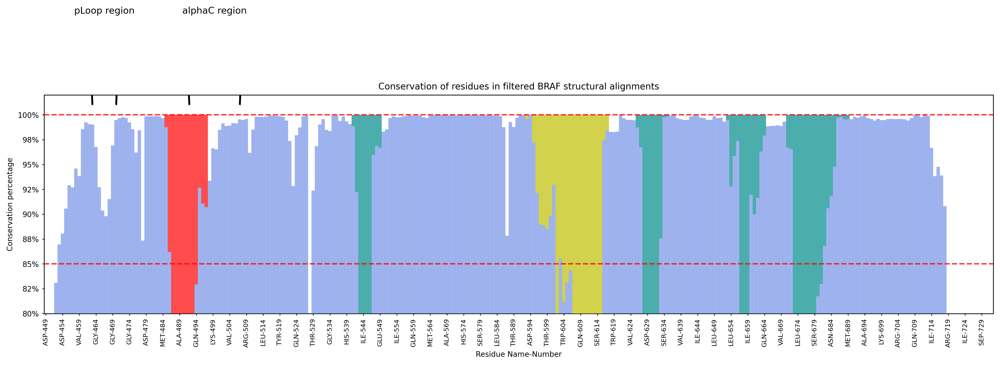

In [9]:
"""
Finding highly conserved residues (>97% conservation) in the filtered alignments
"""
from matplotlib.ticker import FuncFormatter
import matplotlib.patheffects as path_effects
import matplotlib.patches as patches

# Use the filtered alignments from the previous cell
filtered_aligned = new_aligned2
# Calculate conservation based on filtered alignments
seq1mag = len(filtered_aligned[0].seq1.replace("-",""))
counts = np.zeros(seq1mag)
total_alignments = len(filtered_aligned)

for a in filtered_aligned:
    print(a.name)
    segment = make_seg(a)
    print(segment)
    for i,(b,c) in enumerate(segment):
        if c != "-":
            counts[i] += 1

# Convert to conservation percentage
conservation = counts / total_alignments

# Find highly conserved residues (>97%)
highly_conserved = []
for i, cons_value in enumerate(conservation):
    if cons_value ==1.0:
        highly_conserved.append((i, braf_res()[i], cons_value))

# Print the highly conserved residues
print(f"\nHighly conserved residues (>85%) across {total_alignments} structures:")
for idx, res_name, cons_value in highly_conserved:
    print(f"Position {idx}: {res_name} - {cons_value:.1%} conservation")

# Print conservation percentage for positions 14-21
print("\nConservation percentages for positions 14-21 (pLoop region):")
for i in range(14, 22):
    if i < len(conservation):
        print(f"Position {i}: {braf_res()[i]} - {conservation[i]*100:.2f}%")

# Print conservation percentage for positions 43-58
print("\nConservation percentages for positions 43-58 (alphaC region):")
for i in range(43, 59):
    if i < len(conservation):
        print(f"Position {i}: {braf_res()[i]} - {conservation[i]*100:.2f}%")


# Optional: Plot the conservation histogram
fig, ax = plt.subplots(1, figsize=(15,6))
x = [*range(len(conservation))]
ax.set_xticks(x[::5])
x_lbl = braf_res()
ax.set_xticklabels(x_lbl[::5], rotation=90, fontsize=7)


# Create fully opaque blue bars 
bars = ax.bar(x, conservation, linewidth=0.05, width=1, color='royalblue', 
              alpha=0.5, edgecolor='steelblue', zorder=10)

# Add the colored areas ABOVE the bars
# Define color regions and their respective colors
color_regions = [
    (36, 48, 'r'),
    (92, 100, 'darkcyan'),
    (144, 168, 'y'),
    (177, 186, 'darkcyan'),
    (204, 215, 'darkcyan'),
    (222, 240, 'darkcyan')
]
# Highlight region between 14 and 21 with a parenthesis
from matplotlib.patches import Arc

# Parameters for the parenthesis
paren_x_start = 14
paren_x_end = 21
paren_y = 1.01  # y position just above the bars
paren_height = 0.08  # height of the parenthesis
paren_width = paren_x_end - paren_x_start

# Draw left parenthesis
arc_left = Arc(
    xy=(paren_x_start, paren_y + paren_height/2),
    width=0.5, height=paren_height,
    angle=0, theta1=90, theta2=270,
    color='black', lw=2, zorder=20
)
ax.add_patch(arc_left)

# Draw right parenthesis
arc_right = Arc(
    xy=(paren_x_end, paren_y + paren_height/2),
    width=0.5, height=paren_height,
    angle=0, theta1=-90, theta2=90,
    color='black', lw=2, zorder=20
)
ax.add_patch(arc_right)

# Optionally, add a label above the parenthesis
ax.text(
    (paren_x_start + paren_x_end)/2, paren_y + paren_height + 0.01,
    "pLoop region", ha='center', va='bottom', fontsize=10, color='black'
)
paren2_x_start = 43
paren2_x_end = 58

# Draw left parenthesis for 43-58
arc2_left = Arc(
    xy=(paren2_x_start, paren_y + paren_height/2),
    width=0.5, height=paren_height,
    angle=0, theta1=90, theta2=270,
    color='black', lw=2, zorder=20
)
ax.add_patch(arc2_left)

# Draw right parenthesis for 43-58
arc2_right = Arc(
    xy=(paren2_x_end, paren_y + paren_height/2),
    width=0.5, height=paren_height,
    angle=0, theta1=-90, theta2=90,
    color='black', lw=2, zorder=20
)
ax.add_patch(arc2_right)

# Optionally, add a label above the parenthesis
ax.text(
    (paren2_x_start + paren2_x_end)/2, paren_y + paren_height + 0.01,
    "alphaC region", ha='center', va='bottom', fontsize=10, color='black'
)

# For each region, add a colored rectangle only from the top of the bar to y=1
for start, end, color in color_regions:
    for i in range(start, end+1):
        if i < len(conservation):
            bar_height = conservation[i]
            # Only add the colored part above the bar
            rect_height = 1.0 - bar_height  # from bar top to y=1
            if rect_height > 0:  # only if there's space above the bar
                rect = patches.Rectangle((i-0.5, bar_height), 1, rect_height, 
                                      facecolor=color, alpha=0.7, zorder=5)
                ax.add_patch(rect)

# Highlight highly conserved regions with dashed line
ax.axhline(y=0.85, color='r', linestyle='--', alpha=0.8, zorder=15, label='>85% conservation')
ax.axhline(y=1.0, color='r', linestyle='--', alpha=0.8, zorder=15, label='>85% conservation')

# Set the x-axis limits precisely to eliminate white space at beginning and end
ax.set_xlim(-0.5, len(conservation)-0.5)
ax.set_ylim(0.8, 1.02)  # Set upper limit slightly above 1 to show the dashed line

# Set other formatting
ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: '{:.0%}'.format(y)))
ax.set_title("Conservation of residues in filtered BRAF structural alignments")
plt.xlabel("Residue Name-Number")
plt.ylabel("Conservation percentage")
#ax.legend()
ax.tick_params(length=2, color="black", direction="out")

# Adjust layout to minimize extra space
plt.tight_layout()
plt.show()

Visualise how sequences align due to MUSTANG alignment.

In [ ]:
import os
from glob import glob
from collections import defaultdict
import html

def clean_sequence(seq_str):
    """Remove newlines and convert to single string"""
    return ''.join(seq_str.split('\n')).strip()

def read_afasta_file(afasta_file):
    """Read an afasta file and return the reference and structure sequences"""
    sequences = []
    with open(afasta_file, 'r') as f:
        current_id = None
        current_seq = []
        for line in f:
            line = line.strip()
            if line.startswith('>'):
                if current_id is not None:
                    sequences.append((current_id, clean_sequence(''.join(current_seq))))
                current_id = line[1:].strip()
                current_seq = []
            else:
                current_seq.append(line)
        if current_id is not None:
            sequences.append((current_id, clean_sequence(''.join(current_seq))))
    return sequences  # Return all sequences in the file

def visualize_pairwise_alignments(mustang_dir="Results/activation_segments/mustangs", 
                                output_file="pairwise_alignments.html"):
    """
    Create a visualization where each structure sequence is shown with its 
    corresponding reference sequence above it (as in each .afasta file).
    """
    # Find all .afasta files
    afasta_files = sorted(glob(os.path.join(mustang_dir, "*/*.afasta")))
    
    # Process all alignment files
    alignments = []
    
    for afasta_file in afasta_files:
        sequences = read_afasta_file(afasta_file)
        
        # Skip if we don't have at least 2 sequences
        if len(sequences) < 2:
            print(f"Warning: Skipping {afasta_file} - not enough sequences")
            continue
        
        # Get reference and structure sequences
        ref_id, ref_seq = sequences[0]
        struct_id, struct_seq = sequences[1]
        
        # Add to our alignments list
        alignments.append({
            'file': os.path.basename(afasta_file),
            'reference': {
                'id': ref_id,
                'seq': ref_seq,
                'ungapped': len(ref_seq.replace('-', ''))
            },
            'structure': {
                'id': struct_id,
                'seq': struct_seq,
                'ungapped': len(struct_seq.replace('-', ''))
            }
        })
    
    # Generate HTML content
    html_content = """
    <!DOCTYPE html>
    <html>
    <head>
        <title>Pairwise MUSTANG Alignments</title>
        <style>
            body { font-family: monospace; }
            .container { margin-bottom: 40px; }
            .alignment-container { overflow-x: auto; white-space: nowrap; margin-top: 10px; }
            .sequence-row { margin: 2px 0; }
            .sequence-id { display: inline-block; width: 200px; font-weight: bold; }
            .sequence { letter-spacing: 0.5px; }
            .residue { display: inline-block; width: 10px; text-align: center; }
            .position-marker { color: #999; font-size: 0.8em; border-bottom: 1px solid #ccc; }
            .alignment-header { background-color: #f0f0f0; padding: 10px; margin-top: 20px; }
            .reference-row { color: #0066cc; }
            .structure-row { color: #cc6600; }
            h1, h2 { font-family: Arial, sans-serif; }
        </style>
    </head>
    <body>
        <h1>Pairwise MUSTANG Alignments</h1>
        <p>Each alignment is shown with the reference sequence above the structure sequence, exactly as in the original .afasta files.</p>
    """
    
    # Add each pairwise alignment
    for i, alignment in enumerate(alignments):
        html_content += f"""
        <div class="container">
            <div class="alignment-header">
                <h2>Alignment #{i+1}: {alignment['file']}</h2>
                <p><strong>Reference:</strong> {alignment['reference']['id']} ({alignment['reference']['ungapped']} residues)</p>
                <p><strong>Structure:</strong> {alignment['structure']['id']} ({alignment['structure']['ungapped']} residues)</p>
            </div>
            <div class="alignment-container">
                <!-- Position markers -->
                <div class="sequence-row position-marker">
                    <div class="sequence-id">Position</div>
                    <div class="sequence">
        """
        
        # Add position markers
        seq_length = len(alignment['reference']['seq'])
        for i in range(0, seq_length, 10):
            pos = str(i+1)
            html_content += f'<span class="residue">{pos[0]}</span>'
            for j in range(1, len(pos)):
                html_content += f'<span class="residue">{pos[j]}</span>'
            for j in range(len(pos), 10):
                html_content += f'<span class="residue">&nbsp;</span>'
        
        html_content += """
                    </div>
                </div>
        """
        
        # Add reference sequence
        html_content += f"""
                <div class="sequence-row reference-row">
                    <div class="sequence-id">{html.escape(alignment['reference']['id'])}</div>
                    <div class="sequence">
        """
        
        for residue in alignment['reference']['seq']:
            html_content += f'<span class="residue">{residue}</span>'
        
        html_content += """
                    </div>
                </div>
        """
        
        # Add structure sequence
        html_content += f"""
                <div class="sequence-row structure-row">
                    <div class="sequence-id">{html.escape(alignment['structure']['id'])}</div>
                    <div class="sequence">
        """
        
        for residue in alignment['structure']['seq']:
            html_content += f'<span class="residue">{residue}</span>'
        
        html_content += """
                    </div>
                </div>
            </div>
        </div>
        """
    
    # Close HTML
    html_content += """
    </body>
    </html>
    """
    
    # Write HTML file
    with open(output_file, 'w') as f:
        f.write(html_content)
    
    print(f"Pairwise alignment visualization created: {output_file}")
    print(f"Total alignments visualized: {len(alignments)}")

# Usage example:
if __name__ == "__main__":
    visualize_pairwise_alignments()

Code for aligning the ends of the activation loop. Here we are aligning the fully reconstructed loops.

In [3]:
from pymol import cmd
from glob import glob
import os
from Bio.PDB import PDBParser, PPBuilder

# Paths
pdb_dir = "Results/activation_segments/reconstructedModeller/"
reference_pdb = "6UAN_chainD.pdb"
output_dir = "Results/activation_segments/reconstructed_ends_aligned/"
# image_output_path = "Results/aligned_loops.png"

# Ensure output directory exists
os.makedirs(output_dir, exist_ok=True)

# Load the reference structure
cmd.load(reference_pdb, "6UAN_chainD")

# Create selections for the reference structure
cmd.select("6UAN_chainD_dfg_selection", "6UAN_chainD and resi 594-596 and name CA")
cmd.select("6UAN_chainD_ape_selection", "6UAN_chainD and resi 621-623 and name CA")
cmd.select("6UAN_chainD_ends_selection", "6UAN_chainD and (resi 594-596 or resi 621-623) and name CA")

def extract_atom_sequence(pdb_file):
    """Extract sequence from atomic coordinates for the first chain found in the PDB file."""
    parser = PDBParser(QUIET=True)
    structure = parser.get_structure('PDB', pdb_file)
    
    for model in structure:
        for chain in model:
            ppb = PPBuilder()
            sequence = ''
            for pp in ppb.build_peptides(chain):
                sequence += pp.get_sequence()
            return str(sequence)
    return None

def find_motif_indices(seq, motif):
    index = seq.find(motif)
    if index == -1:
        return None
    return index, index + len(motif)

def print_residues_in_selection(selection_name):
    model = cmd.get_model(selection_name)
    residues = set((atom.resi, atom.resn) for atom in model.atom)
    print(f"Residues in {selection_name}: {sorted(residues)}")

def process_structure(pdb_file, ref_name="6UAN_chainD"):
    pdb_code = os.path.basename(pdb_file).split('.')[0]
    cmd.load(pdb_file, pdb_code)

    # Extract sequence from atomic coordinates
    seq = extract_atom_sequence(pdb_file)
    if seq is None:
        print(f"Skipping {pdb_code} due to inability to extract sequence.")
        return
    print(f"Sequence for {pdb_code}: {seq}")

    # Find indices for DFG and APE
    dfg_indices = find_motif_indices(seq, "DFG")
    ape_indices = find_motif_indices(seq, "APE")

    if not dfg_indices or not ape_indices:
        print(f"Skipping {pdb_code} due to missing motifs.")
        return

    # Create selections using sequence indices
    dfg_residues = list(range(dfg_indices[0] + 1, dfg_indices[1] + 1))
    ape_residues = list(range(ape_indices[0] + 1, ape_indices[1] + 1))

    # Create selections
    cmd.select(f"{pdb_code}_dfg_selection", f"{pdb_code} and resi {dfg_residues[0]}-{dfg_residues[-1]} and name CA")
    cmd.select(f"{pdb_code}_ape_selection", f"{pdb_code} and resi {ape_residues[0]}-{ape_residues[-1]} and name CA")
    cmd.select(f"{pdb_code}_ends_selection", f"{pdb_code} and (resi {dfg_residues[0]}-{dfg_residues[-1]} or resi {ape_residues[0]}-{ape_residues[-1]}) and name CA")

    # Print residues in selections
    print_residues_in_selection(f"{pdb_code}_dfg_selection")
    print_residues_in_selection(f"{pdb_code}_ape_selection")
    print_residues_in_selection(f"{pdb_code}_ends_selection")

    # RMSD before alignment
    rms_dfg_before = cmd.rms_cur(f"{pdb_code}_dfg_selection", f"{ref_name}_dfg_selection", matchmaker=-1)
    rms_ape_before = cmd.rms_cur(f"{pdb_code}_ape_selection", f"{ref_name}_ape_selection", matchmaker=-1)
    rms_ends_before = cmd.rms_cur(f"{pdb_code}_ends_selection", f"{ref_name}_ends_selection", matchmaker=-1)

    print(f"Before alignment RMSD for {pdb_code}: DFG={rms_dfg_before}, APE={rms_ape_before}, ENDS={rms_ends_before}")

    # Aligning
    cmd.align(f"{pdb_code}_ends_selection", f"{ref_name}_ends_selection", cycles=0, transform=1)

    # Save aligned structure
    aligned_pdb_path = os.path.join(output_dir, f"{pdb_code}_aligned.pdb")
    cmd.save(aligned_pdb_path, pdb_code)
    print(f"Saved aligned structure to {aligned_pdb_path}")

    # RMSD after alignment
    rms_dfg_after = cmd.rms_cur(f"{pdb_code}_dfg_selection", f"{ref_name}_dfg_selection", matchmaker=-1)
    rms_ape_after = cmd.rms_cur(f"{pdb_code}_ape_selection", f"{ref_name}_ape_selection", matchmaker=-1)
    rms_ends_after = cmd.rms_cur(f"{pdb_code}_ends_selection", f"{ref_name}_ends_selection", matchmaker=-1)

    print(f"After alignment RMSD for {pdb_code}: DFG={rms_dfg_after}, APE={rms_ape_after}, ENDS={rms_ends_after}")

# Load all PDB files and process them
fps = glob(pdb_dir + "/*/*.pdb")
for fp in fps:
    print(fp)
    process_structure(fp)

# # Visualize and color
# cmd.select("all_loops", "byres 6UAN_chainD_ends_selection")
# cmd.color("red", "6UAN_chainD and 6UAN_chainD_ends_selection")
# cmd.color("white", "not 6UAN_chainD and all_loops")

# # Set visualization style
# cmd.show("cartoon")
# cmd.hide("lines")

# # Save the image
# cmd.png(image_output_path, width=1200, height=800, dpi=300, ray=1)
# print(f"Image saved to {image_output_path}")

cmd.quit()


Created/verified directories:
- Results/activation_segments/nonReconstructed4Mustang_filtered/
- Results/
Starting filtering process. Working directory: /home/marmatt/Documents/projects/BRAF/myWork/8kStructures
Using input directory: Results/activation_segments/nonReconstructed4Mustang/
Output directory: Results/activation_segments/nonReconstructed4Mustang_filtered/
Filtering structures based on presence of DFG and APE motifs...
Found 3845 PDB files to check.

Checking 3QXP_A...
  - Found DFG at position 140 and APE at position 165
  - Copying to Results/activation_segments/nonReconstructed4Mustang_filtered/3QXP_A.pdb

Checking 8P5K_C...
  - Found DFG at position 153 and APE at position 176
  - Copying to Results/activation_segments/nonReconstructed4Mustang_filtered/8P5K_C.pdb

Checking 5C46_E...
  - Found motifs but in wrong order or too close: DFG(367) and APE(108)

Checking 1XH7_A...
  - Found DFG at position 172 and APE at position 193
  - Copying to Results/activation_segments/non

Code for secondary structure alignment. Here we are aligning the fully reconstructed loops.

In [ ]:
import os
import shutil
from glob import glob

import mdtraj as md
from pymol import cmd
from collections import defaultdict, Counter

###############################################################################
# PART A: Utility functions
###############################################################################
def find_dfg_motif_index(residues):
    """
    Find the mdtraj residue index of 'ASP' in the DFG motif (ASP,PHE,GLY).
    Returns None if not found.
    """
    for i in range(len(residues) - 2):
        if (residues[i].name.startswith('ASP') and
            residues[i+1].name.startswith('PHE') and
            residues[i+2].name.startswith('GLY')):
            return i
    return None

def find_ape_motif_index(residues):
    """
    Find the mdtraj residue index of 'GLU' in the APE motif (ALA,PRO,GLU).
    Returns None if not found.
    """
    for i in range(len(residues) - 2):
        if (residues[i].name.startswith('ALA') and
            residues[i+1].name.startswith('PRO') and
            residues[i+2].name.startswith('GLU')):
            return i + 2
    return None

def make_resi_selection(object_name, residue_indices):
    """
    Convert a list of PDB residue numbers (not zero-based mdtraj indices)
    to a PyMOL selection of CA atoms:
    e.g. "object_name and name CA and (resi 10 or resi 11 or ...)".
    """
    if not residue_indices:
        return f"{object_name} and name CA"
    parts = [f"resi {resi_num}" for resi_num in residue_indices]
    joined = " or ".join(parts)
    return f"{object_name} and name CA and ({joined})"


###############################################################################
# PART B: Calculate secondary structure conservation with offset logic
###############################################################################
def calculate_secondary_structure_conservation(
    directory,
    reference_pdb,
    max_structures=800
):
    """
    1) Load reference, locate D/E => dRef, eRef. 
       Define slices: [dRef-46..dRef], [eRef..eRef+9].
    2) For each structure's D/E => dStruct, eStruct => offsets. 
       Gather DSSP for that same region in the target.
    3) Determine "conserved residues" by global frequency > 0.97, not coil, 
       matching reference assignment.
    4) Return a dict => { "pdbfile": { 
         "ref_indices": [...], "targ_indices": [...],
         "conserved_info": [ (refIdx, refName, structIdx, structName), ... ] 
       } }
    5) Also copy those PDBs into "Results/activation_segments/mustangs_conserved_secondary".
    6) Print the per-residue index & name for both reference and each structure 
       that passes the final test.
    """
    print("[INFO] Loading reference structure...")
    ref_traj = md.load(reference_pdb)
    ref_residues = list(ref_traj.topology.residues)
    ref_dssp = md.compute_dssp(ref_traj)[0]
    
    # DEBUG
    print(f"[DEBUG] Reference has {len(ref_residues)} residues.")
    
    # Find D/E in the reference
    dRef = find_dfg_motif_index(ref_residues)
    eRef = find_ape_motif_index(ref_residues)
    print(f"[DEBUG] Found DFG motif at ref residue index = {dRef}")
    print(f"[DEBUG] Found APE motif at ref residue index = {eRef}")
    
    if dRef is None or eRef is None:
        print("[WARNING] Reference doesn't have DFG or APE motif. Aborting.")
        return {}

    if dRef < 46 or (eRef + 9) >= len(ref_residues):
        print("[WARNING] Reference is too short for D-46..D, E..E+9 slices. Aborting.")
        return {}

    # Reference slices
    ref_d_slice = ref_residues[dRef - 46 : dRef + 1]  # e.g. 46 residues plus D
    ref_e_slice = ref_residues[eRef : eRef + 10]      # E..E+9
    all_ref_slice = ref_d_slice + ref_e_slice
    
    # DEBUG
    print("[DEBUG] Reference D-slice (indices):", [r.index for r in ref_d_slice])
    print("[DEBUG] Reference E-slice (indices):", [r.index for r in ref_e_slice])

    # Store reference assignment & names. Also store PDB numbering for each residue.
    reference_assignments = {}
    reference_names = {}
    reference_resnums = {}
    for r in all_ref_slice:
        reference_assignments[r] = ref_dssp[r.index]
        reference_names[r] = r.name
        # This is the actual PDB residue number from the topology
        reference_resnums[r] = r.resSeq

    # DEBUG: Print out the reference secondary structure for that slice
    for r in all_ref_slice:
        print(f"[DEBUG] Ref Slice Residue: idx={r.index}, name={r.name}, SS={reference_assignments[r]}")

    structure_assignments = {}
    structure_resnames = {}
    motif_map = {}
    structure_resnums = {}  # (sid, referenceResidue) -> target's PDB numbering

    def enough_structures_so_far():
        # If we have enough structures for the first residue in ref_d_slice
        if not ref_d_slice:
            return True
        first_r = ref_d_slice[0]
        used_ids = {sid for (sid, rr) in structure_assignments if rr == first_r}
        return len(used_ids) >= max_structures

    # Collect from directory
    subdirs = [d for d in os.listdir(directory) if os.path.isdir(os.path.join(directory, d))]
    print(f"[DEBUG] Found {len(subdirs)} subdirectories in {directory}")

    for subdir in subdirs:
        if enough_structures_so_far():
            break
        sub_path = os.path.join(directory, subdir)
        pdb_files = [f for f in os.listdir(sub_path) if f.endswith(".pdb")]
        
        # DEBUG
        print(f"[DEBUG] Checking subdirectory: {subdir}, found {len(pdb_files)} pdb files")

        for pdb_file in pdb_files:
            if enough_structures_so_far():
                break

            full_path = os.path.join(sub_path, pdb_file)
            traj = md.load(full_path)
            residues = list(traj.topology.residues)

            # DEBUG
            print(f"[DEBUG] Loading {pdb_file}: total residues={len(residues)}")

            dS = find_dfg_motif_index(residues)
            eS = find_ape_motif_index(residues)
            if dS is None or eS is None:
                print(f"[DEBUG] {pdb_file}: missing DFG or APE motif.")
                continue
            if dS < 46 or (eS + 9) >= len(residues):
                print(f"[DEBUG] {pdb_file}: cannot slice [D-46..D], [E..E+9], skipping.")
                continue

            dssp_vals = md.compute_dssp(traj)[0]
            struct_d_slice = residues[dS - 46 : dS + 1]
            struct_e_slice = residues[eS : eS + 10]

            # DEBUG
            print(f"[DEBUG] {pdb_file}: D-slice indices={[r.index for r in struct_d_slice]}")
            print(f"[DEBUG] {pdb_file}: E-slice indices={[r.index for r in struct_e_slice]}")

            sid = f"{subdir}/{pdb_file}"
            motif_map[sid] = (dS, eS)

            # Build mapping from the reference's D/E slice to the target's
            for i, rRef in enumerate(ref_d_slice):
                sRes = struct_d_slice[i]
                structure_assignments[(sid, rRef)] = dssp_vals[sRes.index]
                structure_resnames[(sid, rRef)] = (sRes.name, sRes.index)
                # Store the PDB residue number for actual PyMOL selection
                structure_resnums[(sid, rRef)] = sRes.resSeq

            for i, rRef in enumerate(ref_e_slice):
                sRes = struct_e_slice[i]
                structure_assignments[(sid, rRef)] = dssp_vals[sRes.index]
                structure_resnames[(sid, rRef)] = (sRes.name, sRes.index)
                # Store the PDB residue number
                structure_resnums[(sid, rRef)] = sRes.resSeq

    # Analyze global frequency
    residue_to_assigns = defaultdict(list)
    for (sid, rRef), dchar in structure_assignments.items():
        if rRef in all_ref_slice:
            residue_to_assigns[rRef].append(dchar)

    print("[DEBUG] Counting assignments per reference residue across all structures...")

    def analyze_conservation(data):
        out = {}
        for r, assigns in data.items():
            if not assigns:
                out[r] = {"most_common": "-", "frequency": 0.0}
            else:
                c = Counter(assigns)
                mc, cnt = c.most_common(1)[0]
                freq = cnt / len(assigns)
                out[r] = {"most_common": mc, "frequency": freq}
        return out

    conservation = analyze_conservation(residue_to_assigns)

    # Decide which residues are "conserved"
    conserved_residues = []
    for rRef in all_ref_slice:
        if rRef not in conservation:
            continue
        mc = conservation[rRef]["most_common"]
        freq = conservation[rRef]["frequency"]
        print(f"[DEBUG] Residue rRef.idx={rRef.index}, refSS={reference_assignments[rRef]}, most_common={mc}, freq={freq:.3f}")

        if freq > 0.97 and mc != 'C' and mc == reference_assignments[rRef]:
            conserved_residues.append(rRef)
    conserved_residues.sort(key=lambda x: x.index)

    print("\n[INFO] Conserved residues in the reference:")
    for rRef in conserved_residues:
        mc = conservation[rRef]["most_common"]
        freq = conservation[rRef]["frequency"]
        print(f"  RefIndex={rRef.index}, Name={rRef.name}, freq={freq:.3f}, SS={mc}")

    target_dir = "Results/activation_segments/reconstructed_conserved_secondary"
    os.makedirs(target_dir, exist_ok=True)

    all_struct_ids = {s for (s, rr) in structure_assignments}
    selected_structures_dict = {}

    dRef_start = dRef - 46
    dRef_end   = dRef
    eRef_start = eRef
    eRef_end   = eRef + 9
    
    print(f"[DEBUG] Reference slices: D-slice=({dRef_start}..{dRef_end}), E-slice=({eRef_start}..{eRef_end})")

    # Check each structure for "pass"
    for sid in all_struct_ids:
        pass_all = True
        for rRef in conserved_residues:
            if (sid, rRef) not in structure_assignments:
                pass_all = False
                break
            if structure_assignments[(sid, rRef)] != reference_assignments[rRef]:
                pass_all = False
                break
        
        if not pass_all:
            continue

        subd, pdbfile = sid.split('/', 1)
        dS, eS = motif_map[sid]
        offsetD = dS - dRef
        offsetE = eS - eRef
        
        print(f"[DEBUG] PASSING structure: {sid}; dS={dS}, eS={eS}, offsetD={offsetD}, offsetE={offsetE}")

        ref_list  = []
        targ_list = []
        info_list = []

        for rRef in conserved_residues:
            iRef = rRef.index
            rRefName = rRef.name

            # Original offset logic to see which slice it's in
            if dRef_start <= iRef <= dRef_end:
                iTarg = iRef + offsetD
            elif eRef_start <= iRef <= eRef_end:
                iTarg = iRef + offsetE
            else:
                continue

            # Instead of the zero-based indices, we put the actual PDB numbering:
            pdbRefNum = reference_resnums[rRef]
            if (sid, rRef) in structure_resnums:
                pdbTargNum = structure_resnums[(sid, rRef)]
            else:
                pdbTargNum = iTarg  # fallback (unlikely)

            # For PyMOL alignment, we want the real PDB numbers
            ref_list.append(pdbRefNum)
            targ_list.append(pdbTargNum)

            # Keep the same print statement data
            if (sid, rRef) in structure_resnames:
                (targetName, targetIdx) = structure_resnames[(sid, rRef)]
            else:
                targetName = "???"
                targetIdx = iTarg

            # info_list is the data in your final print statement
            info_list.append((iRef, rRefName, targetIdx, targetName))

        selected_structures_dict[pdbfile] = {
            "ref_indices": ref_list,
            "targ_indices": targ_list,
            "conserved_info": info_list
        }

        src_path = os.path.join(directory, subd, pdbfile)
        dst_path = os.path.join(target_dir, pdbfile)
        if os.path.isfile(src_path):
            shutil.copy2(src_path, dst_path)

    print("\n[INFO] Final conserved structures & residues (reference -> target):")
    for pdbfile, val in selected_structures_dict.items():
        print(f"  Structure: {pdbfile}")
        for (iRef, nmRef, iTarg, nmTarg) in val["conserved_info"]:
            print(f"    RefIdx={iRef}({nmRef}) => TargIdx={iTarg}({nmTarg})")

    return selected_structures_dict


###############################################################################
# PART C: Realign structures in PyMOL using the offset-based indices
###############################################################################
def realign_conserved_structures(
    selected_structures_dict,
    reference_pdb,
    source_dir="Results/activation_segments/reconstructed_conserved_secondary",
    output_dir="Results/activation_segments/mustangs_realigned_secondary",
    reference_object_name="reference"
):
    """
    For each structure in 'selected_structures_dict':
      - We have a list of 'ref_indices' for the reference 
        and 'targ_indices' for the target. 
      - Load them in PyMOL, build two selections, do alignment, save.
    Also prints the before/after RMS.
    """

    os.makedirs(output_dir, exist_ok=True)
    
    # DEBUG
    print(f"[DEBUG] Realign: reference={reference_pdb}, source={source_dir}, output={output_dir}")

    # Load reference
    cmd.load(reference_pdb, reference_object_name)
    print("Num atoms in ref sel:", cmd.count_atoms(f"{reference_object_name} and name CA"))
    cmd.select("checkIndex", f"{reference_object_name} and resi 500 and name CA")
    print("Check residue 500:", cmd.count_atoms("checkIndex"))

    cmd.hide("everything", reference_object_name)
    cmd.show("cartoon", reference_object_name)
    cmd.color("cyan", reference_object_name)

    all_pdbs = glob(os.path.join(source_dir, "*.pdb"))
    print(f"[INFO] Found {len(all_pdbs)} .pdb in {source_dir}")

    def process_structure(pdb_path, ref_list, targ_list):
        pdb_file = os.path.basename(pdb_path)
        obj_name = os.path.splitext(pdb_file)[0]
        cmd.load(pdb_path, obj_name)

        # Now ref_list/targ_list are PDB residue numbers. 
        sel_ref  = make_resi_selection(reference_object_name, ref_list)
        sel_targ = make_resi_selection(obj_name, targ_list)

        # DEBUG
        print(f"[DEBUG] process_structure => {pdb_file}")
        print(f"[DEBUG] - ref_list={ref_list}")
        print(f"[DEBUG] - targ_list={targ_list}")
        print(f"[DEBUG] - sel_ref={sel_ref}")
        print(f"[DEBUG] - sel_targ={sel_targ}")

        n_ref  = cmd.count_atoms(sel_ref)
        n_targ = cmd.count_atoms(sel_targ)
        if n_ref != n_targ or n_ref == 0:
            print(f"  [WARNING] {pdb_file}: mismatch in selection sizes ({n_ref} vs {n_targ}). Skipping.")
            cmd.delete(obj_name)
            return

        rms_before = cmd.rms_cur(sel_targ, sel_ref, matchmaker=-1)
        print(f"  RMS before alignment for {pdb_file}: {rms_before:.3f} Å")

        cmd.super(sel_targ, sel_ref)

        rms_after = cmd.rms_cur(sel_targ, sel_ref, matchmaker=-1)
        print(f"  RMS after alignment for {pdb_file}: {rms_after:.3f} Å")

        out_pdb = os.path.join(output_dir, pdb_file)
        cmd.save(out_pdb, obj_name)
        print(f"  [INFO] Saved aligned => {out_pdb}")

        cmd.delete(obj_name)

    for pdb_path in all_pdbs:
        pdb_file = os.path.basename(pdb_path)
        if pdb_file in selected_structures_dict:
            ref_list  = selected_structures_dict[pdb_file]["ref_indices"]
            targ_list = selected_structures_dict[pdb_file]["targ_indices"]
            print(f"\n[INFO] Aligning {pdb_file} with {len(ref_list)} 'conserved' residues.")
            process_structure(pdb_path, ref_list, targ_list)
        else:
            print(f"[INFO] Skipping {pdb_file} (not in dictionary).")

    out_img = os.path.join(output_dir, "aligned_loops_offset.png")
    cmd.png(out_img, width=1200, height=800, dpi=300, ray=1)
    print(f"\n[INFO] Saved alignment image => {out_img}")

    # If you prefer to quit PyMOL automatically, uncomment the next line:
    # cmd.quit()


###############################################################################
# PART D: Example usage
###############################################################################
if __name__ == "__main__":

    # 1) Identify "conserved" residues across all structures
    #    and produce offset-based indexes for each structure.
    selected_structs = calculate_secondary_structure_conservation(
        directory="Results/activation_segments/mustangs",
        reference_pdb="6UAN_chainD.pdb",
        max_structures=800
    )

    # 2) Realign those structures in PyMOL
    realign_conserved_structures(
        selected_structures_dict=selected_structs,
        reference_pdb="6UAN_chainD.pdb",
        source_dir="Results/activation_segments/mustangs_conserved_secondary",
        output_dir="Results/activation_segments/mustangs_realigned_secondary",
        reference_object_name="reference"
    )



Code for checking alignment has been done correctly.

In [ ]:
import biobox as bb
import glob
import numpy as np

################################################################################
# Code to save only the first and last CA atoms in activation segment PDB files 
# both before and after Mustang realignment, for quick verification.
################################################################################
# --- BEFORE ENDS REALIGNMENT ---
files_before = f"Results/activation_segments/mustangs/*/*.pdb"

start_before = []
end_before = []

for f in glob.glob(files_before):
    M = bb.Molecule(f)
    pts = M.atomselect("*", "*", "CA")
    start_before.append(pts[0])
    end_before.append(pts[-1])

M_start_before = bb.Structure(p=np.array(start_before))
M_end_before = bb.Structure(p=np.array(end_before))

M_start_before.write_pdb("start_CA_beforeReAlign.pdb")
M_end_before.write_pdb("end_CA_beforeReAlign.pdb")

# --- AFTER ENDS REALIGNMENT ---
files_after = f"Results/activation_segments/mustangs_realigned/*.pdb"
start_after = []
end_after = []

for f in glob.glob(files_after):
    M = bb.Molecule(f)
    pts = M.atomselect("*", "*", "CA")
    start_after.append(pts[0])
    end_after.append(pts[-1])

M_start_after = bb.Structure(p=np.array(start_after))
M_end_after = bb.Structure(p=np.array(end_after))

M_start_after.write_pdb("start_CA_afterReAlign.pdb")
M_end_after.write_pdb("end_CA_afterReAlign.pdb")

# --- AFTER SCONDARY STRUCTURE REALIGNMENT ---
files_after = f"Results/activation_segments/mustangs_conserved_secondary/*.pdb"
start_after = []
end_after = []

for f in glob.glob(files_after):
    M = bb.Molecule(f)
    pts = M.atomselect("*", "*", "CA")
    start_after.append(pts[0])
    end_after.append(pts[-1])

M_start_after = bb.Structure(p=np.array(start_after))
M_end_after = bb.Structure(p=np.array(end_after))

M_start_after.write_pdb("start_CA_afterReAlign_secondary.pdb")
M_end_after.write_pdb("end_CA_afterReAlign.pdb_secondary.pdb")


In [ ]:
import mdtraj as md
import os
from glob import glob
from tqdm import tqdm

###############################################################################
# Function to load a PDB file and strip it down to CA atoms from a specified
# start_residue to an end_residue (indices are 0-based).
###############################################################################
def strip_to_ca(pdb_path, start_residue, end_residue):
    """
    Loads the PDB, extracts CA atoms for residues in the specified slice,
    and returns an mdtraj.Trajectory object with just those atoms.
    """
    pdb = md.load(pdb_path)
    print(f"Loaded PDB: {pdb_path}")

    # Extract CA atoms within the specified range of residues
    atom_indices = [
        atom.index 
        for res in pdb.top._residues[start_residue:end_residue] 
        for atom in res.atoms 
        if atom.name == "CA"
    ]
    print(f"Atom indices for CA: {atom_indices}")

    return pdb.atom_slice(atom_indices)

###############################################################################
# Function to process alignments by looking for the DFG and APE motifs in seq1,
# verifying alignment in seq2, and saving out the PDB stripped to CA atoms only.
###############################################################################
def process_alignments(pdb_dir, target_dir, alignments):
    """
    Parameters
    ----------
    pdb_dir : str
        Directory where the PDB files are stored (e.g., mustangs or mustangs_realigned).
    target_dir : str
        Directory where stripped PDBs will be saved.
    alignments : list
        A list of alignment objects, each with attributes like:
          - name
          - seq1 (aligned sequence 1)
          - seq2 (aligned sequence 2)
    """
    # Ensure the target directory exists
    os.makedirs(target_dir, exist_ok=True)
    print(f"\nProcessing:\n  PDB directory = {pdb_dir}\n  Target directory = {target_dir}")

    # Find all PDB files in pdb_dir
    pdb_files = glob(os.path.join(pdb_dir, "*.pdb"))
    print(f"Found PDB files: {pdb_files}")

    # Process each alignment in alignments
    for align_obj in tqdm(alignments, desc="Processing alignments"):
        print(f"\nChecking alignment: {align_obj.name}")
        match_found = False
        matching_fp = ""

        # Look for a matching PDB file
        for fp in pdb_files:
            if align_obj.name in fp and "pdb" in fp:
                match_found = True
                matching_fp = fp
                print(f"Match found for {align_obj.name} in file: {fp}")
                break
        
        if not match_found:
            print(f"No match found for {align_obj.name}, skipping.")
            continue

        # Indices of DFG and APE in seq1
        DFG_index = align_obj.seq1.find("DFG")
        APE_index = align_obj.seq1.find("APE")
        print(f"DFG index (in seq1): {DFG_index} | APE index (in seq1): {APE_index}")

        # Skip if DFG/APE motifs are not found
        if DFG_index == -1 or APE_index == -1:
            print(f"Skipping file {matching_fp} as it does not contain the DFG or APE motifs in seq1.")
            continue

        # Check if the same segment (DFG) is also aligned in seq2
        # (i.e., we want seq2 to also have the substring "DFG" in the same place):
        if align_obj.seq2[DFG_index:DFG_index + 3] != "DFG":
            print(f"Skipping file {matching_fp} as the DFG motif is not aligned properly in seq2.")
            continue

        # Adjust DFG and APE indices to account for gaps in seq2
        DFG_index_adjusted = DFG_index - sum([1 for a in align_obj.seq2[:DFG_index] if a == "-"])
        APE_index_adjusted = APE_index - sum([1 for a in align_obj.seq2[:APE_index] if a == "-"])
        print(f"Adjusted DFG index: {DFG_index_adjusted} | Adjusted APE index: {APE_index_adjusted}")

        # Strip to CA atoms between the adjusted DFG and APE (including the 3 residues of "APE")
        stripped = strip_to_ca(matching_fp, DFG_index_adjusted, APE_index_adjusted + 3)

        # Construct the file name and save the stripped pdb
        new_name = os.path.join(target_dir, os.path.basename(matching_fp))
        print(f"Saving stripped PDB to: {new_name}")
        stripped.save(new_name)


###############################################################################
# Example usage
###############################################################################
if __name__ == "__main__":
    
    
    # 1) Process for the ends realigned directory
    pdb_dir_realigned = "Results/activation_segments/mustangs_realigned/"
    target_dir_realigned = f"Results/activation_segments/CA_segments/mustangs_endsRealignment"
    process_alignments(pdb_dir_realigned, target_dir_realigned, new_aligned2)

    # 2) Process for the non-realigned Mustang directory
    pdb_dir_no_realign = "Results/activation_segments/mustangs/*/"
    target_dir_no_realign = "Results/activation_segments/CA_segments/mustangs_noRealignment"
    process_alignments(pdb_dir_no_realign, target_dir_no_realign, new_aligned2)

    # 3) Process for the secondary structure realigned directory
    pdb_dir_second_realign = "Results/activation_segments/mustangs_conserved_secondary/"
    target_dir_second_realign = "Results/activation_segments/CA_segments/mustangs_secondaryRealignment"
    process_alignments(pdb_dir_second_realign, target_dir_second_realign, new_aligned2)


Input directory: /home/marmatt/Documents/projects/BRAF/myWork/8kStructures/Results/activation_segments/nonReconstructed4Mustang_filtered
Output directory: /home/marmatt/Documents/projects/BRAF/myWork/8kStructures/Results/activation_segments/nonReconstructed_filtered_mustang
Template PDB: /home/marmatt/Documents/projects/BRAF/myWork/8kStructures/6UAN_chainD.pdb
Found 3808 PDB files to process
Running MUSTANG: /home/marmatt/Downloads/MUSTANG_v3.2.4/bin/mustang-3.2.4 -i /home/marmatt/Documents/projects/BRAF/myWork/8kStructures/6UAN_chainD.pdb /home/marmatt/Documents/projects/BRAF/myWork/8kStructures/Results/activation_segments/nonReconstructed4Mustang_filtered/3QXP_A.pdb -o /home/marmatt/Documents/projects/BRAF/myWork/8kStructures/Results/activation_segments/nonReconstructed_filtered_mustang/3QXP_A/3QXP_A -F fasta -s ON
Successfully aligned 3QXP_A, saved to /home/marmatt/Documents/projects/BRAF/myWork/8kStructures/Results/activation_segments/nonReconstructed_filtered_mustang/3QXP_A/3QXP_A

In [ ]:
import mdtraj as md
import os
from glob import glob
from tqdm import tqdm

import glob
def analyze_ca_segments(ca_segments_dir):
    """
    Analyzes PDB files in the specified directory to generate:
    1. A histogram of the number of CA atoms in each file
    2. A histogram of end-to-end distances for each loop
    
    Parameters
    ----------
    ca_segments_dir : str
        Directory containing the stripped PDB files with CA atoms
    
    Returns
    -------
    tuple
        (ca_counts, end_to_end_distances) for further analysis if needed
    """
    # Find all PDB files in the specified directory
    pdb_files = glob(os.path.join(ca_segments_dir, "*.pdb"))
    print(f"Found {len(pdb_files)} PDB files in {ca_segments_dir}")
    
    # Lists to store results
    ca_counts = []
    end_to_end_distances = []
    
    # Process each PDB file
    for pdb_file in tqdm(pdb_files, desc="Analyzing CA segments"):
        try:
            # Load the PDB file
            traj = md.load(pdb_file)
            
            # Count the number of CA atoms
            num_ca = traj.n_atoms
            ca_counts.append(num_ca)
            
            # Calculate end-to-end distance (first CA to last CA)
            if num_ca >= 2:
                # Get coordinates of first and last CA atoms
                first_ca = traj.xyz[0, 0]  # First frame, first atom
                last_ca = traj.xyz[0, -1]  # First frame, last atom
                
                # Calculate Euclidean distance
                distance = np.sqrt(np.sum((first_ca - last_ca)**2)) * 10  # Convert to Angstroms
                end_to_end_distances.append(distance)
            else:
                print(f"Warning: {pdb_file} has fewer than 2 atoms, skipping distance calculation")
                
        except Exception as e:
            print(f"Error processing {pdb_file}: {e}")
    
    # Plot histogram of CA atom counts with distribution outline and median line
    plt.figure(figsize=(10, 6))
    
    # Plot the histogram
    n, bins, patches = plt.hist(ca_counts, bins=20, alpha=0.7, color='skyblue', edgecolor='black')
    
    # Calculate bin centers for KDE
    bin_centers = 0.5 * (bins[1:] + bins[:-1])
    
    # Calculate the median
    median_ca = np.median(ca_counts)
    
    # Use scipy's gaussian_kde to create a kernel density estimate
    from scipy import stats
    if len(ca_counts) > 1:  # Need at least 2 points for KDE
        kde = stats.gaussian_kde(ca_counts)
        # Scale KDE to match histogram height
        scale_factor = max(n) / kde(bin_centers).max()
        kde_curve = kde(np.linspace(min(ca_counts), max(ca_counts), 1000)) * scale_factor
        
        # Plot KDE as distribution outline
        plt.plot(np.linspace(min(ca_counts), max(ca_counts), 1000), 
                 kde_curve, 
                 'k-', linewidth=2, label='Density Estimate')
    
    # Add vertical line for median
    plt.axvline(x=median_ca, color='red', linestyle='--', linewidth=2, label=f'Median: {median_ca}')
    
    plt.xlabel('Number of CA atoms')
    plt.ylabel('Frequency')
    plt.title(f'Distribution of CA Atom Counts in activation loops')
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.savefig(f"{ca_segments_dir}/ca_counts_histogram.png", dpi=300, bbox_inches='tight')
    plt.show()
    
    # Plot histogram of end-to-end distances with distribution outline and median line
    if end_to_end_distances:
        plt.figure(figsize=(10, 6))
        
        # Plot the histogram
        n, bins, patches = plt.hist(end_to_end_distances, bins=20, alpha=0.7, color='salmon', edgecolor='black')
        
        # Calculate bin centers for KDE
        bin_centers = 0.5 * (bins[1:] + bins[:-1])
        
        # Calculate the median
        median_dist = np.median(end_to_end_distances)
        
        # Use scipy's gaussian_kde to create a kernel density estimate
        if len(end_to_end_distances) > 1:  # Need at least 2 points for KDE
            kde = stats.gaussian_kde(end_to_end_distances)
            # Scale KDE to match histogram height
            scale_factor = max(n) / kde(bin_centers).max()
            kde_curve = kde(np.linspace(min(end_to_end_distances), max(end_to_end_distances), 1000)) * scale_factor
            
            # Plot KDE as distribution outline
            plt.plot(np.linspace(min(end_to_end_distances), max(end_to_end_distances), 1000), 
                     kde_curve, 
                     'k-', linewidth=2, label='Density Estimate')
        
        # Add vertical line for median
        plt.axvline(x=median_dist, color='red', linestyle='--', linewidth=2, 
                    label=f'Median: {median_dist:.2f} Å')
        
        plt.xlabel('End-to-End Distance (Å)')
        plt.ylabel('Frequency')
        plt.title(f'Distribution of End-to-End Distances in activation loops')
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.savefig(f"{ca_segments_dir}/end_to_end_distances_histogram.png", dpi=300, bbox_inches='tight')
        plt.show()
    
    return ca_counts, end_to_end_distances

# Run the analysis for the no-realignment segments
print("\nAnalyzing CA segments in the no-realignment directory...")
ca_dir = "Results/activation_segments/CA_segments/mustangs_noRealignment"
ca_counts, distances = analyze_ca_segments(ca_dir)

# Print summary statistics
print(f"\nSummary Statistics for {ca_dir}:")
print(f"Number of loops analyzed: {len(ca_counts)}")
print(f"CA atom counts - Min: {min(ca_counts)}, Max: {max(ca_counts)}, Mean: {np.mean(ca_counts):.2f}, Median: {np.median(ca_counts)}")
if distances:
    print(f"End-to-end distances - Min: {min(distances):.2f}Å, Max: {max(distances):.2f}Å, Mean: {np.mean(distances):.2f}Å, Median: {np.median(distances):.2f}Å")

FileNotFoundError: [Errno 2] No such file or directory: 'Results/activation_segments/mustangs'

In [ ]:
import os
from Bio import PDB
import numpy as np
from scipy.interpolate import interp1d
import tempfile
import mdtraj as md

def fitting_code(fp_or_traj, save_path):
    # Function to read PDB file or trajectory object and get model
    def read_structure(input_data):
        if isinstance(input_data, str):
            # If input is a string, treat it as a file path
            parser = PDB.PDBParser(QUIET=True)
            structure = parser.get_structure('structure', input_data)
        elif isinstance(input_data, md.Trajectory):
            # If input is a trajectory, save to temp PDB and read
            with tempfile.NamedTemporaryFile(suffix=".pdb", delete=False) as tmpfile:
                input_data.save(tmpfile.name)
                tmpfile.close()
                parser = PDB.PDBParser(QUIET=True)
                structure = parser.get_structure('structure', tmpfile.name)
            os.unlink(tmpfile.name)
        else:
            raise ValueError("Unsupported input type. Provide a file path or md.Trajectory.")
        return structure[0]

    # Read the template for CA atoms configuration
    template_model = read_structure('template.pdb')
    Nnew = len([atom for atom in template_model.get_atoms() if atom.get_id() == 'CA'])

    # Read input PDB file or trajectory
    my_model = read_structure(fp_or_traj)
    atom_list = [atom for atom in my_model.get_atoms() if atom.get_id() == 'CA']

    # Coordinates for each CA atom
    avg = np.array([atom.coord for atom in atom_list])
    n = len(atom_list)

    # Fit cubic interpolation for each axis (x, y, z)
    dims = ['x', 'y', 'z']
    fits = {}
    for j, dim in enumerate(dims):
        fits[dim] = interp1d(np.arange(n), avg[:, j], kind='cubic', fill_value='extrapolate')

    # Create a finer grid of points (X) for interpolation
    X = np.arange(0, n - 1, 0.1) 
    # Gradient in each dimension
    dYdX = {dim: np.gradient(fits[dim](X)) for dim in dims}
    # Speed along path (magnitude of the gradient)
    Y = np.sqrt(sum(np.square(dYdX[dim]) for dim in dims))
    # Total arc length (area under the speed curve)
    L = np.trapz(Y, X)

    # Create an evenly spaced set of arc lengths (Li)
    Li = np.linspace(0, L, Nnew)

    # Precompute partial arc length at each step in X
    flen = np.array([np.trapz(Y[:ibig], X[:ibig]) for ibig in range(1, len(X))])

    # For each required point (Nnew), find the corresponding index in X
    pt = np.zeros(Nnew, dtype=int)
    for i in range(Nnew):
        pt[i] = np.argmin(np.abs(flen - Li[i]))

    # Interpolated 3D coordinates for each new point
    new_coords = np.array([[fits[dim](X[pt[i]]) for dim in dims] for i in range(Nnew)])

    # Update the template CA positions with interpolated coordinates
    ca_index = 0
    for atom in template_model.get_atoms():
        if atom.get_id() == 'CA':
            atom.set_coord(new_coords[ca_index])
            ca_index += 1

    # Save the updated structure
    try:
        with open(save_path, "w") as file:
            io = PDB.PDBIO()
            io.set_structure(template_model)
            io.save(file)
        print(f'Successfully saved the structure to {save_path}')
    except Exception as e:
        print(f"Error during file save: {e}")


###############################################################################
# Process two different input/output directory pairs:
#   1) mustangs_endsRealignment
#   2) mustangs_noRealignment
###############################################################################

cases = [
    (
       "Results/activation_segments/CA_segments/mustangs_endsRealignment/",
       "Results/fitted_matlab_segments/mustangs_endsRealignment/"
    ),
    (
       "Results/activation_segments/CA_segments/mustangs_noRealignment/",
       "Results/fitted_matlab_segments/mustangs_noRealignment/"
    ),
    (
       "Results/activation_segments/CA_segments/mustangs_secondaryRealignment",
       "Results/fitted_matlab_segments/mustangs_conserved_secondary/"
    )
]

for input_dir, output_dir in cases:
    # Ensure the output directory exists
    os.makedirs(output_dir, exist_ok=True)
    print(f"\nProcessing directory:\n  Input:  {input_dir}\n  Output: {output_dir}")

    # Process each PDB file in the input directory
    for file_name in os.listdir(input_dir):
        if file_name.endswith('.pdb'):
            input_file_path = os.path.join(input_dir, file_name)
            output_file_path = os.path.join(output_dir, file_name)
            fitting_code(input_file_path, output_file_path)


In [ ]:
#This code requires same numbering of residues in all structures and that is why it is run after fitting
from matplotlib import pyplot as plt
from mpl_toolkits import mplot3d
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt

import mdtraj as md


# Usage Example
xyz = md.load("Results/activation_segments/CA_segments/mustang/1AD5_A.pdb")

DFG = xyz.top.to_fasta()[0].find("DFG")
APE = xyz.top.to_fasta()[0].find("APE")+2
atoms = sum([[atom.index for atom in res.atoms if atom.name == "CA"] for res in xyz.top._residues[:]],[])

coords = xyz.xyz[0,atoms].T
x = coords[0]
y = coords[1]
z = coords[2]
new_coords = md.load("Results/fitted_matlab_segments/mustang/1AD5_A.pdb")

atoms = sum([[atom.index for atom in res.atoms if atom.name == "CA"] for res in new_coords.top._residues[:]],[])
new_coords = new_coords.xyz[0,atoms].T
xp = new_coords[0]
yp = new_coords[1]
zp = new_coords[2]

fig = plt.figure(figsize=(10,10))
ax = plt.axes(projection='3d')
ax.plot3D(x,y,z, 'blue',marker="o")
ax.plot3D(xp, yp, zp, 'red')
plt.tick_params(bottom=False, top=False, labelbottom=False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])

In [ ]:
import biobox as bb
import glob
import numpy as np

################################################################################
# Code to save only the first and last CA atoms in activation segment PDB files 
# both before and after Mustang realignment, for quick verification.
################################################################################
# --- BEFORE ENDS REALIGNMENT ---
files_before = f"Results/activation_segments/mustangs/*/*.pdb"

start_before = []
end_before = []

for f in glob.glob(files_before):
    M = bb.Molecule(f)
    pts = M.atomselect("*", "*", "CA")
    start_before.append(pts[0])
    end_before.append(pts[-1])

M_start_before = bb.Structure(p=np.array(start_before))
M_end_before = bb.Structure(p=np.array(end_before))

M_start_before.write_pdb("start_CA_beforeReAlign.pdb")
M_end_before.write_pdb("end_CA_beforeReAlign.pdb")

# --- AFTER ENDS REALIGNMENT ---
files_after = f"Results/activation_segments/mustangs_realigned/*.pdb"
start_after = []
end_after = []

for f in glob.glob(files_after):
    M = bb.Molecule(f)
    pts = M.atomselect("*", "*", "CA")
    start_after.append(pts[0])
    end_after.append(pts[-1])

M_start_after = bb.Structure(p=np.array(start_after))
M_end_after = bb.Structure(p=np.array(end_after))

M_start_after.write_pdb("start_CA_afterReAlign.pdb")
M_end_after.write_pdb("end_CA_afterReAlign.pdb")

# --- AFTER SCONDARY STRUCTURE REALIGNMENT ---
files_after = f"Results/activation_segments/mustangs_conserved_secondary/*.pdb"
start_after = []
end_after = []

for f in glob.glob(files_after):
    M = bb.Molecule(f)
    pts = M.atomselect("*", "*", "CA")
    start_after.append(pts[0])
    end_after.append(pts[-1])

M_start_after = bb.Structure(p=np.array(start_after))
M_end_after = bb.Structure(p=np.array(end_after))

M_start_after.write_pdb("start_CA_afterReAlign_secondary.pdb")
M_end_after.write_pdb("end_CA_afterReAlign.pdb_secondary.pdb")


In [ ]:
import mdtraj as md
import os
from glob import glob
from tqdm import tqdm

###############################################################################
# Function to load a PDB file and strip it down to CA atoms from a specified
# start_residue to an end_residue (indices are 0-based).
###############################################################################
def strip_to_ca(pdb_path, start_residue, end_residue):
    """
    Loads the PDB, extracts CA atoms for residues in the specified slice,
    and returns an mdtraj.Trajectory object with just those atoms.
    """
    pdb = md.load(pdb_path)
    print(f"Loaded PDB: {pdb_path}")

    # Extract CA atoms within the specified range of residues
    atom_indices = [
        atom.index 
        for res in pdb.top._residues[start_residue:end_residue] 
        for atom in res.atoms 
        if atom.name == "CA"
    ]
    print(f"Atom indices for CA: {atom_indices}")

    return pdb.atom_slice(atom_indices)

###############################################################################
# Function to process alignments by looking for the DFG and APE motifs in seq1,
# verifying alignment in seq2, and saving out the PDB stripped to CA atoms only.
###############################################################################
def process_alignments(pdb_dir, target_dir, alignments):
    """
    Parameters
    ----------
    pdb_dir : str
        Directory where the PDB files are stored (e.g., mustangs or mustangs_realigned).
    target_dir : str
        Directory where stripped PDBs will be saved.
    alignments : list
        A list of alignment objects, each with attributes like:
          - name
          - seq1 (aligned sequence 1)
          - seq2 (aligned sequence 2)
    """
    # Ensure the target directory exists
    os.makedirs(target_dir, exist_ok=True)
    print(f"\nProcessing:\n  PDB directory = {pdb_dir}\n  Target directory = {target_dir}")

    # Find all PDB files in pdb_dir
    pdb_files = glob(os.path.join(pdb_dir, "*.pdb"))
    print(f"Found PDB files: {pdb_files}")

    # Process each alignment in alignments
    for align_obj in tqdm(alignments, desc="Processing alignments"):
        print(f"\nChecking alignment: {align_obj.name}")
        match_found = False
        matching_fp = ""

        # Look for a matching PDB file
        for fp in pdb_files:
            if align_obj.name in fp and "pdb" in fp:
                match_found = True
                matching_fp = fp
                print(f"Match found for {align_obj.name} in file: {fp}")
                break
        
        if not match_found:
            print(f"No match found for {align_obj.name}, skipping.")
            continue

        # Indices of DFG and APE in seq1
        DFG_index = align_obj.seq1.find("DFG")
        APE_index = align_obj.seq1.find("APE")
        print(f"DFG index (in seq1): {DFG_index} | APE index (in seq1): {APE_index}")

        # Skip if DFG/APE motifs are not found
        if DFG_index == -1 or APE_index == -1:
            print(f"Skipping file {matching_fp} as it does not contain the DFG or APE motifs in seq1.")
            continue

        # Check if the same segment (DFG) is also aligned in seq2
        # (i.e., we want seq2 to also have the substring "DFG" in the same place):
        if align_obj.seq2[DFG_index:DFG_index + 3] != "DFG":
            print(f"Skipping file {matching_fp} as the DFG motif is not aligned properly in seq2.")
            continue

        # Adjust DFG and APE indices to account for gaps in seq2
        DFG_index_adjusted = DFG_index - sum([1 for a in align_obj.seq2[:DFG_index] if a == "-"])
        APE_index_adjusted = APE_index - sum([1 for a in align_obj.seq2[:APE_index] if a == "-"])
        print(f"Adjusted DFG index: {DFG_index_adjusted} | Adjusted APE index: {APE_index_adjusted}")

        # Strip to CA atoms between the adjusted DFG and APE (including the 3 residues of "APE")
        stripped = strip_to_ca(matching_fp, DFG_index_adjusted, APE_index_adjusted + 3)

        # Construct the file name and save the stripped pdb
        new_name = os.path.join(target_dir, os.path.basename(matching_fp))
        print(f"Saving stripped PDB to: {new_name}")
        stripped.save(new_name)


###############################################################################
# Example usage
###############################################################################
if __name__ == "__main__":
    
    
    # 1) Process for the ends realigned directory
    pdb_dir_realigned = "Results/activation_segments/mustangs_realigned/"
    target_dir_realigned = f"Results/activation_segments/CA_segments/mustangs_endsRealignment"
    process_alignments(pdb_dir_realigned, target_dir_realigned, new_aligned2)

    # 2) Process for the non-realigned Mustang directory
    pdb_dir_no_realign = "Results/activation_segments/mustangs/*/"
    target_dir_no_realign = "Results/activation_segments/CA_segments/mustangs_noRealignment"
    process_alignments(pdb_dir_no_realign, target_dir_no_realign, new_aligned2)

    # 3) Process for the secondary structure realigned directory
    pdb_dir_second_realign = "Results/activation_segments/mustangs_conserved_secondary/"
    target_dir_second_realign = "Results/activation_segments/CA_segments/mustangs_secondaryRealignment"
    process_alignments(pdb_dir_second_realign, target_dir_second_realign, new_aligned2)


In [ ]:
def analyze_ca_segments(ca_segments_dir):
    """
    Analyzes PDB files in the specified directory to generate:
    1. A histogram of the number of CA atoms in each file
    2. A histogram of end-to-end distances for each loop
    
    Parameters
    ----------
    ca_segments_dir : str
        Directory containing the stripped PDB files with CA atoms
    
    Returns
    -------
    tuple
        (ca_counts, end_to_end_distances) for further analysis if needed
    """
    # Find all PDB files in the specified directory
    pdb_files = glob(os.path.join(ca_segments_dir, "*.pdb"))
    print(f"Found {len(pdb_files)} PDB files in {ca_segments_dir}")
    
    # Lists to store results
    ca_counts = []
    end_to_end_distances = []
    
    # Process each PDB file
    for pdb_file in tqdm(pdb_files, desc="Analyzing CA segments"):
        try:
            # Load the PDB file
            traj = md.load(pdb_file)
            
            # Count the number of CA atoms
            num_ca = traj.n_atoms
            ca_counts.append(num_ca)
            
            # Calculate end-to-end distance (first CA to last CA)
            if num_ca >= 2:
                # Get coordinates of first and last CA atoms
                first_ca = traj.xyz[0, 0]  # First frame, first atom
                last_ca = traj.xyz[0, -1]  # First frame, last atom
                
                # Calculate Euclidean distance
                distance = np.sqrt(np.sum((first_ca - last_ca)**2)) * 10  # Convert to Angstroms
                end_to_end_distances.append(distance)
            else:
                print(f"Warning: {pdb_file} has fewer than 2 atoms, skipping distance calculation")
                
        except Exception as e:
            print(f"Error processing {pdb_file}: {e}")
    
    # Plot histogram of CA atom counts with distribution outline and median line
    plt.figure(figsize=(10, 6))
    
    # Plot the histogram
    n, bins, patches = plt.hist(ca_counts, bins=20, alpha=0.7, color='skyblue', edgecolor='black')
    
    # Calculate bin centers for KDE
    bin_centers = 0.5 * (bins[1:] + bins[:-1])
    
    # Calculate the median
    median_ca = np.median(ca_counts)
    
    # Use scipy's gaussian_kde to create a kernel density estimate
    from scipy import stats
    if len(ca_counts) > 1:  # Need at least 2 points for KDE
        kde = stats.gaussian_kde(ca_counts)
        # Scale KDE to match histogram height
        scale_factor = max(n) / kde(bin_centers).max()
        kde_curve = kde(np.linspace(min(ca_counts), max(ca_counts), 1000)) * scale_factor
        
        # Plot KDE as distribution outline
        plt.plot(np.linspace(min(ca_counts), max(ca_counts), 1000), 
                 kde_curve, 
                 'k-', linewidth=2, label='Density Estimate')
    
    # Add vertical line for median
    plt.axvline(x=median_ca, color='red', linestyle='--', linewidth=2, label=f'Median: {median_ca}')
    
    plt.xlabel('Number of CA atoms')
    plt.ylabel('Frequency')
    plt.title(f'Distribution of CA Atom Counts in activation loops')
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.savefig(f"{ca_segments_dir}/ca_counts_histogram.png", dpi=300, bbox_inches='tight')
    plt.show()
    
    # Plot histogram of end-to-end distances with distribution outline and median line
    if end_to_end_distances:
        plt.figure(figsize=(10, 6))
        
        # Plot the histogram
        n, bins, patches = plt.hist(end_to_end_distances, bins=20, alpha=0.7, color='salmon', edgecolor='black')
        
        # Calculate bin centers for KDE
        bin_centers = 0.5 * (bins[1:] + bins[:-1])
        
        # Calculate the median
        median_dist = np.median(end_to_end_distances)
        
        # Use scipy's gaussian_kde to create a kernel density estimate
        if len(end_to_end_distances) > 1:  # Need at least 2 points for KDE
            kde = stats.gaussian_kde(end_to_end_distances)
            # Scale KDE to match histogram height
            scale_factor = max(n) / kde(bin_centers).max()
            kde_curve = kde(np.linspace(min(end_to_end_distances), max(end_to_end_distances), 1000)) * scale_factor
            
            # Plot KDE as distribution outline
            plt.plot(np.linspace(min(end_to_end_distances), max(end_to_end_distances), 1000), 
                     kde_curve, 
                     'k-', linewidth=2, label='Density Estimate')
        
        # Add vertical line for median
        plt.axvline(x=median_dist, color='red', linestyle='--', linewidth=2, 
                    label=f'Median: {median_dist:.2f} Å')
        
        plt.xlabel('End-to-End Distance (Å)')
        plt.ylabel('Frequency')
        plt.title(f'Distribution of End-to-End Distances in activation loops')
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.savefig(f"{ca_segments_dir}/end_to_end_distances_histogram.png", dpi=300, bbox_inches='tight')
        plt.show()
    
    return ca_counts, end_to_end_distances

# Run the analysis for the no-realignment segments
print("\nAnalyzing CA segments in the no-realignment directory...")
ca_dir = "Results/activation_segments/CA_segments/mustangs_noRealignment"
ca_counts, distances = analyze_ca_segments(ca_dir)

# Print summary statistics
print(f"\nSummary Statistics for {ca_dir}:")
print(f"Number of loops analyzed: {len(ca_counts)}")
print(f"CA atom counts - Min: {min(ca_counts)}, Max: {max(ca_counts)}, Mean: {np.mean(ca_counts):.2f}, Median: {np.median(ca_counts)}")
if distances:
    print(f"End-to-end distances - Min: {min(distances):.2f}Å, Max: {max(distances):.2f}Å, Mean: {np.mean(distances):.2f}Å, Median: {np.median(distances):.2f}Å")

In [ ]:
import os
from Bio import PDB
import numpy as np
from scipy.interpolate import interp1d
import tempfile
import mdtraj as md

def fitting_code(fp_or_traj, save_path):
    # Function to read PDB file or trajectory object and get model
    def read_structure(input_data):
        if isinstance(input_data, str):
            # If input is a string, treat it as a file path
            parser = PDB.PDBParser(QUIET=True)
            structure = parser.get_structure('structure', input_data)
        elif isinstance(input_data, md.Trajectory):
            # If input is a trajectory, save to temp PDB and read
            with tempfile.NamedTemporaryFile(suffix=".pdb", delete=False) as tmpfile:
                input_data.save(tmpfile.name)
                tmpfile.close()
                parser = PDB.PDBParser(QUIET=True)
                structure = parser.get_structure('structure', tmpfile.name)
            os.unlink(tmpfile.name)
        else:
            raise ValueError("Unsupported input type. Provide a file path or md.Trajectory.")
        return structure[0]

    # Read the template for CA atoms configuration
    template_model = read_structure('template.pdb')
    Nnew = len([atom for atom in template_model.get_atoms() if atom.get_id() == 'CA'])

    # Read input PDB file or trajectory
    my_model = read_structure(fp_or_traj)
    atom_list = [atom for atom in my_model.get_atoms() if atom.get_id() == 'CA']

    # Coordinates for each CA atom
    avg = np.array([atom.coord for atom in atom_list])
    n = len(atom_list)

    # Fit cubic interpolation for each axis (x, y, z)
    dims = ['x', 'y', 'z']
    fits = {}
    for j, dim in enumerate(dims):
        fits[dim] = interp1d(np.arange(n), avg[:, j], kind='cubic', fill_value='extrapolate')

    # Create a finer grid of points (X) for interpolation
    X = np.arange(0, n - 1, 0.1) 
    # Gradient in each dimension
    dYdX = {dim: np.gradient(fits[dim](X)) for dim in dims}
    # Speed along path (magnitude of the gradient)
    Y = np.sqrt(sum(np.square(dYdX[dim]) for dim in dims))
    # Total arc length (area under the speed curve)
    L = np.trapz(Y, X)

    # Create an evenly spaced set of arc lengths (Li)
    Li = np.linspace(0, L, Nnew)

    # Precompute partial arc length at each step in X
    flen = np.array([np.trapz(Y[:ibig], X[:ibig]) for ibig in range(1, len(X))])

    # For each required point (Nnew), find the corresponding index in X
    pt = np.zeros(Nnew, dtype=int)
    for i in range(Nnew):
        pt[i] = np.argmin(np.abs(flen - Li[i]))

    # Interpolated 3D coordinates for each new point
    new_coords = np.array([[fits[dim](X[pt[i]]) for dim in dims] for i in range(Nnew)])

    # Update the template CA positions with interpolated coordinates
    ca_index = 0
    for atom in template_model.get_atoms():
        if atom.get_id() == 'CA':
            atom.set_coord(new_coords[ca_index])
            ca_index += 1

    # Save the updated structure
    try:
        with open(save_path, "w") as file:
            io = PDB.PDBIO()
            io.set_structure(template_model)
            io.save(file)
        print(f'Successfully saved the structure to {save_path}')
    except Exception as e:
        print(f"Error during file save: {e}")


###############################################################################
# Process two different input/output directory pairs:
#   1) mustangs_endsRealignment
#   2) mustangs_noRealignment
###############################################################################

cases = [
    (
       "Results/activation_segments/CA_segments/mustangs_endsRealignment/",
       "Results/fitted_matlab_segments/mustangs_endsRealignment/"
    ),
    (
       "Results/activation_segments/CA_segments/mustangs_noRealignment/",
       "Results/fitted_matlab_segments/mustangs_noRealignment/"
    ),
    (
       "Results/activation_segments/CA_segments/mustangs_secondaryRealignment",
       "Results/fitted_matlab_segments/mustangs_conserved_secondary/"
    )
]

for input_dir, output_dir in cases:
    # Ensure the output directory exists
    os.makedirs(output_dir, exist_ok=True)
    print(f"\nProcessing directory:\n  Input:  {input_dir}\n  Output: {output_dir}")

    # Process each PDB file in the input directory
    for file_name in os.listdir(input_dir):
        if file_name.endswith('.pdb'):
            input_file_path = os.path.join(input_dir, file_name)
            output_file_path = os.path.join(output_dir, file_name)
            fitting_code(input_file_path, output_file_path)


In [ ]:
#This code requires same numbering of residues in all structures and that is why it is run after fitting
from matplotlib import pyplot as plt
from mpl_toolkits import mplot3d
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt

import mdtraj as md


# Usage Example
xyz = md.load("Results/activation_segments/CA_segments/mustang/1AD5_A.pdb")

DFG = xyz.top.to_fasta()[0].find("DFG")
APE = xyz.top.to_fasta()[0].find("APE")+2
atoms = sum([[atom.index for atom in res.atoms if atom.name == "CA"] for res in xyz.top._residues[:]],[])

coords = xyz.xyz[0,atoms].T
x = coords[0]
y = coords[1]
z = coords[2]
new_coords = md.load("Results/fitted_matlab_segments/mustang/1AD5_A.pdb")

atoms = sum([[atom.index for atom in res.atoms if atom.name == "CA"] for res in new_coords.top._residues[:]],[])
new_coords = new_coords.xyz[0,atoms].T
xp = new_coords[0]
yp = new_coords[1]
zp = new_coords[2]

fig = plt.figure(figsize=(10,10))
ax = plt.axes(projection='3d')
ax.plot3D(x,y,z, 'blue',marker="o")
ax.plot3D(xp, yp, zp, 'red')
plt.tick_params(bottom=False, top=False, labelbottom=False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])

In [ ]:
from pymol import cmd
import os
from glob import glob
import numpy as np
import matplotlib.pyplot as plt
import shutil  # For copying non-outlier PDB files

###############################################################################
# Function to print details of a selection
###############################################################################
def print_selection_details(selection_name):
    print(f"Details for selection: {selection_name}")
    cmd.iterate(selection_name, "print(resi, resn, name)")
    count = cmd.count_atoms(selection_name)
    print(f"Number of atoms in {selection_name}: {count}")

###############################################################################
# Function to process a single directory of fitted PDBs
###############################################################################
def process_directory(fitted_pdb_dir, directory_label):
    """
    Processes all PDB files in 'fitted_pdb_dir', measuring:
      - Euclidean distance (single-atom) for first and last CA vs. reference
      - RMSD (3 CA) for first three and last three CA vs. reference
    
    If 'directory_label' is "Ends Realignment" or "Secondary structure Realignment", then:
      - Create a new directory with all
        structures from 'fitted_pdb_dir' except those that have distance > 3 Å
        for either the first or the last atom. The directory name will be:
          "mustangs_endsRealignment_noOutliers/" for "Ends Realignment"
          "mustangs_conserved_secondary_noOutliers/" for "Secondary structure Realignment"
      - Mark y=3 Å on the single-atom violin plot with a red dotted line labeled "outlier cutoff".
    """
    # Re-initialize PyMOL to clear out any previous state
    cmd.reinitialize()

    # Load reference structure (change path/name if needed)
    reference_pdb = "6UAN_chainD.pdb"
    cmd.load(reference_pdb, "6UAN_chainD")

    # Create selections for the reference structure
    cmd.select("6UAN_chainD_first_atom", "6UAN_chainD and resi 594 and name CA")
    cmd.select("6UAN_chainD_last_atom",  "6UAN_chainD and resi 623 and name CA")
    print_selection_details("6UAN_chainD_first_atom")
    print_selection_details("6UAN_chainD_last_atom")

    cmd.select("6UAN_chainD_first3", "6UAN_chainD and resi 594-596 and name CA")
    cmd.select("6UAN_chainD_last3",  "6UAN_chainD and resi 621-623 and name CA")
    print_selection_details("6UAN_chainD_first3")
    print_selection_details("6UAN_chainD_last3")

    # Prepare lists to store distances/RMSDs
    euclid_first_atom = []   # single CA (treated as Euclidean distance)
    euclid_last_atom  = []   # single CA (treated as Euclidean distance)
    rmsd_first3_atoms = []   # 3 CA
    rmsd_last3_atoms  = []   # 3 CA

    # Gather PDB files in specified fitted directory
    fitted_pdb_files = glob(os.path.join(fitted_pdb_dir, "*.pdb"))
    total_structures = len(fitted_pdb_files)
    print(f"\nProcessing directory ({directory_label}): {fitted_pdb_dir}")
    print(f"Found {total_structures} PDB files.\n")

    # Keep track of structures with large distances on first/last CA (> 2.5 Å, as originally coded)
    structures_with_large_euclid_first = []
    structures_with_large_euclid_last  = []

    # Loop over each fitted PDB
    for fitted_pdb_file in fitted_pdb_files:
        print(f"Processing file: {fitted_pdb_file}")
        pdb_code = os.path.basename(fitted_pdb_file).split('.')[0]

        # Load the fitted structure
        cmd.load(fitted_pdb_file, pdb_code)

        # Selections for single-atom
        cmd.select(f"{pdb_code}_first_atom", f"{pdb_code} and resi 593 and name CA")
        cmd.select(f"{pdb_code}_last_atom",  f"{pdb_code} and resi 619 and name CA")

        # Selections for 3-atom group
        cmd.select(f"{pdb_code}_first3_atoms", f"{pdb_code} and resi 593-595 and name CA")
        cmd.select(f"{pdb_code}_last3_atoms",  f"{pdb_code} and resi 617-619 and name CA")

        # Print selection details
        print_selection_details(f"{pdb_code}_first_atom")
        print_selection_details(f"{pdb_code}_last_atom")
        print_selection_details(f"{pdb_code}_first3_atoms")
        print_selection_details(f"{pdb_code}_last3_atoms")

        # Calculate Euclidean distance (single-atom “RMSD” from PyMOL is effectively the direct distance)
        # 1) First atom
        try:
            d_first = cmd.rms_cur(f"{pdb_code}_first_atom", "6UAN_chainD_first_atom", matchmaker=-1)
            print(f"Euclidean distance (first atom) for {pdb_code} vs. reference: {d_first:.2f} Å")
            euclid_first_atom.append(d_first)
            if d_first > 2.5:
                structures_with_large_euclid_first.append(pdb_code)
        except:
            print(f"Error calculating distance for {pdb_code}_first_atom")
            euclid_first_atom.append(np.nan)

        # 2) Last atom
        try:
            d_last = cmd.rms_cur(f"{pdb_code}_last_atom", "6UAN_chainD_last_atom", matchmaker=-1)
            print(f"Euclidean distance (last atom)  for {pdb_code} vs. reference: {d_last:.2f} Å")
            euclid_last_atom.append(d_last)
            if d_last > 2.5:
                structures_with_large_euclid_last.append(pdb_code)
        except:
            print(f"Error calculating distance for {pdb_code}_last_atom")
            euclid_last_atom.append(np.nan)

        # Calculate RMSD for 3 atoms
        # 3) First three atoms
        try:
            rms_first3 = cmd.rms_cur(f"{pdb_code}_first3_atoms", "6UAN_chainD_first3", matchmaker=-1)
            print(f"RMSD (first 3 atoms) for {pdb_code} vs. reference: {rms_first3:.2f} Å")
            rmsd_first3_atoms.append(rms_first3)
        except:
            print(f"Error calculating RMSD for {pdb_code}_first3_atoms")
            rmsd_first3_atoms.append(np.nan)

        # 4) Last three atoms
        try:
            rms_last3 = cmd.rms_cur(f"{pdb_code}_last3_atoms", "6UAN_chainD_last3", matchmaker=-1)
            print(f"RMSD (last 3 atoms)  for {pdb_code} vs. reference: {rms_last3:.2f} Å")
            rmsd_last3_atoms.append(rms_last3)
        except:
            print(f"Error calculating RMSD for {pdb_code}_last3_atoms")
            rmsd_last3_atoms.append(np.nan)

        
    # Summaries for large distances from single-atom comparisons
    print("\nStructures with Euclidean distance > 2.5 Å (first atom):")
    print(structures_with_large_euclid_first)
    print("Structures with Euclidean distance > 2.5 Å (last atom):")
    print(structures_with_large_euclid_last)

    # Percentages
    num_large_first = len(structures_with_large_euclid_first)
    num_large_last  = len(structures_with_large_euclid_last)
    pct_large_first = (num_large_first / total_structures) * 100 if total_structures > 0 else 0.0
    pct_large_last  = (num_large_last / total_structures) * 100 if total_structures > 0 else 0.0
    print(f"\nNumber of structures > 2.5 Å (first atom): {num_large_first}")
    print(f"Percentage: {pct_large_first:.2f}%")
    print(f"Number of structures > 2.5 Å (last atom): {num_large_last}")
    print(f"Percentage: {pct_large_last:.2f}%")

    ############################################################################
    # Identify outliers for the 3 Å cutoff and copy non-outliers if needed
    ############################################################################
    # We'll mark any structure outlier if first_atom > 3.0 OR last_atom > 3.0.
    outliers_3A = []
    for i, pdb_file in enumerate(fitted_pdb_files):
        if euclid_first_atom[i] > 3.0 or euclid_last_atom[i] > 3.0:
            outliers_3A.append(pdb_file)
    
    # Make a new directory for non-outliers if the directory label is either "Ends Realignment"
    # or "Secondary structure Realignment"
    if directory_label == "Ends Realignment":
        no_outliers_dir = "Results/fitted_matlab_segments/mustangs_endsRealignment_noOutliers/"
        os.makedirs(no_outliers_dir, exist_ok=True)
        # Copy all pdb files that are NOT outliers
        for i, pdb_file in enumerate(fitted_pdb_files):
            if pdb_file not in outliers_3A:
                shutil.copy2(pdb_file, no_outliers_dir)
    elif directory_label == "Secondary structure Realignment":
        no_outliers_dir = "Results/fitted_matlab_segments/mustangs_conserved_secondary_noOutliers/"
        os.makedirs(no_outliers_dir, exist_ok=True)
        # Copy all pdb files that are NOT outliers
        for i, pdb_file in enumerate(fitted_pdb_files):
            if pdb_file not in outliers_3A:
                shutil.copy2(pdb_file, no_outliers_dir)

    ###########################################################################
    # Plot 1: Single-atom as Euclidean distance (violin plot)
    ###########################################################################
    single_atom_data = [euclid_first_atom, euclid_last_atom]
    single_atom_labels = ["First Atom", "Last Atom"]

    fig_euclid, ax_euclid = plt.subplots()
    ax_euclid.violinplot(single_atom_data)
    ax_euclid.set_xticks(np.arange(1, len(single_atom_labels) + 1))
    ax_euclid.set_xticklabels(single_atom_labels)
    ax_euclid.set_ylabel("Euclidean Distance (Å)")
    ax_euclid.set_title(f"Single-Atom Comparison\n{directory_label}")
    ax_euclid.set_ylim(0, 5)  # Focus on 0–5 Å

    # If Ends Realignment or Secondary structure Realignment, add a dotted red line at 3 Å labeled "outlier cutoff"
    if directory_label == "Ends Realignment" or directory_label == "Secondary structure Realignment":
        ax_euclid.axhline(y=3.0, color='red', linestyle=':', label='Outlier cutoff')
        ax_euclid.legend()

    # Save the figure in the same directory
    euclid_plot_path = os.path.join(fitted_pdb_dir, "single_atom_violin.png")
    fig_euclid.savefig(euclid_plot_path, dpi=300, bbox_inches="tight")
    plt.close(fig_euclid)

    ###########################################################################
    # Plot 2: Three-atom RMSD (violin plot)
    ###########################################################################
    triple_atom_data = [rmsd_first3_atoms, rmsd_last3_atoms]
    triple_atom_labels = ["First Three Atoms", "Last Three Atoms"]

    fig_rmsd, ax_rmsd = plt.subplots()
    ax_rmsd.violinplot(triple_atom_data)
    ax_rmsd.set_xticks(np.arange(1, len(triple_atom_labels) + 1))
    ax_rmsd.set_xticklabels(triple_atom_labels)
    ax_rmsd.set_ylabel("RMSD (Å)")
    ax_rmsd.set_title(f"Three-Atom Comparison\n{directory_label}")
    ax_rmsd.set_ylim(0, 5)

    # Save the figure in the same directory
    rmsd_plot_path = os.path.join(fitted_pdb_dir, "three_atom_violin.png")
    fig_rmsd.savefig(rmsd_plot_path, dpi=300, bbox_inches="tight")
    plt.close(fig_rmsd)

    

###############################################################################
# Main script - process directories
###############################################################################
if __name__ == "__main__":
    cases = [
        ("Results/fitted_matlab_segments/mustangs_endsRealignment/", "Ends Realignment"),
        ("Results/fitted_matlab_segments/mustangs_noRealignment/",  "No Realignment"),
        ("Results/fitted_matlab_segments/mustangs_conserved_secondary/", "Secondary structure Realignment")
    ]

    # Process each directory
    for dpath, label in cases:
        process_directory(dpath, label)

    cmd.quit()

In [5]:
def ifnotmake(dir_path):
    if not os.path.isdir(dir_path):
        os.makedirs(dir_path)
    return dir_path

In [ ]:
def save_cluster_labels(cluster_labels, structure_names, output_filename):
    """Save cluster labels along with corresponding structure names to a CSV file."""
    import pandas as pd
    
    # Create DataFrame with structure names and cluster labels
    df = pd.DataFrame({
        'structure': structure_names,
        'cluster': cluster_labels
    })
    
    # Save to CSV
    df.to_csv(output_filename, index=False)
    print(f"Saved cluster labels to {output_filename}")

In [ ]:
import os
import numpy as np
import mdtraj as md
import matplotlib.pyplot as plt
from glob import glob
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from matplotlib.colors import BoundaryNorm
from numpy.linalg import norm
import shutil

###############################################################################
# Helper functions
###############################################################################
def pdb_id(fp):
    """
    Extract just the base name (no extension, no path) from a filepath.
    Example:
        /path/to/file/abcd.pdb --> abcd
    """
    return os.path.splitext(os.path.basename(fp))[0]

def braf_res(folder):
    """
    Return a sorted list of unique residue names in all PDB files of a folder,
    excluding any whose name contains 'combined'.
    """
    pdb_files = glob(os.path.join(folder, "*.pdb"))
    # Skip files that contain 'combined' in their basename
    filtered_pdb_files = [fp for fp in pdb_files if "combined" not in os.path.basename(fp)]
    if not filtered_pdb_files:
        raise IOError(f"No .pdb files found in '{folder}' (after excluding 'combined' files).")
    
    all_residues = set()
    for fp in filtered_pdb_files:
        traj = md.load(fp)
        top = traj.topology
        for res in top.residues:
            all_residues.add(res.name)
    return sorted(list(all_residues))

def PCA_on_files(file_list, n_components=4):
    """
    Perform PCA on a list of PDB files and return (pca_model, projections).

    file_list : list[str]
        Paths to PDB files. We assume each is either single-frame or you want all frames.
    """
    if len(file_list) == 0:
        raise ValueError("No files provided for PCA (check filtering).")
    print("Number of PDB files to load:", len(file_list))
    for f in file_list:
        print("  ", os.path.basename(f))

    # Load all frames from the list of files
    traj = md.join([md.load(f) for f in file_list])

    # Reshape to (#frames, 3 * #atoms)
    xyz = traj.xyz.reshape(-1, 3 * traj.n_atoms)

    # Perform PCA
    pca = PCA(n_components=n_components)
    proj = pca.fit_transform(xyz)
    return pca, proj

def plot_scores(cur_pca, n_comps=4, folder_for_residues=None, figure_title="PCA scores"):
    """
    Plots the PCA 'scores' (i.e., loadings per residue) for up to n_comps components.
    Adjust '27' in the reshape if needed for the number of atoms/residues in your system.
    """
    # Reshape the PCA components to [n_atoms, 3], repeated for each principal component.
    # Adjust 27 if needed for your system.
    scores = cur_pca.components_.reshape(-1, 27, 3)[:n_comps]

    x_labels = braf_res(folder_for_residues)
    x_vals = list(range(len(scores[0])))
    col = ["red", "blue", "green", "yellow"]
    exp_var = cur_pca.explained_variance_

    fig, axes = plt.subplots(n_comps, sharex=True, figsize=(8, 8))
    if n_comps == 1:
        axes = [axes]  # Ensure axes is always iterable if only 1 PC.

    for i in range(n_comps):
        # Calculate norm of loadings * explained variance
        load_val = norm(scores[i] * exp_var[i], axis=1)
        axes[i].plot(x_vals, load_val, marker=".", c=col[i % len(col)])
        axes[i].set_ylabel(f"PC{i+1} load")

    axes[-1].set_xticks(range(len(x_labels)))
    axes[-1].set_xticklabels(x_labels, rotation=90)
    axes[0].set_title(figure_title)
    plt.tight_layout()
    return fig, axes

def cluster_and_plot(
    all_trans,
    n_clusters=2,
    highlight_indices=None,
    highlight_color='red',
    main_title="Hierarchical Clustering in PC1–PC2"
):
    """
    Perform hierarchical clustering on the first two PCs (all_trans[:, :2]).
    highlight_indices : which points to circle in the plot (e.g. outliers).
    return_labels : if True, returns the cluster label array.
    """
    # Fit hierarchical clustering on the first two PCs
    hier_clust = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
    print('ciao')
    print(np.shape(all_trans[:, :2]))
    cluster_labels = hier_clust.fit_predict(all_trans[:, :2])

    # Prepare discrete color boundaries
    bounds = list(range(n_clusters + 1))
    norm_bound = BoundaryNorm(bounds, ncolors=n_clusters, clip=True)

    # Plot PC1 vs. PC2, colored by cluster label
    fig, ax = plt.subplots(figsize=(8, 6))
    scatter = ax.scatter(
        all_trans[:, 0],
        all_trans[:, 1],
        c=cluster_labels,
        cmap='tab10',
        norm=norm_bound,
        alpha=0.8
    )

    # Highlight the outliers by circling them
    if highlight_indices is not None and len(highlight_indices) > 0:
        ax.scatter(
            all_trans[highlight_indices, 0],
            all_trans[highlight_indices, 1],
            facecolors='none',
            edgecolors=highlight_color,
            s=100,
            linewidths=1.5,
            label="Excluded in noOutliers"
        )

    # Create a discrete colorbar
    tick_positions = [x + 0.5 for x in range(n_clusters)]
    cbar = plt.colorbar(scatter, spacing="proportional", ticks=tick_positions)
    cbar.ax.set_yticklabels([f"Cluster {i}" for i in range(n_clusters)])
    cbar.set_label("Cluster ID")

    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")
    ax.set_title(main_title)
    if highlight_indices:
        ax.legend()

    plt.tight_layout()
    return fig, ax, cluster_labels

###############################################################################
# Core function to run the PCA+clustering logic for a single alignment type
###############################################################################
def run_pca_workflow(
    alignment_label,
    FITTED_PDB_PATH_ALL,
    FITTED_PDB_PATH_NOOUT,
    OUT_CLUST0,
    OUT_CLUST1,
    figure_prefix
):
    """
    Perform PCA + outlier detection + clustering for a given realignment folder set.
    'combined' files are excluded from the entire pipeline.
    """
    # --------------------------------------------------------------------
    # 1) Gather .pdb files, EXCLUDING any with 'combined' in their name
    # --------------------------------------------------------------------
    all_pdbs = sorted(
        fp for fp in glob(os.path.join(FITTED_PDB_PATH_ALL, "*.pdb"))
        if "combined" not in os.path.basename(fp)
    )
    noout_pdbs = sorted(
        fp for fp in glob(os.path.join(FITTED_PDB_PATH_NOOUT, "*.pdb"))
        if "combined" not in os.path.basename(fp)
    )

    names_all = [pdb_id(fp) for fp in all_pdbs]
    names_no_outliers = [pdb_id(fp) for fp in noout_pdbs]

    print(f"\n======= {alignment_label.upper()} REALIGNMENT =======")
    print("All structures:", names_all)
    print("No-outlier structures:", names_no_outliers)

    # 2) Identify outliers
    excluded_names = set(names_all) - set(names_no_outliers)
    excluded_indices = [i for i, nm in enumerate(names_all) if nm in excluded_names]
    print("Excluded structures (OUTLIERS):", excluded_names)

    # 3) PCA on the FULL set
    if len(all_pdbs) == 0:
        print(f"WARNING: No PDBs found for {alignment_label} (All) after excluding 'combined'. Skipping.")
        return

    all_pca, all_trans = PCA_on_files(all_pdbs, n_components=4)

    # Plot PCA loadings across residues
    all_fig, all_axes = plot_scores(
        all_pca,
        n_comps=4,
        folder_for_residues=FITTED_PDB_PATH_ALL,
        figure_title=f"PCA scores - {alignment_label} (ALL)"
    )
    savefile_all_scores = f"scores_all_{figure_prefix}.png"
    plt.savefig(savefile_all_scores, bbox_inches='tight', dpi=300)
    plt.close(all_fig)

    # Print explained variance ratios
    explained_var_ratios_all = all_pca.explained_variance_ratio_ * 100
    for i, ratio in enumerate(explained_var_ratios_all, 1):
        print(f"PC{i} (All, {alignment_label}) explains {ratio:.2f}% of variance.")

    fig_all, ax_all, cluster_labels_all = cluster_and_plot(
        all_trans,
        n_clusters=2,
        highlight_indices=excluded_indices,
        highlight_color='red',
        main_title=f"PC1 vs PC2 - All Data ({alignment_label}) [Red = Outliers]"
    )
    cluster_out_all = f"cluster_all_{figure_prefix}_with_outliers_highlight.png"
    fig_all.savefig(cluster_out_all, dpi=300)
    plt.close(fig_all)

    # ------------------------------
    # 4) PCA on the NO_OUTLIERS set
    # ------------------------------
    if len(noout_pdbs) == 0:
        print(f"WARNING: No PDBs found for {alignment_label} (NoOutliers) after excluding 'combined'. Skipping.")
        return

    noout_pca, noout_trans = PCA_on_files(noout_pdbs, n_components=4)

    # Save the first PC for the NO_OUTLIERS set only, **with** associated filenames
    out_file1_noout = f"pc1_{figure_prefix}_noOutliers.txt"
    print(f"Saving PC1 + filenames for NO-OUTLIERS data to {out_file1_noout}")
    pc1_values = noout_trans[:, 0]
    pc1_names = np.array(names_no_outliers)
    pc1_data = np.column_stack((pc1_values, pc1_names))
    np.savetxt(out_file1_noout, pc1_data, fmt="%s", header="PC1_value,FileName")

    # Save the first PC for the NO_OUTLIERS set only, **with** associated filenames
    out_file2_noout = f"pc2_{figure_prefix}_noOutliers.txt"
    print(f"Saving PC2 + filenames for NO-OUTLIERS data to {out_file2_noout}")
    pc2_values = noout_trans[:, 1]
    pc2_names = np.array(names_no_outliers)
    pc2_data = np.column_stack((pc2_values, pc2_names))
    np.savetxt(out_file2_noout, pc2_data, fmt="%s", header="PC2_value,FileName")

    # Plot PCA loadings across residues
    noout_fig, noout_axes = plot_scores(
        noout_pca,
        n_comps=4,
        folder_for_residues=FITTED_PDB_PATH_NOOUT,
        figure_title=f"PCA scores - {alignment_label} (NoOutliers)"
    )
    savefile_noout_scores = f"scores_noOutliers_{figure_prefix}.png"
    plt.savefig(savefile_noout_scores, bbox_inches='tight', dpi=300)
    plt.close(noout_fig)

    explained_var_ratios_noout = noout_pca.explained_variance_ratio_ * 100
    for i, ratio in enumerate(explained_var_ratios_noout, 1):
        print(f"PC{i} (NoOutliers, {alignment_label}) explains {ratio:.2f}% of variance.")

    # Cluster the NO-OUTLIERS set
    fig_noout, ax_noout, cluster_labels_noout = cluster_and_plot(
        noout_trans,
        n_clusters=2,
        main_title=f"PC1 vs PC2 - No-Outlier Data ({alignment_label})"
    )
    cluster_out_noout = f"cluster_noOutliers_{figure_prefix}.png"
    fig_noout.savefig(cluster_out_noout, dpi=300)
    plt.close(fig_noout)


    # Save cluster labels with filenames to a text file
    cluster_labels_file = f"cluster_labels_{figure_prefix}_noOutliers.txt"
    print(f"Saving cluster labels + filenames to {cluster_labels_file}")
    
    # Extract just the 4-letter PDB codes from filenames
    pdb_codes = [name[:6] for name in names_no_outliers]
    
    # Save cluster labels with PDB 4-letter codes
    cluster_data = np.column_stack((cluster_labels_noout, pdb_codes, names_no_outliers))
    np.savetxt(cluster_labels_file, cluster_data, fmt="%s", header="ClusterLabel,PDBCode,FullName", delimiter=",")
    

    # 5) Copy structures to cluster-based directories
    os.makedirs(OUT_CLUST0, exist_ok=True)
    os.makedirs(OUT_CLUST1, exist_ok=True)

    # Because we loaded 1 row per file, cluster_labels_noout should match noout_pdbs
    for i, label in enumerate(cluster_labels_noout):
        src_file = noout_pdbs[i]
        # No check for 'combined' needed because we never included them in noout_pdbs
        if label == 0:
            shutil.copy(src_file, OUT_CLUST0)
        else:
            shutil.copy(src_file, OUT_CLUST1)

    print("Done! Structures have been copied to:")
    print(f"  Cluster 0 → {OUT_CLUST0}")
    print(f"  Cluster 1 → {OUT_CLUST1}")

###############################################################################
# Main script - does BOTH Ends Realignment and Secondary Realignment
###############################################################################
def main():
    # --- Ends Realignment ---
    run_pca_workflow(
        alignment_label="Ends",
        FITTED_PDB_PATH_ALL="Results/fitted_matlab_segments/mustangs_endsRealignment",
        FITTED_PDB_PATH_NOOUT="Results/fitted_matlab_segments/mustangs_endsRealignment_noOutliers",
        OUT_CLUST0="Results/fitted_matlab_segments/mustangs_ends_noOutlier_pca_clust0",
        OUT_CLUST1="Results/fitted_matlab_segments/mustangs_ends_noOutlier_pca_clust1",
        figure_prefix="ends"
    )

    # --- Secondary Realignment ---
    run_pca_workflow(
        alignment_label="Secondary",
        FITTED_PDB_PATH_ALL="Results/fitted_matlab_segments/mustangs_conserved_secondary",
        FITTED_PDB_PATH_NOOUT="Results/fitted_matlab_segments/mustangs_conserved_secondary_noOutliers",
        OUT_CLUST0="Results/fitted_matlab_segments/mustangs_secondary_noOutlier_pca_clust0",
        OUT_CLUST1="Results/fitted_matlab_segments/mustangs_secondary_noOutlier_pca_clust1",
        figure_prefix="secondary"
    )

if __name__ == "__main__":
    main()

In [ ]:
# Create a DataFrame to store filenames and their assigned PCA cluster labels
results_df = pd.DataFrame({
    'filename': train_mapping['pdb_filename'],
    'pca_cluster': train_pca_labels
})

# Filter to only show files that were assigned a cluster (not -1)
assigned_df = results_df[results_df['pca_cluster'] != -1]

print(f"Files with assigned PCA clusters: {len(assigned_df)} of {len(results_df)}")

# Save to CSV file
output_filename = f'pca_cluster_assignments_{alignment_type}.csv'
assigned_df.to_csv(output_filename, index=False)
print(f"Cluster assignments saved to: {output_filename}")

# Print the first 20 entries to the notebook
print("\nSample of cluster assignments (first 20):")
print(assigned_df.head(20).to_string())

# Count by cluster
cluster_counts = assigned_df['pca_cluster'].value_counts().sort_index()
print("\nNumber of files in each cluster:")
for cluster, count in cluster_counts.items():
    print(f"Cluster {cluster}: {count} files")

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd
import glob

# Choose which alignment type to use
alignment_type = "ends"  # or "secondary"

# 1. Load PCA cluster labels
cluster_file = f"cluster_labels_{alignment_type}_noOutliers.txt"
cluster_data = pd.read_csv(cluster_file)
print(cluster_data.head())
print(cluster_data.columns)
print(f"Number of structures in PCA clusters: {len(cluster_data)}")

# Create mapping from PDB code to cluster label
# Also create a mapping of just the first 6 chars of each PDB code for flexible matching
pdb_to_cluster = {}
for _, row in cluster_data.iterrows():
    # Store the full PDB code
    pdb_to_cluster[row['PDBCode']] = int(row['# ClusterLabel'])
    # Also store the first 6 chars for more flexible matching
    pdb_6char = row['PDBCode'][:6] if len(row['PDBCode']) >= 6 else row['PDBCode']
    pdb_to_cluster[pdb_6char] = int(row['# ClusterLabel'])

# Print a sample of the keys to see what we're matching against
print("Sample PDB codes to match against:")
sample_keys = list(pdb_to_cluster.keys())[:10]
print(sample_keys)

# 2. Load training and validation mapping files
train_mapping = pd.read_csv('train_index_mapping.csv')
valid_mapping = pd.read_csv('valid_index_mapping.csv')

# Print a sample of training filenames
print("Sample training filenames:")
print(train_mapping['pdb_filename'].head().tolist())

# 3. Create arrays to store PCA cluster labels based on maximum index values
# First, find the maximum indices to determine array sizes
max_train_index = train_mapping['train_index'].max()
max_valid_index = valid_mapping['valid_index'].max() if 'valid_index' in valid_mapping.columns else valid_mapping['train_index'].max()

# Initialize with -1 (missing data)
train_pca_labels = np.full(max_train_index + 1, -1)  # +1 because indices start at 0
valid_pca_labels = np.full(max_valid_index + 1, -1)  # +1 because indices start at 0

print(f"Array sizes: train_pca_labels={len(train_pca_labels)}, valid_pca_labels={len(valid_pca_labels)}")

# 4. Fill in the arrays with PCA cluster labels based on PDB codes
matches_train = 0
for i, row in train_mapping.iterrows():
    # Get first 6 chars (or all if shorter)
    pdb_code_6 = row['pdb_filename'][:6] 
    # Get first 4 chars as backup
    pdb_code_4 = row['pdb_filename'][:4]
    
    # Try to match with 6 chars first, then fall back to 4 chars
    if pdb_code_6 in pdb_to_cluster:
        train_pca_labels[row['train_index']] = pdb_to_cluster[pdb_code_6]
        matches_train += 1
    elif pdb_code_4 in pdb_to_cluster:
        train_pca_labels[row['train_index']] = pdb_to_cluster[pdb_code_4]
        matches_train += 1
    
    # Print first few matches/misses for debugging
    if i < 5:
        matched = "✓" if pdb_code_6 in pdb_to_cluster or pdb_code_4 in pdb_to_cluster else "✗"
        print(f"Train file: {row['pdb_filename']} → {pdb_code_6}/{pdb_code_4} {matched}")

matches_valid = 0
for i, row in valid_mapping.iterrows():
    # Get first 6 chars (or all if shorter)
    pdb_code_6 = row['pdb_filename'][:6]
    # Get first 4 chars as backup
    pdb_code_4 = row['pdb_filename'][:4]
    
    # Get the correct index column name
    index_col = 'valid_index' if 'valid_index' in valid_mapping.columns else 'train_index'
    
    # Try to match with 6 chars first, then fall back to 4 chars
    if pdb_code_6 in pdb_to_cluster:
        valid_pca_labels[row[index_col]] = pdb_to_cluster[pdb_code_6]
        matches_valid += 1
    elif pdb_code_4 in pdb_to_cluster:
        valid_pca_labels[row[index_col]] = pdb_to_cluster[pdb_code_4]
        matches_valid += 1
    
    # Print first few matches/misses for debugging
    if i < 5:
        matched = "✓" if pdb_code_6 in pdb_to_cluster or pdb_code_4 in pdb_to_cluster else "✗"
        print(f"Valid file: {row['pdb_filename']} → {pdb_code_6}/{pdb_code_4} {matched}")

# Print match statistics
print(f"Training data: {matches_train}/{len(train_mapping)} structures matched to PCA clusters")
print(f"Validation data: {matches_valid}/{len(valid_mapping)} structures matched to PCA clusters")

# Save the PCA labels to files for later use
np.savetxt(f'train_pca_labels_{alignment_type}.txt', train_pca_labels, fmt='%d')
np.savetxt(f'valid_pca_labels_{alignment_type}.txt', valid_pca_labels, fmt='%d')

# Count how many structures were mapped
print(f"Training data: {np.sum(train_pca_labels >= 0)}/{len(train_pca_labels)} structures matched to PCA clusters")
print(f"Validation data: {np.sum(valid_pca_labels >= 0)}/{len(valid_pca_labels)} structures matched to PCA clusters")

# Load landscape data
z_file = glob.glob("Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/landscape_err_latent__foldingnet_checkpoint.csv")
df_z = [pd.read_csv(file).to_numpy() for file in z_file]
df_z = np.squeeze(np.fliplr(df_z))

# Print shapes for debugging
print(f"x_encoded_train shape: {np.squeeze(x_encoded_train).shape}")
print(f"train_pca_labels shape: {train_pca_labels.shape}")

# Create a mapping between train_indices and data points
# We need to bridge between the index values in train_pca_labels and the positions in x_encoded_train
train_idx_to_pos = {}
for i, row in train_mapping.iterrows():
    train_idx = row['train_index']
    if i < len(np.squeeze(x_encoded_train)) - 1:  # Adjust for the [:-1] we'll use later
        train_idx_to_pos[train_idx] = i

valid_idx_to_pos = {}
index_col = 'valid_index' if 'valid_index' in valid_mapping.columns else 'train_index'
for i, row in valid_mapping.iterrows():
    valid_idx = row[index_col]
    if i < len(np.squeeze(x_encoded_valid)) - 1:  # Adjust for the [:-1] we'll use later
        valid_idx_to_pos[valid_idx] = i

# Extract points with valid PCA labels
train_x_values = []
train_y_values = []
train_colors = []

valid_x_values = []
valid_y_values = []
valid_colors = []

# Define colors for clusters
cluster_colors = ['blue', 'red']  # Cluster 0 = blue, Cluster 1 = red

# Process training data
for idx, label in enumerate(train_pca_labels):
    if label != -1 and idx in train_idx_to_pos:
        pos = train_idx_to_pos[idx]
        if pos < len(np.squeeze(x_encoded_train)) - 1:  # Check bounds
            train_x_values.append(np.squeeze(x_encoded_train)[pos])
            train_y_values.append(np.squeeze(y_encoded_train)[pos])
            train_colors.append(cluster_colors[label])

# Process validation data
for idx, label in enumerate(valid_pca_labels):
    if label != -1 and idx in valid_idx_to_pos:
        pos = valid_idx_to_pos[idx]
        if pos < len(np.squeeze(x_encoded_valid)) - 1:  # Check bounds
            valid_x_values.append(np.squeeze(x_encoded_valid)[pos])
            valid_y_values.append(np.squeeze(y_encoded_valid)[pos])
            valid_colors.append(cluster_colors[label])

# Print how many points we're using
print(f"Training: Using {len(train_x_values)} points with PCA cluster labels")
print(f"Validation: Using {len(valid_x_values)} points with PCA cluster labels")

# 6. Create the visualization
fig = plt.figure(figsize=(8, 8))

# Create bounding coordinates for the heatmap
x_min = min(np.min(df_x), np.min(train_x_values), np.min(valid_x_values))
x_max = max(np.max(df_x), np.max(train_x_values), np.max(valid_x_values))
y_min = min(np.min(df_y), np.min(train_y_values), np.min(valid_y_values))
y_max = max(np.max(df_y), np.max(train_y_values), np.max(valid_y_values))

# Create 2 square subplots 
ax1 = fig.add_axes([0.0, 0.1, 0.35, 0.35])
ax1.imshow(df_z, cmap='viridis', vmin=0., vmax=10., extent=[x_min, x_max, y_min, y_max])

# Use explicit colors instead of a colormap
ax1.scatter(train_x_values, train_y_values, c=train_colors, marker='.', alpha=0.7)

ax2 = fig.add_axes([0.38, 0.1, 0.35, 0.35])
im = ax2.imshow(df_z, cmap='viridis', vmin=0., vmax=10., extent=[x_min, x_max, y_min, y_max])
ax2.scatter(valid_x_values, valid_y_values, c=valid_colors, marker='.', alpha=0.7)

# Add legend with the new colors
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label='PCA Cluster 0'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='PCA Cluster 1')
]
ax1.legend(handles=legend_elements, loc='upper right')

# Create colorbar for RMSD values
cbar_ax2 = fig.add_axes([0.755, 0.1, 0.02, 0.35])
cbar_ax2.tick_params(left=False, labelleft=False, right=True, labelright=True, labelbottom=False, bottom=False)

cbar = fig.colorbar(im, cax=cbar_ax2, label='RMSD [$\AA$]')
cbar_ticks = np.linspace(0, 10, 7)
cbar.set_ticks(cbar_ticks)
cbar.set_ticklabels([f'{tick:.0f}' for tick in cbar_ticks])

# Set axes properties
ax1.tick_params(direction='inout', labelbottom=True, top=False, bottom=True)
ax2.tick_params(direction='inout', labelbottom=True, top=False, bottom=True, left=False, labelleft=False)

# Set labels
ax1.set_xlabel('Latent vector 1')
ax1.set_ylabel('Latent vector 2')
ax2.set_xlabel('Latent vector 1')

# Set titles
ax1.set_title('Training dataset (PCA clusters)')
ax2.set_title('Validation dataset (PCA clusters)')

plt.savefig(f'Results/run_trial_BRAFActivationLoop_postalign_{alignment_type}_checkpoint0/RMSDlandscapesPCAclusters.png', 
            dpi=300, bbox_inches='tight')
plt.show()


Molearn step for ends realignment.

In [ ]:
import sys, os
sys.path.insert(0, os.path.join(os.path.abspath(os.pardir),'src'))
from molearn.data import PDBData
from molearn.trainers import Trainer
from molearn.models.small_foldingnet import Small_AutoEncoder
import torch
import MDAnalysis as mda
import numpy as np



if __name__ == '__main__':

    data = PDBData()
    folder_name = 'Results/fitted_matlab_segments/mustangs_endsRealignment_noOutliers'

    # Get a sorted list of all files in the directory, EXCLUDING combined.pdb
    files = sorted([
        f for f in os.listdir(folder_name) 
        if os.path.isfile(os.path.join(folder_name, f)) and f != 'combined.pdb'
    ])

    combined_file_path = os.path.join(folder_name, 'combined.pdb')

    # Open in write mode to overwrite or create a fresh combined.pdb
    with open(combined_file_path, 'w') as combined_file:
        for i, filename in enumerate(files):
            file_path = os.path.join(folder_name, filename)

            # Read content while filtering out lines starting with "MODEL" or "END"
            with open(file_path, 'r') as file:
                lines = file.readlines()
                lines = [line for line in lines if not line.startswith(("MODEL", "END"))]

            # Write "MODEL i", then filtered lines, then "ENDMDL"
            combined_file.write(f'MODEL {i}\n')
            combined_file.writelines(lines)
            combined_file.write('ENDMDL\n')
        
        combined_file.write('END\n')

    # Now import combined.pdb without having to delete it each run
    data.import_pdb(filename=combined_file_path)
    data.fix_terminal()
    data.atomselect(atoms=['CA', 'C', 'N', 'CB', 'O'])
    data.prepare_dataset()
    print(data._mol)

    ##### Prepare Trainer #####
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    trainer = Trainer(device=device)
    trainer.set_data(data, batch_size=8, validation_split=0.1, manual_seed=25)
    trainer.set_autoencoder(Small_AutoEncoder, out_points=data.dataset.shape[-1])
    trainer.prepare_optimiser()

    ##### Training Loop #####
    # Keep training until loss does not improve for 32 consecutive epochs
    runkwargs = dict(
        log_filename='log_file.dat',
        log_folder='Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/xbb_foldingnet_checkpoints',
        checkpoint_folder='Results/run_trial_BRAFActivationLoop_postalign_checkpoint0',
    )
    best = 1e24
    while True:
        trainer.run(max_epochs=32 + trainer.epoch, **runkwargs)
        if not best > trainer.best:
            break
        best = trainer.best
    print(f'best {trainer.best}, best_filename {trainer.best_name}')

In [ ]:
import molearn
from molearn.analysis.analyser import MolearnAnalysis
from molearn.data import PDBData
from molearn.models.small_foldingnet import Small_AutoEncoder

import pandas as pd

import torch
from copy import deepcopy
import biobox as bb
import numpy as np
import glob as glob

import MDAnalysis as mda
file_pattern = 'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/checkpoint_*.ckpt'

print(glob.glob(file_pattern))
# Get a sorted list of all matching checkpoint files
matching_files = sorted(glob.glob(file_pattern))

# Check if we found any matches
if len(matching_files) == 0:
    raise FileNotFoundError(f"No files matched the pattern: {file_pattern}")

# Example 1: Grab the first matching file
networkfile = matching_files[0]

# Example 2 (Alternative): Grab the last matching file (e.g., if it’s the most recent)
# networkfile = matching_files[-1]

# Load the checkpoint
checkpoint = torch.load(networkfile, map_location=torch.device('cpu'))
net = Small_AutoEncoder(**checkpoint['network_kwargs'])
net.load_state_dict(checkpoint['model_state_dict'])

# Print some info
print("Matched files:", matching_files)
print("Using file:", networkfile)
print("Network kwargs:", checkpoint['network_kwargs'])

In [ ]:
import os
data = PDBData()
folder_name = 'Results/fitted_matlab_segments/mustangs_endsRealignment_noOutliers'
combined_file_path = os.path.join(folder_name, 'combined.pdb')
data.import_pdb(filename=combined_file_path)
#data.import_pdb(f'data{os.sep}MurD_open_selection.pdb')
data.fix_terminal()
data.atomselect(atoms = ['CA', 'C', 'N', 'CB', 'O'])
data.prepare_dataset()

In [ ]:
MA = MolearnAnalysis()
MA.set_network(net)
data_train, data_valid = data.split(manual_seed=25)
MA.set_dataset("training", data_train)
MA.set_dataset("validation", data_valid)

In [ ]:
data_train, data_valid = data.get_datasets(manual_seed=25)

indices = data.indices.numpy()


train_indices = indices[:np.shape(data_train)[0]]
valid_indices = indices[np.shape(data_train)[0]:]

print(sorted(np.append(train_indices, valid_indices)))

ifnotmake('Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/getDatasetTrial/')
for i, index in enumerate(train_indices):

    data._mol.trajectory[index]  # Set the trajectory to the specific frame

    data._mol.select_atoms("name CA").write(f'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/getDatasetTrial/s{i}.pdb')

In [ ]:
directory_name = 'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/decoded_train'

ifnotmake(directory_name)
# Use generate method which is public (no underscore)

latent_coords = MA.get_encoded('training')  # Example latent space coordinates

print(latent_coords)

crd_ref = MA.generate(latent_coords.numpy().reshape(1, len(latent_coords), 2), directory_name, relax=False)

In [ ]:
directory_name = 'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/decoded_valid'

ifnotmake(directory_name)
# Use generate method which is public (no underscore)

latent_coords = MA.get_encoded('validation')  # Example latent space coordinates

print(latent_coords)

crd_ref = MA.generate(latent_coords.numpy().reshape(1, len(latent_coords), 2), directory_name, relax=False)

In [ ]:
import os
import re
import MDAnalysis as mda
import MDAnalysis.analysis.rms as rms

# Directories
getDatasetTrial_dir = 'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/getDatasetTrial/'
decoded_train_dir = 'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/decoded_train'

# List all files in the directories
getDatasetTrial_files = os.listdir(getDatasetTrial_dir)
decoded_train_files = os.listdir(decoded_train_dir)

# Filter files that start with 's' in decoded_train
decoded_train_files = [f for f in decoded_train_files if f.startswith('s')]

# Function to extract the numerical part from a file name
def extract_number(file_name):
    match = re.search(r'\d+', file_name)
    return int(match.group()) if match else float('inf')

# Sort the file names based on the numerical part
getDatasetTrial_files.sort(key=extract_number)
decoded_train_files.sort(key=extract_number)

# Calculate RMSD for files with the same name
rmsd_values = {}

for file_name in getDatasetTrial_files:
    if file_name in decoded_train_files:
        # Load the universes
        u1 = mda.Universe(os.path.join(getDatasetTrial_dir, file_name))
        u2 = mda.Universe(os.path.join(decoded_train_dir, file_name))
        
        # Select CA atoms
        ag1 = u1.select_atoms("name CA")
        ag2 = u2.select_atoms("name CA")
        
        # Calculate RMSD
        rmsd_value = rms.rmsd(ag1.positions, ag2.positions)
        rmsd_values[file_name] = rmsd_value

# Print RMSD values in sorted order
for file_name in sorted(rmsd_values.keys(), key=extract_number):
    print(f"RMSD for {file_name}: {rmsd_values[file_name]}")


In [ ]:
print(list(MA.get_error('training', align=False)))

Renaming input and decoded datasets with PDB IDs.

In [ ]:
import os

# 1) Gather the original files again (same sorting you used earlier):
folder_name = 'Results/fitted_matlab_segments/mustangs_endsRealignment_noOutliers'
files = sorted([
    f for f in os.listdir(folder_name)
    if os.path.isfile(os.path.join(folder_name, f)) and f != 'combined.pdb'
])

# 2) Define the directories that have "s{i}.pdb"
getDatasetTrial_dir = 'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/getDatasetTrial'
decoded_train_dir = 'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/decoded_train'

mapping_filepath = 'train_index_mapping.csv'
with open(mapping_filepath, 'w') as mapping_file:
    # Write a header (optional)
    mapping_file.write("loop_index,train_index,pdb_filename\n")

    # Suppose you already have train_indices from your dataset split
    # We'll loop over each entry in train_indices:
    for i, index in enumerate(train_indices):
        original_filename = files[index]  # the PDB name from the original folder

        # Write this mapping to file:
        mapping_file.write(f"{i},{index},{original_filename}\n")

        # 3) Rename the file in getDatasetTrial:
        old_file_getDataset = os.path.join(getDatasetTrial_dir, f's{i}.pdb')
        new_file_getDataset = os.path.join(getDatasetTrial_dir, original_filename)
        
        if os.path.exists(old_file_getDataset):
            os.rename(old_file_getDataset, new_file_getDataset)
            print(f'Renamed: {old_file_getDataset} -> {new_file_getDataset}')
        else:
            print(f'File not found (skipping): {old_file_getDataset}')

        # 4) Rename the file in decoded_train:
        old_file_decoded = os.path.join(decoded_train_dir, f's{i}.pdb')
        new_file_decoded = os.path.join(decoded_train_dir, original_filename)
        
        if os.path.exists(old_file_decoded):
            os.rename(old_file_decoded, new_file_decoded)
            print(f'Renamed: {old_file_decoded} -> {new_file_decoded}')
        else:
            print(f'File not found (skipping): {old_file_decoded}')

print(f"\nMapping file saved at: {mapping_filepath}")


In [ ]:
import os

# 1) Gather the original files again (same sorting you used earlier):
folder_name = 'Results/fitted_matlab_segments/mustangs_endsRealignment_noOutliers'
files = sorted([
    f for f in os.listdir(folder_name)
    if os.path.isfile(os.path.join(folder_name, f)) and f != 'combined.pdb'
])

# 2) Define the directories that have "s{i}.pdb"
getDatasetTrial_dir = 'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/getDatasetTrial'
decoded_valid_dir = 'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/decoded_valid'


mapping_filepath = 'valid_index_mapping.csv'
with open(mapping_filepath, 'w') as mapping_file:
    # Write a header (optional)
    mapping_file.write("loop_index,valid_index,pdb_filename\n")
    print(len(files))
    # Suppose you already have valid_indices from your dataset split
    # We'll loop over each entry in valid_indices:
    for i, index in enumerate(valid_indices):
        print(index)
        original_filename = files[index]  # the PDB name from the original folder

        # Write this mapping to file:
        mapping_file.write(f"{i},{index},{original_filename}\n")

        # 3) Rename the file in getDatasetTrial:
        old_file_getDataset = os.path.join(getDatasetTrial_dir, f's{i}.pdb')
        new_file_getDataset = os.path.join(getDatasetTrial_dir, original_filename)
        
        if os.path.exists(old_file_getDataset):
            os.rename(old_file_getDataset, new_file_getDataset)
            print(f'Renamed: {old_file_getDataset} -> {new_file_getDataset}')
        else:
            print(f'File not found (skipping): {old_file_getDataset}')

        # 4) Rename the file in decoded_valid:
        old_file_decoded = os.path.join(decoded_valid_dir, f's{i}.pdb')
        new_file_decoded = os.path.join(decoded_valid_dir, original_filename)
        
        if os.path.exists(old_file_decoded):
            os.rename(old_file_decoded, new_file_decoded)
            print(f'Renamed: {old_file_decoded} -> {new_file_decoded}')
        else:
            print(f'File not found (skipping): {old_file_decoded}')

print(f"\nMapping file saved at: {mapping_filepath}")

In [ ]:
MA.batch_size = 8
MA.processes = 4

In [ ]:
saveName = '_foldingnet_checkpoint'

#saveName = directory.replace('_foldingnet_checkpoint', '')
err_train = MA.get_error('training')
df_err_train = pd.DataFrame(err_train, columns=['err_train'])
df_err_train.to_csv(f'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/err_train_{saveName}.csv', index=False)

err_test = MA.get_error('validation')
df_err_test = pd.DataFrame(err_test, columns=['err_test'])
df_err_test.to_csv(f'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/err_valid_{saveName}.csv', index=False)



In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
data = [err_train]
f = plt.figure(figsize=(10, 10))
sns.violinplot(data)
plt.ylabel('RMSD [$\AA$]')
plt.title('Reconstruction error between encoded and decoded training dataset')
plt.show()
f.savefig(f'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/err_train_{saveName}.png', dpi=300)


data = [err_test]
f = plt.figure(figsize=(10, 10))
sns.violinplot(data)
plt.ylabel('RMSD [$\AA$]')
plt.title('Reconstruction error between encoded and decoded validation dataset')
plt.show()
f.savefig(f'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/err_test_{saveName}.png', dpi=300)

In [ ]:
import os
import shutil
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1) Define paths, read in the data
saveName = '_foldingnet_checkpoint'
train_err_csv = f'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/err_train_{saveName}.csv'
valid_err_csv = f'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/err_valid_{saveName}.csv'

df_err_train = pd.read_csv(train_err_csv)   # columns: ['err_train']
df_err_valid = pd.read_csv(valid_err_csv)   # columns: ['err_test']

# 2) Identify outliers where RMSD > 4
train_outlier_indices = df_err_train.index[df_err_train['err_train'] > 4].to_list()
valid_outlier_indices = df_err_valid.index[df_err_valid['err_test'] > 4].to_list()

# 3) Gather original filenames and the directories containing your re-labeled PDBs
#    - "files": the sorted list of PDB filenames from the original folder 
#               (the same you used to create combined.pdb, excluding 'combined.pdb').

folder_name = 'Results/fitted_matlab_segments/mustangs_endsRealignment_noOutliers'
files = sorted([
    f for f in os.listdir(folder_name)
    if os.path.isfile(os.path.join(folder_name, f)) and f != 'combined.pdb'
])

#    - "train_indices" (and possibly "valid_indices") map each row in df_err_train/df_err_valid 
#      to the correct frame index. For simple splits, you might only need train_indices 
#      if you used data.split() from your PDBData object. (Adjust this code if valid set 
#      also has a separate set of indices or if you used a different approach.)
# Suppose something like:
# train_indices, valid_indices = data.get_datasets_indices(manual_seed=25)
# or similar. Make sure these match the order used in MA.get_error('training') and .get_error('validation').

# 4) Create output folders for outliers
outlier_dir_train = 'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/rmsd_outliers_train'
outlier_dir_valid = 'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/rmsd_outliers_valid'
os.makedirs(outlier_dir_train, exist_ok=True)
os.makedirs(outlier_dir_valid, exist_ok=True)

# 5) Copy outlier files for training
source_dir_train = 'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/getDatasetTrial'
for row_i in train_outlier_indices:
    frame_idx = train_indices[row_i]          # The actual frame index
    original_filename = files[frame_idx]      # The original PDB name

    src = os.path.join(source_dir_train, original_filename)
    dst = os.path.join(outlier_dir_train, original_filename)

    if os.path.exists(src):
        shutil.copy(src, dst)
        print(f'Copied outlier (train): {src} -> {dst}')
    else:
        print(f'Skipping missing file (train): {src}')

# 6) Copy outlier files for validation
#    If valid set also uses a "valid_indices" array, map row_i -> valid_indices[row_i] -> files[...].
#    If you used a single "indices" array and just split it, adjust accordingly.
source_dir_valid = 'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/getDatasetTrial'
for row_i in valid_outlier_indices:
    frame_idx = valid_indices[row_i]
    original_filename = files[frame_idx]

    src = os.path.join(source_dir_valid, original_filename)
    dst = os.path.join(outlier_dir_valid, original_filename)

    if os.path.exists(src):
        shutil.copy(src, dst)
        print(f'Copied outlier (valid): {src} -> {dst}')
    else:
        print(f'Skipping missing file (valid): {src}')

# 7) Plot RMSD for training with a red dotted cutoff line at 4 Å
f = plt.figure(figsize=(10, 10))
sns.violinplot(data=[df_err_train['err_train']])
plt.axhline(y=4.0, color='red', linestyle='--', label='Outlier cutoff')
plt.legend()
plt.ylabel('RMSD [$\\AA$]')
plt.title('Reconstruction error (training)')
plt.show()
f.savefig(f'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/err_train_{saveName}.png', dpi=300)

# 8) Plot RMSD for validation with a red dotted cutoff line at 4 Å
f = plt.figure(figsize=(10, 10))
sns.violinplot(data=[df_err_valid['err_test']])
plt.axhline(y=4.0, color='red', linestyle='--', label='Outlier cutoff')
plt.legend()
plt.ylabel('RMSD [$\\AA$]')
plt.title('Reconstruction error (validation)')
plt.show()
f.savefig(f'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/err_test_{saveName}.png', dpi=300)


In [ ]:
MA.setup_grid(30)
landscape_err_latent, landscape_err_3d, xaxis, yaxis = MA.scan_error()
df_landscape_err_latent = pd.DataFrame(landscape_err_latent)
df_landscape_err_latent.to_csv(f'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/landscape_err_latent_{saveName}.csv', index=False)
'''
df= pd.read_csv(f'landscape_err_latent_{saveName}.csv')
print(df.shape)
'''

df_landscape_err_3d = pd.DataFrame(landscape_err_3d)
df_landscape_err_3d.to_csv(f'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/landscape_err_3d_{saveName}.csv', index=False)

df_xaxis = pd.DataFrame(xaxis)
df_xaxis.to_csv(f'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/landscape_err_xaxis_{saveName}.csv', index=False)

df_yaxis = pd.DataFrame(yaxis)
df_yaxis.to_csv(f'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/landscape_err_yaxis_{saveName}.csv', index=False)

In [ ]:
from molearn.analysis import MolearnGUI
MolearnGUI(MA);

Projection into latent space.

In [ ]:
with torch.no_grad():
    z = net.encode(data_train.float())

z_training = z.data.cpu().numpy()[:, :, 0]
df_z_train = pd.DataFrame(z_training)
df_z_train.to_csv(f'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/landscape_encoded_train_coordinates.csv', index=False)

In [ ]:
with torch.no_grad():
    z = net.encode(data_valid.float())
z_valid = z.data.cpu().numpy()[:, :, 0]
df_z_valid = pd.DataFrame(z_valid)
df_z_valid.to_csv(f'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/landscape_encoded_valid_coordinates.csv', index=False)

Do HDBSCAN and show landscapes.

In [ ]:
import pandas as pd
from glob import glob
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import rotate
from numpy.linalg import inv

x_file = glob("Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/landscape_err_xaxis__foldingnet_checkpoint.csv")
y_file = glob("Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/landscape_err_yaxis__foldingnet_checkpoint.csv")
z_file = glob("Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/landscape_err_latent__foldingnet_checkpoint.csv")

encoded_train_file = glob("Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/landscape_encoded_train_coordinates.csv")
encoded_valid_file = glob("Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/landscape_encoded_valid_coordinates.csv")
df_encoded_train = [pd.read_csv(file, header=None).to_numpy() for file in encoded_train_file]
df_encoded_valid = [pd.read_csv(file, header=None).to_numpy() for file in encoded_valid_file]
'encdoded coordinates are in the same order as decoded coordinates'
encoded_train = [array[:, :] for array in df_encoded_train]
encoded_valid = [array[:, :] for array in df_encoded_valid]

df_x = [pd.read_csv(file, header=None).to_numpy() for file in x_file]
df_y = [pd.read_csv(file, header=None).to_numpy() for file in y_file]
df_z = [pd.read_csv(file).to_numpy() for file in z_file]
# Need fliplr because heatmap displays data differently from how array stores it
df_z=np.squeeze(np.fliplr(df_z))


x_encoded_train = [array[:, 0] for array in df_encoded_train]
y_encoded_train = [array[:, 1] for array in df_encoded_train]
x_encoded_valid = [array[:, 0] for array in df_encoded_valid]
y_encoded_valid = [array[:, 1] for array in df_encoded_valid]

In [ ]:
# Suppose encoded_train is your feature array for training
X_train = np.squeeze(encoded_train)
X_valid = np.squeeze(encoded_valid)

In [ ]:
import numpy as np
from sklearn.cluster import HDBSCAN
from sklearn.metrics import silhouette_score

# Define parameter ranges you want to try
min_cluster_size_list = [2, 5, 10, 20, 30, 35, 40]
min_samples_list = [None, 1, 5, 10, 20, 30, 35, 40]

In [ ]:
best_score = -1
best_params = (None, None)
results = []  # to store (min_cluster_size, min_samples, silhouette_score, n_clusters)

for min_cluster_size in min_cluster_size_list:
    for min_samples in min_samples_list:
        # Create and fit HDBSCAN
        hdb = HDBSCAN(min_cluster_size=min_cluster_size, min_samples=min_samples)
        labels_train = hdb.fit_predict(X_train)

        # If HDBSCAN assigns all points to the same cluster (or all -1), 
        # silhouette score is not meaningful, so we skip it
        unique_labels = set(labels_train)
        if len(unique_labels) < 2:
            # All points are either noise or in a single cluster → skip
            score = float('nan')
            n_clusters = 0  # effectively zero meaningful clusters
        else:
            # Compute silhouette score
            score = silhouette_score(X_train, labels_train)
            n_clusters = len(unique_labels) - (1 if -1 in unique_labels else 0)

            # Update best combo
            if score > best_score:
                best_score = score
                best_params = (min_cluster_size, min_samples)

        # Store results
        results.append((min_cluster_size, min_samples, score, n_clusters))

# Print best results
print(f"Best Silhouette Score: {best_score:0.3f}")
print(f"Best Parameters: min_cluster_size={best_params[0]}, min_samples={best_params[1]}")

In [ ]:
import pandas as pd

df_results = pd.DataFrame(results, columns=[
    'min_cluster_size', 'min_samples', 'silhouette_score', 'num_clusters'
])
print(df_results)

In [ ]:
import numpy as np
from matplotlib.colors import BoundaryNorm
from sklearn.cluster import HDBSCAN

hdb = HDBSCAN(min_cluster_size=40, min_samples=40)

labels_train = hdb.fit_predict(X_train)
labels_valid = hdb.fit_predict(X_valid)

In [ ]:
import os
import shutil  # we'll copy files rather than move them

# The directory where your structures now live (renamed or partially renamed).
getDatasetTrial_dir = 'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/getDatasetTrial'

# Directory where you want to create subfolders for each cluster.
labelledData_dir = 'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/hdbscan_labels_train'

mapping_file = 'train_index_mapping.csv'

with open(mapping_file, 'r') as f:
    # Skip header if present
    header = next(f).strip()  # e.g. "loop_index,train_index,pdb_filename"
    
    for line in f:
        line = line.strip()
        if not line:
            continue

        # Parse the columns: loop_index, train_index, pdb_filename
        loop_index_str, train_index_str, pdb_filename = line.split(',')
        loop_index = int(loop_index_str)
        train_index = int(train_index_str)

        # Extract the 4-letter PDB code, e.g. "1A9U" from "1A9U_A_filled.pdb"
        # (Assumes the file always starts with that 4-letter code.)
        pdb_code_4 = pdb_filename[:4]

        # Get the label from labels_train using the same loop index
        label = labels_train[loop_index]
        
        # Decide the subfolder name based on label
        if label == -1:
            subfolder = "noise"  # or "outliers"
        else:
            subfolder = f"cluster_{label}"

        # Create the label-specific subfolder, if it doesn't exist
        label_folder = os.path.join(labelledData_dir, subfolder)
        os.makedirs(label_folder, exist_ok=True)

        # Search getDatasetTrial_dir for any file that starts with these 4 letters
        matched_file_path = None
        for fname in os.listdir(getDatasetTrial_dir):
            # e.g. we want to match "1A9U_A_filled_aligned.pdb" if it starts with "1A9U"
            if fname.startswith(pdb_code_4):
                possible_path = os.path.join(getDatasetTrial_dir, fname)
                if os.path.isfile(possible_path):
                    matched_file_path = possible_path
                    break  # we found one match, so stop searching

        if matched_file_path is not None:
            # Construct the new path in the subfolder
            new_path = os.path.join(label_folder, os.path.basename(matched_file_path))
            shutil.copy2(matched_file_path, new_path)
            print(f"Copied {matched_file_path} -> {new_path}")
        else:
            print(f"No file found in {getDatasetTrial_dir} starting with '{pdb_code_4}'") #The files that are not found are the validation files

In [ ]:
import os
import shutil  # we'll copy files rather than move them

# The directory where your structures now live (renamed or partially renamed).
getDatasetTrial_dir = 'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/getDatasetTrial'
  
# Directory where you want to create subfolders for each cluster.
labelledData = 'Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/hdbscan_labels_valid'

mapping_file = 'valid_index_mapping.csv'

with open(mapping_file, 'r') as f:
    # Skip header if present
    header = next(f).strip()  # e.g. "loop_index,valid_index,pdb_filename"
    
    for line in f:
        line = line.strip()
        if not line:
            continue

        # Parse the columns: loop_index, valid_index, pdb_filename
        loop_index_str, valid_index_str, pdb_filename = line.split(',')
        loop_index = int(loop_index_str)
        valid_index = int(valid_index_str)

        # Extract the 4-letter PDB code, e.g. "1A9U" from "1A9U_A_filled.pdb"
        # (Assumes the file always starts with that 4-letter code.)
        pdb_code_4 = pdb_filename[:4]

        # Get the label from labels_valid using the same loop index
        label = labels_valid[loop_index]
        
        # Decide the subfolder name based on label
        if label == -1:
            subfolder = "noise"  # or "outliers"
        else:
            subfolder = f"cluster_{label}"

        # Create the label-specific subfolder, if it doesn't exist
        label_folder = os.path.join(labelledData_dir, subfolder)
        os.makedirs(label_folder, exist_ok=True)

        # Search getDatasetTrial_dir for any file that starts with these 4 letters
        matched_file_path = None
        for fname in os.listdir(getDatasetTrial_dir):
            # e.g. we want to match "1A9U_A_filled_aligned.pdb" if it starts with "1A9U"
            if fname.startswith(pdb_code_4):
                possible_path = os.path.join(getDatasetTrial_dir, fname)
                if os.path.isfile(possible_path):
                    matched_file_path = possible_path
                    break  # we found one match, so stop searching

        if matched_file_path is not None:
            # Construct the new path in the subfolder
            new_path = os.path.join(label_folder, os.path.basename(matched_file_path))
            shutil.copy2(matched_file_path, new_path)
            print(f"Copied {matched_file_path} -> {new_path}")
        else:
            print(f"No file found in {getDatasetTrial_dir} starting with '{pdb_code_4}'") #The files that are not found are the validation files

In [ ]:
fig = plt.figure(figsize=(8, 8))

# Create 2 square subplots 
# Specify the position of the subplots in the figure
ax1 = fig.add_axes([0.0, 0.1, 0.35, 0.35])
ax1.imshow(df_z, cmap='viridis', vmin=0., vmax=10., extent=[np.min(df_x), np.max(df_x), np.min(df_y), np.max(df_y)])
ax1.scatter(x_encoded_train, y_encoded_train, c=labels_train, marker='.', cmap='Paired')

ax2 = fig.add_axes([0.38, 0.1, 0.35, 0.35])
im = ax2.imshow(df_z, cmap='viridis', vmin=0., vmax=10., extent=[np.min(df_x), np.max(df_x), np.min(df_y), np.max(df_y)])
ax2.scatter(x_encoded_valid, y_encoded_valid, c=labels_valid, marker='.', cmap='Paired')

# Create 2 vertical colorbar axes for the subplots
# Specify the position of the colorbar axes relative to the subplots
cbar_ax2 = fig.add_axes([0.755,0.1,0.02,0.35])
cbar_ax2.tick_params(left=False, labelleft=False, right=True, labelright=True, labelbottom=False, bottom = False)

# Create colorbar
cbar = fig.colorbar(im, cax=cbar_ax2, label='RMSD [$\AA$]')
cbar_ticks = np.linspace(0, 10, 7)
cbar.set_ticks(cbar_ticks)
cbar.set_ticklabels([f'{tick:.0f}' for tick in cbar_ticks])

# Set axes properties
ax1.tick_params(direction='inout', labelbottom=True, top=False, bottom=True)
ax2.tick_params(direction='inout', labelbottom=True, top=False, bottom=True, left=False, labelleft=False)

# Set labels
ax1.set_xlabel('Latent vector 1')
ax1.set_ylabel('Latent vector 2')
ax2.set_xlabel('Latent vector 1')

#Set titles
ax1.set_title('Training dataset')
ax2.set_title('Validation dataset')

plt.savefig('Results/run_trial_BRAFActivationLoop_postalign_checkpoint0/RMSDlandscapesOnePlot.png', dpi=300, bbox_inches='tight')
plt.show()

Molearn step for secondary structure realignment.

In [ ]:
if __name__ == '__main__':

    data = PDBData()
    folder_name = 'Results/fitted_matlab_segments/mustangs_conserved_secondary_noOutliers'

    # Get a sorted list of all files in the directory, EXCLUDING combined.pdb
    files = sorted([
        f for f in os.listdir(folder_name) 
        if os.path.isfile(os.path.join(folder_name, f)) and f != 'combined.pdb'
    ])

    combined_file_path = os.path.join(folder_name, 'combined.pdb')

    # Open in write mode to overwrite or create a fresh combined.pdb
    with open(combined_file_path, 'w') as combined_file:
        for i, filename in enumerate(files):
            file_path = os.path.join(folder_name, filename)

            # Read content while filtering out lines starting with "MODEL" or "END"
            with open(file_path, 'r') as file:
                lines = file.readlines()
                lines = [line for line in lines if not line.startswith(("MODEL", "END"))]

            # Write "MODEL i", then filtered lines, then "ENDMDL"
            combined_file.write(f'MODEL {i}\n')
            combined_file.writelines(lines)
            combined_file.write('ENDMDL\n')
        
        combined_file.write('END\n')

    # Now import combined.pdb without having to delete it each run
    data.import_pdb(filename=combined_file_path)
    data.fix_terminal()
    data.atomselect(atoms=['CA', 'C', 'N', 'CB', 'O'])
    data.prepare_dataset()
    print(data._mol)

    ##### Prepare Trainer #####
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    trainer = Trainer(device=device)
    trainer.set_data(data, batch_size=8, validation_split=0.1, manual_seed=25)
    trainer.set_autoencoder(Small_AutoEncoder, out_points=data.dataset.shape[-1])
    trainer.prepare_optimiser()

    ##### Training Loop #####
    # Keep training until loss does not improve for 32 consecutive epochs
    runkwargs = dict(
        log_filename='log_file.dat',
        log_folder='Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/xbb_foldingnet_checkpoints',
        checkpoint_folder='Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0',
    )
    best = 1e24
    while True:
        trainer.run(max_epochs=32 + trainer.epoch, **runkwargs)
        if not best > trainer.best:
            break
        best = trainer.best
    print(f'best {trainer.best}, best_filename {trainer.best_name}')

In [ ]:
import molearn
from molearn.analysis.analyser import MolearnAnalysis
from molearn.data import PDBData
from molearn.models.small_foldingnet import Small_AutoEncoder

import pandas as pd

import torch
from copy import deepcopy
import biobox as bb
import numpy as np
import glob as glob

import MDAnalysis as mda
file_pattern = 'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/checkpoint*.ckpt'

print(glob.glob(file_pattern))
# Get a sorted list of all matching checkpoint files
matching_files = sorted(glob.glob(file_pattern))

# Check if we found any matches
if len(matching_files) == 0:
    raise FileNotFoundError(f"No files matched the pattern: {file_pattern}")

# Example 1: Grab the first matching file
networkfile = matching_files[0]

# Example 2 (Alternative): Grab the last matching file (e.g., if it’s the most recent)
# networkfile = matching_files[-1]

# Load the checkpoint
checkpoint = torch.load(networkfile, map_location=torch.device('cpu'))
net = Small_AutoEncoder(**checkpoint['network_kwargs'])
net.load_state_dict(checkpoint['model_state_dict'])

# Print some info
print("Matched files:", matching_files)
print("Using file:", networkfile)
print("Network kwargs:", checkpoint['network_kwargs'])

In [ ]:
import os
data = PDBData()
folder_name = 'Results/fitted_matlab_segments/mustangs_conserved_secondary_noOutliers'
combined_file_path = os.path.join(folder_name, 'combined.pdb')
data.import_pdb(filename=combined_file_path)
#data.import_pdb(f'data{os.sep}MurD_open_selection.pdb')
data.fix_terminal()
data.atomselect(atoms = ['CA', 'C', 'N', 'CB', 'O'])
data.prepare_dataset()

In [ ]:
MA = MolearnAnalysis()
MA.set_network(net)
data_train, data_valid = data.split(manual_seed=25)
MA.set_dataset("training", data_train)
MA.set_dataset("validation", data_valid)

In [ ]:
def ifnotmake(dir_path):
    if not os.path.isdir(dir_path):
        os.makedirs(dir_path)
    return dir_path
data_train, data_valid = data.get_datasets(manual_seed=25)

indices = data.indices.numpy()

print(indices)

print(np.shape(data_train)[0])

train_indices = indices[:np.shape(data_train)[0]]
valid_indices = indices[np.shape(data_train)[0]:]

print(train_indices)

print(np.shape(data_train.numpy()))
ifnotmake('Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/getDatasetTrial/')
for i, index in enumerate(train_indices):

    print(index)

    data._mol.trajectory[index]  # Set the trajectory to the specific frame

    data._mol.select_atoms("name CA").write(f'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/getDatasetTrial/s{i}.pdb')

In [ ]:
directory_name = 'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/decoded_train'

ifnotmake(directory_name)
# Use generate method which is public (no underscore)

latent_coords = MA.get_encoded('training')  # Example latent space coordinates

#print(np.shape(np.squeeze(latent_coords.numpy())))

crd_ref = MA.generate(latent_coords.numpy().reshape(1, len(latent_coords), 2), directory_name, relax=False)

In [ ]:
directory_name = 'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/decoded_valid'

ifnotmake(directory_name)
# Use generate method which is public (no underscore)

latent_coords = MA.get_encoded('validation')  # Example latent space coordinates

#print(np.shape(np.squeeze(latent_coords.numpy())))

crd_ref = MA.generate(latent_coords.numpy().reshape(1, len(latent_coords), 2), directory_name, relax=False)

In [ ]:
import os
import re
import MDAnalysis as mda
import MDAnalysis.analysis.rms as rms

# Directories
getDatasetTrial_dir = 'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/getDatasetTrial/'
decoded_train_dir = 'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/decoded_train'

# List all files in the directories
getDatasetTrial_files = os.listdir(getDatasetTrial_dir)
decoded_train_files = os.listdir(decoded_train_dir)

# Filter files that start with 's' in decoded_train
decoded_train_files = [f for f in decoded_train_files if f.startswith('s')]

# Function to extract the numerical part from a file name
def extract_number(file_name):
    match = re.search(r'\d+', file_name)
    return int(match.group()) if match else float('inf')

# Sort the file names based on the numerical part
getDatasetTrial_files.sort(key=extract_number)
decoded_train_files.sort(key=extract_number)

# Calculate RMSD for files with the same name
rmsd_values = {}

for file_name in getDatasetTrial_files:
    if file_name in decoded_train_files:
        # Load the universes
        u1 = mda.Universe(os.path.join(getDatasetTrial_dir, file_name))
        u2 = mda.Universe(os.path.join(decoded_train_dir, file_name))
        
        # Select CA atoms
        ag1 = u1.select_atoms("name CA")
        ag2 = u2.select_atoms("name CA")
        
        # Calculate RMSD
        rmsd_value = rms.rmsd(ag1.positions, ag2.positions)
        rmsd_values[file_name] = rmsd_value

# Print RMSD values in sorted order
for file_name in sorted(rmsd_values.keys(), key=extract_number):
    print(f"RMSD for {file_name}: {rmsd_values[file_name]}")


In [ ]:
print(list(MA.get_error('training', align=False)))

Renaming input and decoded datasets with PDB IDs.

In [ ]:
import os

# 1) Gather the original files again (same sorting you used earlier):
folder_name = 'Results/fitted_matlab_segments/mustangs_conserved_secondary_noOutliers'
files = sorted([
    f for f in os.listdir(folder_name)
    if os.path.isfile(os.path.join(folder_name, f)) and f != 'combined.pdb'
])

# 2) Define the directories that have "s{i}.pdb"
getDatasetTrial_dir = 'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/getDatasetTrial'
decoded_train_dir = 'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/decoded_train'


mapping_filepath = 'train_index_mapping_secondary.csv'
with open(mapping_filepath, 'w') as mapping_file:
    # Write a header (optional)
    mapping_file.write("loop_index,train_index,pdb_filename\n")

    # Suppose you already have train_indices from your dataset split
    # We'll loop over each entry in train_indices:
    for i, index in enumerate(train_indices):
        original_filename = files[index]  # the PDB name from the original folder

        # Write this mapping to file:
        mapping_file.write(f"{i},{index},{original_filename}\n")

        # 3) Rename the file in getDatasetTrial:
        old_file_getDataset = os.path.join(getDatasetTrial_dir, f's{i}.pdb')
        new_file_getDataset = os.path.join(getDatasetTrial_dir, original_filename)
        
        if os.path.exists(old_file_getDataset):
            os.rename(old_file_getDataset, new_file_getDataset)
            print(f'Renamed: {old_file_getDataset} -> {new_file_getDataset}')
        else:
            print(f'File not found (skipping): {old_file_getDataset}')

        # 4) Rename the file in decoded_train:
        old_file_decoded = os.path.join(decoded_train_dir, f's{i}.pdb')
        new_file_decoded = os.path.join(decoded_train_dir, original_filename)
        
        if os.path.exists(old_file_decoded):
            os.rename(old_file_decoded, new_file_decoded)
            print(f'Renamed: {old_file_decoded} -> {new_file_decoded}')
        else:
            print(f'File not found (skipping): {old_file_decoded}')

print(f"\nMapping file saved at: {mapping_filepath}")


In [ ]:
import os

# 1) Gather the original files again (same sorting you used earlier):
folder_name = 'Results/fitted_matlab_segments/mustangs_conserved_secondary_noOutliers'
files = sorted([
    f for f in os.listdir(folder_name)
    if os.path.isfile(os.path.join(folder_name, f)) and f != 'combined.pdb'
])

# 2) Define the directories that have "s{i}.pdb"
getDatasetTrial_dir = 'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/getDatasetTrial'
decoded_valid_dir = 'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/decoded_valid'


mapping_filepath = 'valid_index_mapping_secondary.csv'
with open(mapping_filepath, 'w') as mapping_file:
    # Write a header (optional)
    mapping_file.write("loop_index,valid_index,pdb_filename\n")

    # Suppose you already have valid_indices from your dataset split
    # We'll loop over each entry in valid_indices:
    for i, index in enumerate(valid_indices):
        original_filename = files[index]  # the PDB name from the original folder

        # Write this mapping to file:
        mapping_file.write(f"{i},{index},{original_filename}\n")

        # 3) Rename the file in getDatasetTrial:
        old_file_getDataset = os.path.join(getDatasetTrial_dir, f's{i}.pdb')
        new_file_getDataset = os.path.join(getDatasetTrial_dir, original_filename)
        
        if os.path.exists(old_file_getDataset):
            os.rename(old_file_getDataset, new_file_getDataset)
            print(f'Renamed: {old_file_getDataset} -> {new_file_getDataset}')
        else:
            print(f'File not found (skipping): {old_file_getDataset}')

        # 4) Rename the file in decoded_valid:
        old_file_decoded = os.path.join(decoded_valid_dir, f's{i}.pdb')
        new_file_decoded = os.path.join(decoded_valid_dir, original_filename)
        
        if os.path.exists(old_file_decoded):
            os.rename(old_file_decoded, new_file_decoded)
            print(f'Renamed: {old_file_decoded} -> {new_file_decoded}')
        else:
            print(f'File not found (skipping): {old_file_decoded}')

print(f"\nMapping file saved at: {mapping_filepath}")


In [ ]:
MA.batch_size = 8
MA.processes = 4

In [ ]:
saveName = '_foldingnet_checkpoint'

#saveName = directory.replace('_foldingnet_checkpoint', '')
err_train = MA.get_error('training')
df_err_train = pd.DataFrame(err_train, columns=['err_train'])
df_err_train.to_csv(f'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/err_train_{saveName}.csv', index=False)

err_test = MA.get_error('validation')
df_err_test = pd.DataFrame(err_test, columns=['err_test'])
df_err_test.to_csv(f'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/err_valid_{saveName}.csv', index=False)



In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
data = [err_train]
f = plt.figure(figsize=(10, 10))
sns.violinplot(data)
plt.ylabel('RMSD [$\AA$]')
plt.title('Reconstruction error between encoded and decoded training dataset')
plt.show()
f.savefig(f'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/err_train_{saveName}.png', dpi=300)


data = [err_test]
f = plt.figure(figsize=(10, 10))
sns.violinplot(data)
plt.ylabel('RMSD [$\AA$]')
plt.title('Reconstruction error between encoded and decoded validation dataset')
plt.show()
f.savefig(f'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/err_test_{saveName}.png', dpi=300)

In [ ]:
import os
import shutil
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1) Define paths, read in the data
saveName = '_foldingnet_checkpoint'
train_err_csv = f'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/err_train_{saveName}.csv'
valid_err_csv = f'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/err_valid_{saveName}.csv'

df_err_train = pd.read_csv(train_err_csv)   # columns: ['err_train']
df_err_valid = pd.read_csv(valid_err_csv)   # columns: ['err_test']

# 2) Identify outliers where RMSD > 4
train_outlier_indices = df_err_train.index[df_err_train['err_train'] > 4].to_list()
valid_outlier_indices = df_err_valid.index[df_err_valid['err_test'] > 4].to_list()

# 3) Gather original filenames and the directories containing your re-labeled PDBs
#    - "files": the sorted list of PDB filenames from the original folder 
#               (the same you used to create combined.pdb, excluding 'combined.pdb').

folder_name = 'Results/fitted_matlab_segments/mustangs_conserved_secondary_noOutliers'
files = sorted([
    f for f in os.listdir(folder_name)
    if os.path.isfile(os.path.join(folder_name, f)) and f != 'combined.pdb'
])

#    - "train_indices" (and possibly "valid_indices") map each row in df_err_train/df_err_valid 
#      to the correct frame index. For simple splits, you might only need train_indices 
#      if you used data.split() from your PDBData object. (Adjust this code if valid set 
#      also has a separate set of indices or if you used a different approach.)
# Suppose something like:
# train_indices, valid_indices = data.get_datasets_indices(manual_seed=25)
# or similar. Make sure these match the order used in MA.get_error('training') and .get_error('validation').

# 4) Create output folders for outliers
outlier_dir_train = 'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/rmsd_outliers_train'
outlier_dir_valid = 'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/rmsd_outliers_valid'
os.makedirs(outlier_dir_train, exist_ok=True)
os.makedirs(outlier_dir_valid, exist_ok=True)

# 5) Copy outlier files for training
source_dir_train = 'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/getDatasetTrial'
for row_i in train_outlier_indices:
    frame_idx = train_indices[row_i]          # The actual frame index
    original_filename = files[frame_idx]      # The original PDB name

    src = os.path.join(source_dir_train, original_filename)
    dst = os.path.join(outlier_dir_train, original_filename)

    if os.path.exists(src):
        shutil.copy(src, dst)
        print(f'Copied outlier (train): {src} -> {dst}')
    else:
        print(f'Skipping missing file (train): {src}')

# 6) Copy outlier files for validation
#    If valid set also uses a "valid_indices" array, map row_i -> valid_indices[row_i] -> files[...].
#    If you used a single "indices" array and just split it, adjust accordingly.
source_dir_valid = 'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/getDatasetTrial'
for row_i in valid_outlier_indices:
    frame_idx = valid_indices[row_i]
    original_filename = files[frame_idx]

    src = os.path.join(source_dir_valid, original_filename)
    dst = os.path.join(outlier_dir_valid, original_filename)

    if os.path.exists(src):
        shutil.copy(src, dst)
        print(f'Copied outlier (valid): {src} -> {dst}')
    else:
        print(f'Skipping missing file (valid): {src}')

# 7) Plot RMSD for training with a red dotted cutoff line at 4 Å
f = plt.figure(figsize=(10, 10))
sns.violinplot(data=[df_err_train['err_train']])
plt.axhline(y=4.0, color='red', linestyle='--', label='Outlier cutoff')
plt.legend()
plt.ylabel('RMSD [$\\AA$]')
plt.title('Reconstruction error (training)')
plt.show()
f.savefig(f'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/err_train_{saveName}.png', dpi=300)

# 8) Plot RMSD for validation with a red dotted cutoff line at 4 Å
f = plt.figure(figsize=(10, 10))
sns.violinplot(data=[df_err_valid['err_test']])
plt.axhline(y=4.0, color='red', linestyle='--', label='Outlier cutoff')
plt.legend()
plt.ylabel('RMSD [$\\AA$]')
plt.title('Reconstruction error (validation)')
plt.show()
f.savefig(f'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/err_test_{saveName}.png', dpi=300)


In [ ]:
MA.setup_grid(30)
landscape_err_latent, landscape_err_3d, xaxis, yaxis = MA.scan_error()
df_landscape_err_latent = pd.DataFrame(landscape_err_latent)
df_landscape_err_latent.to_csv(f'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/landscape_err_latent_{saveName}.csv', index=False)
'''
df= pd.read_csv(f'landscape_err_latent_{saveName}.csv')
print(df.shape)
'''

df_landscape_err_3d = pd.DataFrame(landscape_err_3d)
df_landscape_err_3d.to_csv(f'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/landscape_err_3d_{saveName}.csv', index=False)

df_xaxis = pd.DataFrame(xaxis)
df_xaxis.to_csv(f'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/landscape_err_xaxis_{saveName}.csv', index=False)

df_yaxis = pd.DataFrame(yaxis)
df_yaxis.to_csv(f'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/landscape_err_yaxis_{saveName}.csv', index=False)

In [ ]:
from molearn.analysis import MolearnGUI
MolearnGUI(MA);

Projection into latent space.

In [ ]:
with torch.no_grad():
    z = net.encode(data_train.float())

z_training = z.data.cpu().numpy()[:, :, 0]
df_z_train = pd.DataFrame(z_training)
df_z_train.to_csv(f'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/landscape_encoded_train_coordinates.csv', index=False)

In [ ]:
with torch.no_grad():
    z = net.encode(data_valid.float())
z_valid = z.data.cpu().numpy()[:, :, 0]
df_z_valid = pd.DataFrame(z_valid)
df_z_valid.to_csv(f'Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/landscape_encoded_valid_coordinates.csv', index=False)

Plot latent landscapes.

In [ ]:
import pandas as pd
from glob import glob
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import rotate
from numpy.linalg import inv

x_file = glob("Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/landscape_err_xaxis__foldingnet_checkpoint.csv")
y_file = glob("Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/landscape_err_yaxis__foldingnet_checkpoint.csv")
z_file = glob("Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/landscape_err_latent__foldingnet_checkpoint.csv")

encoded_train_file = glob("Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/landscape_encoded_train_coordinates.csv")
encoded_valid_file = glob("Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/landscape_encoded_valid_coordinates.csv")
df_encoded_train = [pd.read_csv(file, header=None).to_numpy() for file in encoded_train_file]
df_encoded_valid = [pd.read_csv(file, header=None).to_numpy() for file in encoded_valid_file]
'encdoded coordinates are in the same order as decoded coordinates'
encoded_train = [array[:, :] for array in df_encoded_train]
encoded_valid = [array[:, :] for array in df_encoded_valid]

df_x = [pd.read_csv(file, header=None).to_numpy() for file in x_file]
df_y = [pd.read_csv(file, header=None).to_numpy() for file in y_file]
df_z = [pd.read_csv(file).to_numpy() for file in z_file]
# Need fliplr because heatmap displays data differently from how array stores it
df_z=np.squeeze(np.fliplr(df_z))



x_encoded_train = [array[:, 0] for array in df_encoded_train]
y_encoded_train = [array[:, 1] for array in df_encoded_train]
x_encoded_valid = [array[:, 0] for array in df_encoded_valid]
y_encoded_valid = [array[:, 1] for array in df_encoded_valid]


In [ ]:
# Suppose encoded_train is your feature array for training
X_train = np.squeeze(encoded_train)
X_valid = np.squeeze(encoded_valid)


In [ ]:
fig = plt.figure(figsize=(8, 8))

# Create 2 square subplots 
# Specify the position of the subplots in the figure
ax1 = fig.add_axes([0.0, 0.1, 0.35, 0.35])
ax1.imshow(df_z, cmap='viridis', vmin=0., vmax=10., extent=[np.min(df_x), np.max(df_x), np.min(df_y), np.max(df_y)])
ax1.scatter(x_encoded_train, y_encoded_train, c=labels_train, marker='.', cmap='Paired')

ax2 = fig.add_axes([0.38, 0.1, 0.35, 0.35])
im = ax2.imshow(df_z, cmap='viridis', vmin=0., vmax=10., extent=[np.min(df_x), np.max(df_x), np.min(df_y), np.max(df_y)])
ax2.scatter(x_encoded_valid, y_encoded_valid, c=labels_valid, marker='.', cmap='Paired')

# Create 2 vertical colorbar axes for the subplots
# Specify the position of the colorbar axes relative to the subplots
cbar_ax2 = fig.add_axes([0.755,0.1,0.02,0.35])
cbar_ax2.tick_params(left=False, labelleft=False, right=True, labelright=True, labelbottom=False, bottom = False)

# Create colorbar
cbar = fig.colorbar(im, cax=cbar_ax2, label='RMSD [$\AA$]')
cbar_ticks = np.linspace(0, 10, 7)
cbar.set_ticks(cbar_ticks)
cbar.set_ticklabels([f'{tick:.0f}' for tick in cbar_ticks])

# Set axes properties
ax1.tick_params(direction='inout', labelbottom=True, top=False, bottom=True)
ax2.tick_params(direction='inout', labelbottom=True, top=False, bottom=True, left=False, labelleft=False)

# Set labels
ax1.set_xlabel('Latent vector 1')
ax1.set_ylabel('Latent vector 2')
ax2.set_xlabel('Latent vector 1')

#Set titles
ax1.set_title('Training dataset')
ax2.set_title('Validation dataset')

plt.savefig('Results/run_trial_BRAFActivationLoop_postalign_secondary_checkpoint0/RMSDlandscapesOnePlot.png', dpi=300, bbox_inches='tight')
plt.show()

Get distance features based on selected residue conservation percentage.

In [ ]:
"""
Calculate pairwise distances between all 100% conserved residues within each structure
"""
import mdtraj as md
import numpy as np
import os
from tqdm.notebook import tqdm
import pandas as pd
from itertools import combinations
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import shutil
# 1. First identify the DFG and APE motif positions in the reference sequence
dfg_index = 145
ape_index = 174

print(f"DFG motif found at position {dfg_index}")
print(f"APE motif found at position {ape_index}")
print(f"Activation loop region: positions {dfg_index} to {ape_index + 2}")  # +2 to include APE
print(f"Starting with {len(new_aligned)} total structures before filtering.")

# 2. Identify 89% conserved residues specifically OUTSIDE the activation loop so to include all of the alphaC region
total_alignments = len(filtered_aligned)
print(f"Have {total_alignments} total structures after filtering over unaligned DFG and APE.")

fully_conserved = []

for i, cons_value in enumerate(conservation):
    print(cons_value)
    # Check if this position is OUTSIDE the activation loop
    if i < dfg_index or i > ape_index:  # this is correct range to exclude all residues between DFG and APE included
        if cons_value >= 0.97:  # 100% conservation
            fully_conserved.append((i, braf_res()[i]))



print(f"Found {len(fully_conserved)} fully conserved residues OUTSIDE the activation loop")
for idx, name in fully_conserved:
    print(f"  Position {idx}: {name}")


# 4. Define the directory for PDB files
realigned_dir = "Results/activation_segments/nonReconstructed_filtered_mustang/"


# Get a list of all PDB files in the realigned directory
all_pdb_files = [f for f in os.listdir(realigned_dir) if f.endswith('.pdb')]

# 5. Load all structures and map their conserved residues
print("Loading structures and mapping conserved residues...")
structures = {}  # Will store {structure_name: {residue_position: CA_xyz}}

for alignment_obj in tqdm(filtered_aligned, desc="Processing structures"):
    structure_name = alignment_obj.name
    short_name = structure_name[:6]  # Get first 6 characters
    
    # Find matching PDB files based on first 6 characters
    matching_files = [f for f in all_pdb_files if f.startswith(short_name)]
    
    if not matching_files:
        continue
    
    # Use the first matching file
    pdb_file = os.path.join(realigned_dir, matching_files[0])
    
    try:
        # Load the structure
        struct = md.load(pdb_file)
        
        # Dictionary to store CA coordinates for each conserved residue in this structure
        residue_coords = {}
        
        # For each conserved residue
        for cons_idx, cons_residue_name in fully_conserved:
            # Map the conserved residue to this structure using alignment
            segment = make_seg(alignment_obj)
            
            # Skip if index is out of range for this alignment
            if cons_idx >= len(segment):
                continue
                
            # Get aligned residue information
            ref_res_code, struct_res_code = segment[cons_idx]
            
            # Skip if no alignment for this residue
            if struct_res_code == '-':
                continue
            
            # Find the corresponding residue in the current structure
            aligned_count = 0
            struct_res_idx = None
            
            for i, (_, aligned_code) in enumerate(segment):
                if aligned_code != '-':
                    if i == cons_idx:
                        struct_res_idx = aligned_count
                        break
                    aligned_count += 1
            
            if struct_res_idx is None or struct_res_idx >= struct.top.n_residues:
                continue
                
            # Get all atom indices for this residue
            res_atom_indices = []
            for atom in struct.top.residue(struct_res_idx).atoms:
                res_atom_indices.append(atom.index)
                
            # Store residue information: atom indices, topology, and coordinates
            residue_coords[cons_idx] = {
                'atom_indices': res_atom_indices,
                'topology': struct.top.residue(struct_res_idx),
                'coordinates': struct.xyz[0, res_atom_indices]
            }
        # Only add structures that have coordinates for at least one conserved residue
        if residue_coords:
            structures[structure_name] = residue_coords
            
    except Exception as e:
        print(f"Error processing {structure_name}: {e}")

print(f"Successfully loaded {len(structures)} structures with conserved residue data")

# 6. Calculate pairwise distances between all conserved residues WITHIN each structure
intra_structure_data = {
    'structure': [],
    'residue1_name': [],
    'residue1_position': [],
    'residue2_name': [],
    'residue2_position': [],
    'distance': []
}

# Process each structure
for struct_name, residue_coords in tqdm(structures.items(), desc="Calculating intra-structure distances"):
    # Get all conserved residue positions present in this structure
    residue_positions = list(residue_coords.keys())
    
    # Need at least 2 conserved residues to calculate distances
    if len(residue_positions) < 2:
        print(f"Skipping structure {struct_name}: only has {len(residue_positions)} conserved residues")
        continue
    
    # Calculate pairwise distances between all conserved residues within this structure
    for (pos1, pos2) in combinations(residue_positions, 2):
        # Get corresponding residue names
        res1_name = next((name for p, name in fully_conserved if p == pos1), f"Res{pos1}")
        res2_name = next((name for p, name in fully_conserved if p == pos2), f"Res{pos2}")
        
        # Get atom coordinates for each residue (excluding hydrogens)
        res1_coords = residue_coords[pos1]['coordinates']
        res2_coords = residue_coords[pos2]['coordinates']
        
        # Get atom names to identify hydrogens
        res1_topology = residue_coords[pos1]['topology']
        res2_topology = residue_coords[pos2]['topology']
        
        # Define backbone atom names
        backbone_atoms = ['N', 'CA', 'C', 'O']
        
        # Filter to only include side chain atoms (exclude hydrogens and backbone atoms)
        res1_side_chain_indices = [i for i, atom in enumerate(res1_topology.atoms) 
                                  if not atom.name.startswith('H') and atom.name not in backbone_atoms]
        res2_side_chain_indices = [i for i, atom in enumerate(res2_topology.atoms) 
                                  if not atom.name.startswith('H') and atom.name not in backbone_atoms]
        
        # Check if residues have side chain atoms (glycine might not after filtering)
        if not res1_side_chain_indices or not res2_side_chain_indices:
            # Handle case where one or both residues have no side chain atoms
            # Option 1: Skip this pair
            # continue
            
            # Option 2: Fall back to including backbone atoms for residues with no side chains
            if not res1_side_chain_indices:
                res1_side_chain_indices = [i for i, atom in enumerate(res1_topology.atoms) 
                                          if not atom.name.startswith('H')]
            if not res2_side_chain_indices:
                res2_side_chain_indices = [i for i, atom in enumerate(res2_topology.atoms) 
                                          if not atom.name.startswith('H')]
        
        # Get coordinates for side chain atoms
        res1_sc_coords = res1_coords[res1_side_chain_indices]
        res2_sc_coords = res2_coords[res2_side_chain_indices]
        
        # Vectorized distance calculation
        # Reshape to enable broadcasting
        coords1 = res1_sc_coords[:, np.newaxis, :]  # Shape: (n_atoms1, 1, 3)
        coords2 = res2_sc_coords[np.newaxis, :, :]  # Shape: (1, n_atoms2, 3)
        
        # Calculate all pairwise distances at once
        all_distances = np.sqrt(np.sum((coords1 - coords2)**2, axis=2)) * 10  # In Angstroms
        
        # Find minimum distance
        min_distance = np.min(all_distances)
        
        # Store the data
        intra_structure_data['structure'].append(struct_name)
        intra_structure_data['residue1_name'].append(res1_name)
        intra_structure_data['residue1_position'].append(pos1)
        intra_structure_data['residue2_name'].append(res2_name)
        intra_structure_data['residue2_position'].append(pos2)
        intra_structure_data['distance'].append(min_distance)

output_dir = "Results/activation_segments/mustangs_realigned_structure4Features/"
os.makedirs(output_dir, exist_ok=True)

required_positions = set(pos for pos, _ in fully_conserved)

copied_count = 0
for struct_name, residue_coords in structures.items():
    # Check if all required positions are present in this structure
    if required_positions.issubset(residue_coords.keys()):
        # Find the matching PDB file
        short_name = struct_name[:6]
        matching_files = [f for f in os.listdir(realigned_dir) if f.startswith(short_name) and f.endswith('.pdb')]
        if matching_files:
            pdb_file = os.path.join(realigned_dir, matching_files[0])
            shutil.copy(pdb_file, output_dir)
            copied_count += 1
print(f"Have {copied_count} structures after filtering structures with non-conserved residues.")

# 7. Convert to DataFrame
intra_structure_df = pd.DataFrame(intra_structure_data)

# 8. Save the results
if not intra_structure_df.empty:
    intra_structure_df.to_csv('intra_structure_distances.csv', index=False)
    print(f"Saved intra-structure distances to 'intra_structure_distances.csv'")
    
    # Also save reference data
    export_data = {
        'structures': structures,
        'fully_conserved': fully_conserved,
        'dfg_index': dfg_index,
        'ape_index': ape_index
    }
    
    with open('intra_structure_distance_data.pkl', 'wb') as f:
        pickle.dump(export_data, f)
    
    print(f"Saved structural data to 'intra_structure_distance_data.pkl'")

    
    # 9. Generate heatmaps for each structure
    print("\nGenerating distance heatmaps for each structure...")
    
    # Get all unique residue positions for consistent matrix indexing
    all_positions = [pos for pos, _ in fully_conserved]
    n_positions = len(all_positions)
    
    # Create a mapping from residue position to matrix index
    pos_to_idx = {pos: idx for idx, pos in enumerate(all_positions)}
    
    # Find global min/max for consistent color scaling
    all_distances = intra_structure_df['distance'].values
    vmin = np.min(all_distances)
    vmax = np.percentile(all_distances, 95)  # 95th percentile for better visualization
    
    # Create a figure to show some example heatmaps (first few structures)
    max_examples = min(4, len(structures))  # Show at most 4 examples
    unique_structures = intra_structure_df['structure'].unique()
    
    if len(unique_structures) > 0:
        fig, axes = plt.subplots(1, max_examples, figsize=(5*max_examples, 5))
        if max_examples == 1:
            axes = [axes]  # Make sure axes is always a list
            
        for i, struct_name in enumerate(unique_structures[:max_examples]):
            # Create empty distance matrix for this structure
            dist_matrix = np.zeros((n_positions, n_positions))
            
            # Fill with NaN to indicate missing residues
            dist_matrix[:] = np.nan
            
            # Fill diagonal with zeros
            np.fill_diagonal(dist_matrix, 0)
            
            # Get distances for this structure
            struct_data = intra_structure_df[intra_structure_df['structure'] == struct_name]
            
            # Fill the matrix
            for _, row in struct_data.iterrows():
                i_idx = pos_to_idx[row['residue1_position']]
                j_idx = pos_to_idx[row['residue2_position']]
                dist_matrix[i_idx, j_idx] = row['distance']
                dist_matrix[j_idx, i_idx] = row['distance']  # Symmetric
            
            # Create mask for missing residues
            mask = np.isnan(dist_matrix)
            
            # Plot heatmap
            sns.heatmap(dist_matrix, ax=axes[i], cmap='viridis', mask=mask,
                      vmin=vmin, vmax=vmax, xticklabels=False, yticklabels=False,
                      cbar_kws={'label': 'Distance (Å)'})
            
            axes[i].set_title(f"{struct_name[:8]}\n{np.sum(~np.isnan(dist_matrix[0]))} residues")
        
        plt.tight_layout()
        plt.suptitle('Examples of Intra-Structure Distance Matrices (Conserved Residues)', fontsize=16, y=1.05)
        plt.show()
        
        # Save individual heatmaps for all structures
        print(f"\nSaving individual heatmaps for all {len(unique_structures)} structures...")
        
        # Create a directory for the heatmaps if it doesn't exist
        os.makedirs("structure_heatmaps", exist_ok=True)
        
        # Create heatmaps for each structure and save them
        for struct_name in tqdm(unique_structures, desc="Generating heatmaps"):
            # Create empty distance matrix for this structure
            dist_matrix = np.zeros((n_positions, n_positions))
            dist_matrix[:] = np.nan  # Fill with NaN to indicate missing residues
            np.fill_diagonal(dist_matrix, 0)  # Diagonal is zero
            
            # Get distances for this structure
            struct_data = intra_structure_df[intra_structure_df['structure'] == struct_name]
            
            # Fill the matrix
            for _, row in struct_data.iterrows():
                i_idx = pos_to_idx[row['residue1_position']]
                j_idx = pos_to_idx[row['residue2_position']]
                dist_matrix[i_idx, j_idx] = row['distance']
                dist_matrix[j_idx, i_idx] = row['distance']  # Symmetric
            
            # Create mask for missing residues
            mask = np.isnan(dist_matrix)
            
            # Plot heatmap
            plt.figure(figsize=(10, 8))
            sns.heatmap(dist_matrix, cmap='viridis', mask=mask,
                      vmin=vmin, vmax=vmax, 
                      cbar_kws={'label': 'Distance (Å)'})
            
            plt.title(f"Intra-Structure Distance Matrix for {struct_name}\n{np.sum(~np.isnan(dist_matrix[0]))} conserved residues")
            
            # Save the figure
            plt.savefig(f"structure_heatmaps/{struct_name[:8]}_heatmap.png", dpi=200, bbox_inches='tight')
            plt.close()
        
        print(f"Saved all structure heatmaps to the 'structure_heatmaps' directory")
    else:
        print("No structures with sufficient data to create heatmaps")
else:
    print("No intra-structure distance data collected. Check for errors in the processing.")

In [1]:
import os
import mdtraj as md
import numpy as np
from tqdm import tqdm
!ls
# Define directories
realigned_dir = "Results/activation_segments/mustangs_realigned_structure4Features/"
unaligned_dir = "Results/activation_segments/unaligned/"

# Load the fully conserved residues data (from your existing analysis)
# If you don't have this data loaded, you'll need to load it from your pickle file:
with open('intra_structure_distance_data.pkl', 'rb') as f:
    import pickle
    data = pickle.load(f)
    fully_conserved = data['fully_conserved']

# Get lists of files in both directories
realigned_files = [f for f in os.listdir(realigned_dir) if f.endswith('.pdb')]
unaligned_files = [f for f in os.listdir(unaligned_dir) if f.endswith('.pdb')]

# Find exact matches (to disregard)
exact_matches = set(realigned_files).intersection(set(unaligned_files))
print(f"Found {len(exact_matches)} files with exact same names in both directories (disregarding these)")

# Find files with first 4 letters matching but different names
partial_matches = []
for realigned_file in realigned_files:
    if realigned_file in exact_matches:
        continue  # Skip exact matches
    
    prefix = realigned_file[:4]
    matching_unaligned = [f for f in unaligned_files if f.startswith(prefix) and f != realigned_file]
    
    if matching_unaligned:
        for unaligned_file in matching_unaligned:
            partial_matches.append((realigned_file, unaligned_file))

print(f"Found {len(partial_matches)} pairs of files with first 4 letters matching but different names")

# Check for conserved residues in each pair
results = []

for realigned_file, unaligned_file in tqdm(partial_matches, desc="Checking conserved residues"):
    realigned_path = os.path.join(realigned_dir, realigned_file)
    unaligned_path = os.path.join(unaligned_dir, unaligned_file)
    
    try:
        # Load both structures
        realigned_struct = md.load(realigned_path)
        unaligned_struct = md.load(unaligned_path)
        
        # For each conserved residue, check if it's present in both structures
        for cons_idx, cons_residue_name in fully_conserved:
            # Try to find the residue in both structures
            # This is a simplified approach - you might need to refine based on your PDB format
            residue_in_realigned = False
            residue_in_unaligned = False
            
            # Check realigned structure
            for residue in realigned_struct.topology.residues:
                if residue.resSeq == cons_idx + 1:  # Adjust if your residue indexing differs
                    residue_in_realigned = True
                    break
            
            # Check unaligned structure
            for residue in unaligned_struct.topology.residues:
                if residue.resSeq == cons_idx + 1:  # Adjust if your residue indexing differs
                    residue_in_unaligned = True
                    break
            
            # Store results
            results.append({
                'realigned_file': realigned_file,
                'unaligned_file': unaligned_file,
                'conserved_residue_idx': cons_idx,
                'conserved_residue_name': cons_residue_name,
                'in_realigned': residue_in_realigned,
                'in_unaligned': residue_in_unaligned,
                'in_both': residue_in_realigned and residue_in_unaligned
            })
    
    except Exception as e:
        print(f"Error processing {realigned_file} and {unaligned_file}: {e}")

# Summarize results
import pandas as pd
results_df = pd.DataFrame(results)

if not results_df.empty:
    # Overall summary
    print("\nSummary of conserved residue presence in matched files:")
    print(f"Total conserved residues checked: {len(results_df)}")
    print(f"Residues present in both files: {results_df['in_both'].sum()} ({results_df['in_both'].mean()*100:.1f}%)")
    print(f"Residues present only in realigned: {(results_df['in_realigned'] & ~results_df['in_unaligned']).sum()}")
    print(f"Residues present only in unaligned: {(~results_df['in_realigned'] & results_df['in_unaligned']).sum()}")
    
    # Save detailed results
    results_df.to_csv("conserved_residue_comparison.csv", index=False)
    print("Detailed results saved to conserved_residue_comparison.csv")
else:
    print("No results generated. Check for errors in the processing.")

 6UAN_chainD.pdb
 alignment_results.csv
 Analysis4Emma.ipynb
 balanced_dataset_structures.csv
 bioFeature.pse
'BRAFProtocol (copy).ipynb'
 BRAFProtocol.ipynb
 cluster_all_ends_with_outliers_highlight.png
 cluster_all_secondary_with_outliers_highlight.png
 cluster_labels_ends_noOutliers.txt
 cluster_noOutliers_ends.png
 conserved_residue_comparison.csv
 FeatureAnalysisMay2025.ipynb
 FEATUREIMP1.pse
 FEATUREIMP2.pse
 feature_imputation_stats.csv
 feature_matrix_with_imputation.npy
 feature_reference_data.pkl
 filtered_intra_structure_distance_data.pkl
 filtered_intra_structure_distances.csv
 FinalPipeline4Students21_05_25.ipynb
 FullPipeline4Students21_05_25.ipynb
 imputation_histogram.png
 imputation_mask.npy
 intra_structure_distance_data.pkl
 intra_structure_distances.csv
 labeled_feature_matrix.npy
 labeled_imputation_mask.npy
 labeled_reference_data.pkl
 large_distances.csv
 longestFeature.pse
 matching_labels.npy
 pc1_ends_noOutliers.txt
 pc2_ends_noOutliers.txt
 pca_cluster_assign

Get label information about clustered structures.

In [1]:
import os

# Define the directories for clusters
clust0_dir = "Results/fitted_matlab_segments/mustangs_ends_noOutlier_pca_clust0"
clust1_dir = "Results/fitted_matlab_segments/mustangs_ends_noOutlier_pca_clust1"

# Get all structure files from both directories
clust0_files = [f for f in os.listdir(clust0_dir) if f.endswith('.pdb')]
clust1_files = [f for f in os.listdir(clust1_dir) if f.endswith('.pdb')]

# Create lists to store structure names and their corresponding labels
label_names = []
labels = []

# Add structures from cluster 0 with label 0
for filename in clust0_files:
    structure_name = filename.split('.')[0]  # Remove file extension
    label_names.append(structure_name)
    labels.append(0)

# Add structures from cluster 1 with label 1
for filename in clust1_files:
    structure_name = filename.split('.')[0]  # Remove file extension
    label_names.append(structure_name)
    labels.append(1)

# Convert to numpy arrays to match original code
import numpy as np
labels = np.array(labels)
label_names = np.array(label_names)

# Extract the unique 6-character prefixes
label_prefixes = {name[:6] for name in label_names}
print(f"Found {len(label_prefixes)} unique label prefixes")
print(f"Total structures: {len(label_names)} (Cluster 0: {len(clust0_files)}, Cluster 1: {len(clust1_files)})")

# Create a mapping from structure prefix to label
label_mapping = {}
for i, label_name in enumerate(label_names):
    prefix = label_name[:6]  # First 6 characters
    label_mapping[prefix] = {
        'label': labels[i],
        'label_name': label_name
    }

# Add label information to the DataFrame
structure_labels = []
structure_label_names = []

for struct_name in intra_structure_df['structure']:
    struct_prefix = struct_name[:6]
    if struct_prefix in label_mapping:
        structure_labels.append(label_mapping[struct_prefix]['label'])
        structure_label_names.append(label_mapping[struct_prefix]['label_name'])
    else:
        structure_labels.append(-1)  # Unknown label
        structure_label_names.append('Unknown')

# Add the new columns to the DataFrame
intra_structure_df['label'] = structure_labels
intra_structure_df['label_name'] = structure_label_names

# Save all measured distances with labels
intra_structure_df.to_csv('all_intra_structure_distances.csv', index=False)
print(f"Saved all intra-structure distances with labels to 'all_intra_structure_distances.csv'")

# Show summary of labels
print(f"\nLabel summary:")
print(intra_structure_df['label'].value_counts())
print(f"Structures with unknown labels: {(intra_structure_df['label'] == -1).sum()}")

Found 3066 unique label prefixes
Total structures: 3066 (Cluster 0: 2665, Cluster 1: 401)


Subsitute unresolved features with median value.

In [1]:
import os
import numpy as np
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations
from tqdm import tqdm

# Load the original data
with open('intra_structure_distance_data.pkl', 'rb') as f:
    data = pickle.load(f)
    fully_conserved = data['fully_conserved']
    structures = data['structures']
    dfg_index = data['dfg_index']
    ape_index = data['ape_index']

print(f"Total number of structures: {len(structures)}")

# Calculate all possible residue pairs
all_residue_positions = [pos for pos, _ in fully_conserved]
all_residue_pairs = list(combinations(all_residue_positions, 2))
print(f"Total possible residue pairs: {len(all_residue_pairs)}")

# Create dictionaries to track measurements and store all distance data
intra_structure_data = {
    'structure': [],
    'residue1_name': [],
    'residue1_position': [],
    'residue2_name': [],
    'residue2_position': [],
    'distance': []
}

# Process each structure (without filtering)
for struct_name, residue_coords in tqdm(structures.items(), desc="Calculating intra-structure distances"):
    # Get all conserved residue positions present in this structure
    residue_positions = list(residue_coords.keys())
    
    # Need at least 2 conserved residues to calculate any distances
    if len(residue_positions) < 2:
        print(f"Structure {struct_name} only has {len(residue_positions)} conserved residues")
        
    # Calculate pairwise distances between available conserved residues in this structure
    for (pos1, pos2) in combinations(residue_positions, 2):
        # Get corresponding residue names
        res1_name = next((name for p, name in fully_conserved if p == pos1), f"Res{pos1}")
        res2_name = next((name for p, name in fully_conserved if p == pos2), f"Res{pos2}")
        
        # Get atom coordinates for each residue
        res1_coords = residue_coords[pos1]['coordinates']
        res2_coords = residue_coords[pos2]['coordinates']
        
        # Get atom names to identify hydrogens
        res1_topology = residue_coords[pos1]['topology']
        res2_topology = residue_coords[pos2]['topology']
        
        # Define backbone atom names
        backbone_atoms = ['N', 'CA', 'C', 'O']
        
        # Filter to only include side chain atoms (exclude hydrogens and backbone atoms)
        res1_side_chain_indices = [i for i, atom in enumerate(res1_topology.atoms) 
                                  if not atom.name.startswith('H') and atom.name not in backbone_atoms]
        res2_side_chain_indices = [i for i, atom in enumerate(res2_topology.atoms) 
                                  if not atom.name.startswith('H') and atom.name not in backbone_atoms]
        
        # Handle case where residues have no side chain atoms
        if not res1_side_chain_indices:
            res1_side_chain_indices = [i for i, atom in enumerate(res1_topology.atoms) 
                                      if not atom.name.startswith('H')]
        if not res2_side_chain_indices:
            res2_side_chain_indices = [i for i, atom in enumerate(res2_topology.atoms) 
                                      if not atom.name.startswith('H')]
        
        # Get coordinates for side chain atoms
        res1_sc_coords = res1_coords[res1_side_chain_indices]
        res2_sc_coords = res2_coords[res2_side_chain_indices]
        
        # Vectorized distance calculation
        coords1 = res1_sc_coords[:, np.newaxis, :]  # Shape: (n_atoms1, 1, 3)
        coords2 = res2_sc_coords[np.newaxis, :, :]  # Shape: (1, n_atoms2, 3)
        
        # Calculate all pairwise distances at once
        all_distances = np.sqrt(np.sum((coords1 - coords2)**2, axis=2)) * 10  # In Angstroms
        
        # Find minimum distance
        min_distance = np.min(all_distances)
        
        # Store the data
        intra_structure_data['structure'].append(struct_name)
        intra_structure_data['residue1_name'].append(res1_name)
        intra_structure_data['residue1_position'].append(pos1)
        intra_structure_data['residue2_name'].append(res2_name)
        intra_structure_data['residue2_position'].append(pos2)
        intra_structure_data['distance'].append(min_distance)

# Convert to DataFrame
intra_structure_df = pd.DataFrame(intra_structure_data)

# Save all measured distances
intra_structure_df.to_csv('all_intra_structure_distances.csv', index=False)
#print(f"Saved all intra-structure distances to 'all_intra_structure_distances.csv'")

Total number of structures: 3608
Total possible residue pairs: 12090


Calculating intra-structure distances: 100%|██████████| 3608/3608 [10:09<00:00,  5.92it/s]


In [6]:
if os.path.exists('all_intra_structure_distances.csv'):
    print("Loading intra-structure distances from CSV file...")
    intra_structure_df = pd.read_csv('all_intra_structure_distances.csv')
    print(f"Loaded DataFrame with shape: {intra_structure_df.shape}")
else:
    raise FileNotFoundError("No saved intra-structure distance data found. Please run the first block first.")

# Get all unique structure names
total_structures = intra_structure_df['structure'].unique()
n_structures = len(total_structures)
print(f"Data contains {n_structures} structures with at least one measured distance")

# Get all unique residue position pairs (ordered)
unique_pairs = set()
for _, row in intra_structure_df.iterrows():
    pos1, pos2 = row['residue1_position'], row['residue2_position']
    # Ensure consistent ordering (lower index first)
    pair = (min(pos1, pos2), max(pos1, pos2))
    unique_pairs.add(pair)

unique_pairs = sorted(list(unique_pairs))
n_pairs = len(unique_pairs)
print(f"Found {n_pairs} unique residue distance pairs that could be measured in at least one structure")

# Calculate median values for each residue pair
print("Calculating median values for each residue pair...")
median_distances = {}
for pair in unique_pairs:
    pos1, pos2 = pair
    # Get all distances for this pair
    pair_data = intra_structure_df[
        ((intra_structure_df['residue1_position'] == pos1) & (intra_structure_df['residue2_position'] == pos2)) |
        ((intra_structure_df['residue1_position'] == pos2) & (intra_structure_df['residue2_position'] == pos1))
    ]
    median_distances[pair] = pair_data['distance'].median()

# Keep track of which values are imputed
imputation_stats = {
    'pair': [],
    'actual_measurements': [],
    'imputed_values': [],
    'percent_imputed': []
}

# Create feature matrix for all structures with imputation
feature_matrix = np.zeros((n_structures, n_pairs))
imputation_matrix = np.zeros((n_structures, n_pairs), dtype=bool)  # Track which values are imputed

# Create mappings for pairs and structures
pair_to_idx = {pair: idx for idx, pair in enumerate(unique_pairs)}
struct_to_idx = {struct_name: idx for idx, struct_name in enumerate(total_structures)}

# Count how many values we need to impute for each pair
pair_imputation_count = {pair: 0 for pair in unique_pairs}

# Fill feature matrix, using median imputation where needed
for i, struct_name in enumerate(tqdm(total_structures, desc="Building feature matrix with imputation")):
    # Get distances for this structure
    struct_data = intra_structure_df[intra_structure_df['structure'] == struct_name]
    
    # Create a set of pairs that are actually measured for this structure
    measured_pairs = set()
    for _, row in struct_data.iterrows():
        pos1, pos2 = row['residue1_position'], row['residue2_position']
        pair = (min(pos1, pos2), max(pos1, pos2))
        pair_idx = pair_to_idx[pair]
        feature_matrix[i, pair_idx] = row['distance']
        measured_pairs.add(pair)
    
    # For pairs without measurements, use median imputation
    for pair in unique_pairs:
        if pair not in measured_pairs:
            pair_idx = pair_to_idx[pair]
            feature_matrix[i, pair_idx] = median_distances[pair]
            imputation_matrix[i, pair_idx] = True
            pair_imputation_count[pair] += 1

# Calculate imputation statistics
for pair in unique_pairs:
    pair_idx = pair_to_idx[pair]
    n_imputed = np.sum(imputation_matrix[:, pair_idx])
    n_actual = n_structures - n_imputed
    percent = (n_imputed / n_structures) * 100
    
    imputation_stats['pair'].append(f"{pair[0]}-{pair[1]}")
    imputation_stats['actual_measurements'].append(n_actual)
    imputation_stats['imputed_values'].append(n_imputed)
    imputation_stats['percent_imputed'].append(percent)

imputation_df = pd.DataFrame(imputation_stats)
imputation_df = imputation_df.sort_values('percent_imputed', ascending=False)
imputation_df.to_csv('feature_imputation_stats.csv', index=False)

# Display imputation summary
total_values = feature_matrix.size
total_imputed = np.sum(imputation_matrix)
percent_imputed = (total_imputed / total_values) * 100

print("\nImputation Summary:")
print(f"Total feature values: {total_values}")
print(f"Values actually measured: {total_values - total_imputed} ({100 - percent_imputed:.1f}%)")
print(f"Values imputed with median: {total_imputed} ({percent_imputed:.1f}%)")

# Save the complete feature matrix and related data
np.save('feature_matrix_with_imputation.npy', feature_matrix)
np.save('imputation_mask.npy', imputation_matrix)

# Save the structure names and feature pair information for reference
with open('feature_reference_data.pkl', 'wb') as f:
    reference_data = {
        'structures': list(total_structures),
        'residue_pairs': unique_pairs,
        'median_distances': median_distances,
        'fully_conserved': fully_conserved,
        'dfg_index': dfg_index,
        'ape_index': ape_index
    }
    pickle.dump(reference_data, f)

print("Saved feature matrix and reference data")

# 2. Find which structures match with your labels
matching_structures = []
matching_indices = []  # To track which labels match each structure

for i, struct_name in enumerate(total_structures):
    struct_prefix = struct_name[:6]
    # Find all matching labels for this structure
    for j, label_name in enumerate(label_names):
        if struct_prefix == label_name[:6]:
            matching_structures.append(struct_name)
            matching_indices.append(j)
            break  # Found a match, move to next structure

print(f"Found {len(matching_structures)} matching structures with labels out of {len(total_structures)} total")

# Create feature matrix ONLY for matching structures
n_matching = len(matching_structures)
labeled_feature_matrix = np.zeros((n_matching, n_pairs))
labeled_imputation_matrix = np.zeros((n_matching, n_pairs), dtype=bool)

# Fill the feature matrix for matching structures
for i, struct_name in enumerate(matching_structures):
    struct_idx = struct_to_idx[struct_name]
    labeled_feature_matrix[i] = feature_matrix[struct_idx]
    labeled_imputation_matrix[i] = imputation_matrix[struct_idx]

# Get the matching labels
matching_labels = labels[matching_indices]

# Save labeled data
np.save('labeled_feature_matrix.npy', labeled_feature_matrix)
np.save('labeled_imputation_mask.npy', labeled_imputation_matrix)
np.save('matching_labels.npy', matching_labels)

with open('labeled_reference_data.pkl', 'wb') as f:
    labeled_reference = {
        'structures': matching_structures,
        'structure_indices': matching_indices,
        'residue_pairs': unique_pairs,
        'median_distances': median_distances
    }
    pickle.dump(labeled_reference, f)

# Calculate imputation percentage for labeled data
labeled_percent_imputed = (np.sum(labeled_imputation_matrix) / labeled_imputation_matrix.size) * 100

print("\nLabeled Dataset Statistics:")
print(f"Feature matrix shape: {labeled_feature_matrix.shape}")
print(f"Labels shape: {matching_labels.shape}")
print(f"Percentage of imputed values: {labeled_percent_imputed:.1f}%")

# Create a visualization of imputation percentages
plt.figure(figsize=(12, 6))
plt.hist(imputation_df['percent_imputed'], bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Imputation Percentages Across Features')
plt.xlabel('Percentage of Values Imputed')
plt.ylabel('Number of Features')
plt.axvline(x=50, color='red', linestyle='--', label='50% Threshold')
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.savefig('imputation_histogram.png', dpi=300)
plt.show()

# Display the top 10 most imputed features
print("\nTop 10 features with highest imputation percentage:")
print(imputation_df.head(10))

# Display the top 10 least imputed features
print("\nTop 10 features with lowest imputation percentage:")
print(imputation_df.tail(10))

Loading intra-structure distances from CSV file...
Loaded DataFrame with shape: (43209044, 6)
Data contains 3608 structures with at least one measured distance
Found 12090 unique residue distance pairs that could be measured in at least one structure
Calculating median values for each residue pair...


Building feature matrix with imputation: 100%|██████████| 3608/3608 [1:25:43<00:00,  1.43s/it]



Imputation Summary:
Total feature values: 43620720
Values actually measured: 43209044 (99.1%)
Values imputed with median: 411676 (0.9%)
Saved feature matrix and reference data


NameError: name 'label_names' is not defined

In [ ]:
unique_pairs_list = sorted(list(unique_pairs))
# Assuming unique_pairs_list contains your residue pairs
feature_names = [f"{p[0]}-{p[1]}" for p in unique_pairs_list]

Align order of labels to order of structures for feature selection. (NOT COMPLETELY SURE IF NECESSARY)

In [ ]:
# Create aligned labels array
aligned_labels = []
for struct_name in total_structures:
    struct_prefix = struct_name[:6]
    #print(struct_prefix)
    
    # Find matching label
    label_idx = None
    for i, label_name in enumerate(label_names):
        #print(label_name[:6])
        if label_name[:6] == struct_prefix:
            label_idx = i
            break
    
    if label_idx is not None:
        aligned_labels.append(labels[label_idx])
        print(f"Success: Label found for structure {struct_name}")

    else:
        # Handle structures without labels (optional)
        print(f"Warning: No label found for structure {struct_name}")

# Now use aligned labels
aligned_labels = np.array(aligned_labels)

Find outlier features. (NEED TO ACTUALLY GET RID OF THEM NOT JUST FIND THEM)

In [4]:
import numpy as np
import pandas as pd
# Load the required variables from saved files
if os.path.exists('labeled_feature_matrix.npy') and os.path.exists('labeled_reference_data.pkl'):
    print("Loading required data for analysis...")
    
    # Load the feature matrix
    labeled_feature_matrix = np.load('labeled_feature_matrix.npy')
    
    # Load the reference data
    with open('labeled_reference_data.pkl', 'rb') as f:
        labeled_reference = pickle.load(f)
        matching_structures = labeled_reference['structures']
        unique_pairs = labeled_reference['residue_pairs']
    
    print(f"Loaded feature matrix with shape: {labeled_feature_matrix.shape}")
    print(f"Loaded {len(matching_structures)} matching structures")
    print(f"Loaded {len(unique_pairs)} unique pairs")
    
else:
    raise FileNotFoundError("Required data files not found. Please run the previous blocks first.")


def find_large_distances(feature_matrix, matching_structures, unique_pairs, threshold=70):
    """
    Find distances larger than a threshold and identify the corresponding structures and features.
    
    Parameters:
        feature_matrix (np.ndarray): Matrix of distances (structures x features)
        matching_structures (list): Names of structures corresponding to matrix rows
        unique_pairs (list): Residue pairs corresponding to matrix columns
        threshold (float): Distance threshold to filter by
        
    Returns:
        pd.DataFrame: Table of large distances with structure and feature information
    """
    # Find positions where distances exceed the threshold
    large_indices = np.where(feature_matrix > threshold)
    
    # Create a list to store results
    results = []
    
    # Loop through indices and collect information
    for row_idx, col_idx in zip(large_indices[0], large_indices[1]):
        structure_name = matching_structures[row_idx]
        feature_pair = unique_pairs[col_idx]
        distance = feature_matrix[row_idx, col_idx]
        
        results.append({
            'structure': structure_name,
            'residue_pair': f"{feature_pair[0]}-{feature_pair[1]}",
            'distance': distance
        })
    
    # Convert to DataFrame for easier viewing
    if results:
        return pd.DataFrame(results).sort_values('distance', ascending=False)
    else:
        return pd.DataFrame(columns=['structure', 'residue_pair', 'distance'])

# Find distances > 100
large_distances = find_large_distances(labeled_feature_matrix, matching_structures, unique_pairs)

# Display results
if len(large_distances) > 0:
    print(f"Found {len(large_distances)} instances where distance > 100:")
    print(large_distances)
    
    # Extract and print unique PDB IDs
    unique_pdbs = large_distances['structure'].unique()
    print(f"\nUnique PDB IDs with distances > 100 ({len(unique_pdbs)} structures):")
    for pdb in sorted(unique_pdbs):
        print(f"  - {pdb}")
else:
    print("No distances greater than 100 were found.")
# Optionally, save to CSV
large_distances.to_csv('large_distances.csv', index=False)

Loading required data for analysis...
Loaded feature matrix with shape: (3066, 12090)
Loaded 3066 matching structures
Loaded 12090 unique pairs
Found 75153 instances where distance > 100:
           structure residue_pair    distance
27766  8QCW_A_filled       11-254  298.495361
27701  8QCW_A_filled       11-127  298.345581
27765  8QCW_A_filled       11-253  297.861511
27767  8QCW_A_filled       11-255  297.603180
27768  8QCW_A_filled       11-256  297.214874
...              ...          ...         ...
18767  4J1R_B_filled       25-202   70.000519
10220  5T6K_A_filled       25-177   70.000465
57359  5HLN_A_filled       24-199   70.000435
73462         5FWL_K       64-256   70.000298
63410  4JDJ_A_filled       33-251   70.000008

[75153 rows x 3 columns]

Unique PDB IDs with distances > 100 (240 structures):
  - 1H25_C_filled
  - 1H26_C_filled
  - 1OGU_C_filled
  - 1U5Q_A_filled
  - 1U5Q_B_filled
  - 1U5R_A_filled
  - 1U5R_B_filled
  - 1Y57_A
  - 2F57_B_filled
  - 2IW9_C_filled
  - 2W

In [5]:

import matplotlib.pyplot as plt

# Assume you have 'labels' (same order as feature_matrix rows) and 'feature_matrix', 'unique_pairs', 'matching_structures' already defined

# Get the set of features (column indices) that have at least one large distance
large_feature_indices = set(large_distances['residue_pair'].apply(lambda x: unique_pairs.index(tuple(map(int, x.split('-'))))))

for feature_idx in large_feature_indices:
    pair = unique_pairs[feature_idx]
    feature_label = f"{pair[0]}-{pair[1]}"
    values = labeled_feature_matrix[:, feature_idx]
    
    # Get values for each cluster
    cluster0_values = values[labels == 0]
    cluster1_values = values[labels == 1]
    
    plt.figure(figsize=(8, 4))
    plt.hist(cluster0_values, bins=30, alpha=0.6, label='Cluster 0', color='skyblue', edgecolor='black')
    plt.hist(cluster1_values, bins=30, alpha=0.6, label='Cluster 1', color='salmon', edgecolor='black')
    plt.axvline(100, color='red', linestyle='--', label='Large distance threshold')
    plt.title(f"Histogram for Feature {feature_label}")
    plt.xlabel("Distance (Å)")
    plt.ylabel("Count")
    plt.legend()
    plt.tight_layout()
    plt.show()

NameError: name 'labels' is not defined

Filter out consecutive features. (NEED TO ACTUALLY GET RID OF THEM, HERE I AM JUST FINDING OUT WHICH ONES THEY ARE)

In [ ]:
# Find features with consecutive residue indices (like 130-131)
consecutive_pairs = []
for idx, (feature_name, min_std, smaller_class, std_0, std_1) in enumerate(ranked_by_std):
    # Check if the feature name matches the pattern "number-number"
    import re
    if re.match(r'^\d+-\d+$', feature_name):
        # Extract the numbers
        first, second = map(int, feature_name.split('-'))
        # Check if they are consecutive
        if second == first + 1:
            # Store the feature name, its rank position, and min_std
            consecutive_pairs.append((feature_name, idx + 1, min_std))

# Print the features with consecutive residue indices and their ranks
print("\nFeatures with consecutive residue indices (like 130-131):")
if consecutive_pairs:
    for feature_name, rank, min_std in consecutive_pairs:
        print(f"Feature: {feature_name}, Rank: {rank}, Min Std: {min_std:.5f}")
else:
    print("No features with consecutive residue indices found.")

Filter out highly correlated features.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
from collections import defaultdict
import networkx as nx

# 1. Calculate Pearson correlation coefficients between all features
n_features = filtered_feature_matrix.shape[1]
correlation_matrix = np.zeros((n_features, n_features))

print("Calculating correlation matrix...")
for i in range(n_features):
    for j in range(i+1, n_features):
        # Get non-NaN values in both features
        valid_indices = ~np.isnan(filtered_feature_matrix[:, i]) & ~np.isnan(filtered_feature_matrix[:, j])
        if sum(valid_indices) > 1:  # Need at least 2 points for correlation
            r, _ = pearsonr(filtered_feature_matrix[valid_indices, i], filtered_feature_matrix[valid_indices, j])
            correlation_matrix[i, j] = r
            correlation_matrix[j, i] = r  # Symmetric matrix
        else:
            correlation_matrix[i, j] = np.nan
            correlation_matrix[j, i] = np.nan

# Get all correlation coefficients (upper triangle only to avoid duplicates)
correlations = []
for i in range(n_features):
    for j in range(i+1, n_features):
        if not np.isnan(correlation_matrix[i, j]):
            correlations.append((correlation_matrix[i, j], i, j))

# 2. Plot histogram of correlation coefficients
plt.figure(figsize=(12, 7))
plt.hist([c[0] for c in correlations], bins=50, edgecolor='black', color='skyblue')
plt.axvline(x=0.85, color='red', linestyle='--', linewidth=2)
plt.xlabel('Pearson Correlation Coefficient', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.title('Distribution of Correlation Coefficients Between Features', fontsize=14)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 3. Find groups of correlated features using graph theory
print("\nIdentifying correlated feature groups...")
# Build a graph of highly correlated features
G = nx.Graph()
for i in range(n_features):
    G.add_node(i)

for r, i, j in correlations:
    if r > 0.90:
        G.add_edge(i, j, weight=r)

# Find connected components (correlated classes)
correlated_classes = list(nx.connected_components(G))
# Add isolated nodes as their own classes
for i in range(n_features):
    if i not in G or G.degree(i) == 0:
        correlated_classes.append({i})

# Calculate standard deviations for each feature
feature_std = np.nanstd(filtered_feature_matrix, axis=0)

# 4. Print information about each correlated class
print(f"\nFound {len(correlated_classes)} correlated feature groups")
print("\nCorrelated Feature Classes:")
print("===========================")

highest_std_features = []

for idx, feature_class in enumerate(correlated_classes):
    if len(feature_class) <= 1:
        continue  # Skip classes with only one feature
        
    feature_list = list(feature_class)
    std_values = [feature_std[f] for f in feature_list]
    
    # Get feature with highest standard deviation
    max_std_idx = np.argmax(std_values)
    max_std_feature = feature_list[max_std_idx]
    
    # Convert feature indices to actual residue pairs
    feature_pairs = []
    for f_idx in feature_list:
        pair = list(pair_to_idx.keys())[list(pair_to_idx.values()).index(f_idx)]
        feature_pairs.append(pair)
    
    # Count non-NaN values for this class
    valid_counts = []
    for f_idx in feature_list:
        valid_counts.append(np.sum(~np.isnan(filtered_feature_matrix[:, f_idx])))
    
    print(f"Class {idx+1}: {len(feature_class)} features")
    print(f"  Features: {feature_pairs}")
    print(f"  Standard deviations: {[round(s, 4) for s in std_values]}")
    print(f"  Structure counts: {valid_counts}")
    
    # Get highest std feature pair name
    max_std_pair = list(pair_to_idx.keys())[list(pair_to_idx.values()).index(max_std_feature)]
    print(f"  Feature with highest STD: {max_std_pair}, STD = {feature_std[max_std_feature]:.4f}")
    print()
    
    highest_std_features.append((max_std_feature, max_std_pair, feature_std[max_std_feature]))

# 5. Plot distribution of highest STD features across the two label clusters
n_classes = len(highest_std_features)
n_cols = 3
n_rows = (n_classes + n_cols - 1) // n_cols

plt.figure(figsize=(15, 5 * n_rows))

for i, (feature_idx, feature_pair, std_val) in enumerate(highest_std_features):
    # Get feature values for each class
    feature_values_0 = filtered_feature_matrix[matching_labels == 0, feature_idx]
    feature_values_1 = filtered_feature_matrix[matching_labels == 1, feature_idx]
    
    # Remove NaN values
    feature_values_0 = feature_values_0[~np.isnan(feature_values_0)]
    feature_values_1 = feature_values_1[~np.isnan(feature_values_1)]
    
    # Plot distributions
    plt.subplot(n_rows, n_cols, i+1)
    plt.hist(feature_values_0, bins=15, alpha=0.5, label='Label 0', color='blue')
    plt.hist(feature_values_1, bins=15, alpha=0.5, label='Label 1', color='orange')
    
    plt.title(f"Residue pair: {feature_pair}\nSTD={std_val:.4f}")
    plt.xlabel('Distance (Å)')
    plt.ylabel('Frequency')
    plt.legend()

plt.tight_layout()
plt.show()

# 6. Output summary of features with highest STD in each correlated class
print("\nSummary of Features with Highest Standard Deviation in Each Correlated Class:")
print("==========================================================================")

for i, (_, feature_pair, std_val) in enumerate(highest_std_features):
    print(f"Class {i+1}: Residue pair {feature_pair}, STD = {std_val:.4f}")

In [ ]:
# Add this after the connected components are found and before printing information about each class

# 3b. Visualize the correlation graph
plt.figure(figsize=(16, 12))

# Create a color map for different connected components
color_map = plt.cm.get_cmap('tab20', len(correlated_classes))
node_colors = []
node_sizes = []

# Assign colors and sizes to nodes
for node in G.nodes():
    # Find which connected component this node belongs to
    for idx, component in enumerate(correlated_classes):
        if node in component:
            node_colors.append(color_map(idx))
            # Use standard deviation to determine node size
            node_sizes.append(300 * feature_std[node] / np.max(feature_std) + 50)
            break

# Get edge weights for line thickness and add labels
edge_weights = [G[u][v]['weight'] for u, v in G.edges()]
edge_widths = [3 * w for w in edge_weights]  # Scale for visibility

# Create node labels (residue pairs)
node_labels = {}
for node in G.nodes():
    # Convert feature index to residue pair
    pair = list(pair_to_idx.keys())[list(pair_to_idx.values()).index(node)]
    node_labels[node] = str(pair)

# Position nodes using a spring layout
# Seed ensures consistent layout between runs
pos = nx.spring_layout(G, seed=42, k=0.5)  # k controls spacing

# Draw the graph
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes)
nx.draw_networkx_edges(G, pos, width=edge_widths, alpha=0.7, edge_color='gray')

# Add labels with small font size and some offset for readability
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8, 
                        font_family='sans-serif', font_weight='bold')

# Add edge labels (correlation values)
edge_labels = {(u, v): f"{G[u][v]['weight']:.2f}" for u, v in G.edges()}
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=7)

# Add a colorbar legend showing components
plt.subplots_adjust(right=0.85)
cbar_ax = plt.axes([0.87, 0.15, 0.02, 0.7])
cb = plt.colorbar(plt.cm.ScalarMappable(cmap=color_map), cax=cbar_ax)
cb.set_ticks([i/len(correlated_classes) + 0.5/len(correlated_classes) for i in range(len(correlated_classes))])
cb.set_ticklabels([f"Group {i+1}" for i in range(len(correlated_classes))])
cb.ax.tick_params(labelsize=8)

plt.title('Feature Correlation Network (r > 0.85)', fontsize=16)
plt.axis('off')  # Hide axes
plt.tight_layout()
plt.show()

# Add a separate plot for large clusters if they exist
large_clusters = [c for c in correlated_classes if len(c) > 15]
if large_clusters:
    for cluster_idx, large_cluster in enumerate(large_clusters):
        # Create subgraph for this cluster
        subG = G.subgraph(large_cluster)
        
        plt.figure(figsize=(15, 15))
        
        # Node sizes based on standard deviation
        sub_node_sizes = [300 * feature_std[node] / np.max(feature_std) + 50 for node in subG.nodes()]
        
        # Create node labels
        sub_node_labels = {}
        for node in subG.nodes():
            pair = list(pair_to_idx.keys())[list(pair_to_idx.values()).index(node)]
            sub_node_labels[node] = str(pair)
        
        # Get edge weights
        sub_edge_weights = [subG[u][v]['weight'] for u, v in subG.edges()]
        sub_edge_widths = [3 * w for w in sub_edge_weights]
        
        # Position nodes
        sub_pos = nx.spring_layout(subG, seed=42, k=0.8)
        
        # Draw the subgraph
        nx.draw_networkx_nodes(subG, sub_pos, node_color='lightblue', node_size=sub_node_sizes)
        nx.draw_networkx_edges(subG, sub_pos, width=sub_edge_widths, alpha=0.7, edge_color='gray')
        nx.draw_networkx_labels(subG, sub_pos, labels=sub_node_labels, font_size=9, 
                             font_family='sans-serif', font_weight='bold')
        
        # Add edge labels
        sub_edge_labels = {(u, v): f"{subG[u][v]['weight']:.2f}" for u, v in subG.edges()}
        nx.draw_networkx_edge_labels(subG, sub_pos, edge_labels=sub_edge_labels, font_size=8)
        
        plt.title(f'Large Correlation Cluster {cluster_idx+1} ({len(large_cluster)} features)', fontsize=16)
        plt.axis('off')
        plt.tight_layout()
        plt.show()

In [ ]:
# 7. Calculate feature reduction statistics
total_features = n_features
features_kept = len(highest_std_features)

# Count features in multi-feature clusters (clusters we reduced)
features_in_reduced_clusters = sum(len(cluster) for cluster in correlated_classes if len(cluster) > 1)
# Features eliminated are those in multi-feature clusters minus the representatives we kept
features_eliminated = features_in_reduced_clusters - features_kept

# Calculate reduction percentage
reduction_percentage = (features_eliminated / total_features) * 100

print("\nFeature Reduction Statistics:")
print("============================")
print(f"Total features in dataset: {total_features}")
print(f"Features in correlated groups (>1 feature): {features_in_reduced_clusters}")
print(f"Features kept (1 per correlated group): {features_kept}")
print(f"Features eliminated: {features_eliminated}")
print(f"Reduction percentage: {reduction_percentage:.2f}%")

# 8. Visualize feature reduction 
plt.figure(figsize=(10, 6))
labels = ['Original Features', 'Selected Features']
counts = [total_features, total_features - features_eliminated]
colors = ['skyblue', 'lightgreen']

plt.bar(labels, counts, color=colors)
plt.title('Feature Reduction by Selecting Highest STD Feature per Correlated Class', fontsize=14)
plt.ylabel('Number of Features', fontsize=12)
plt.text(0, counts[0]/2, f"{total_features}", ha='center', va='center', fontsize=14, fontweight='bold')
plt.text(1, counts[1]/2, f"{total_features - features_eliminated}", ha='center', va='center', fontsize=14, fontweight='bold')
plt.text(0.5, counts[0] + 5, f"Reduced by {features_eliminated} features ({reduction_percentage:.1f}%)", 
         ha='center', fontsize=12, fontweight='bold')

# Add arrow showing reduction
plt.annotate('', xy=(1, counts[1]+counts[0]*0.05), xytext=(0, counts[1]+counts[0]*0.05),
             arrowprops=dict(arrowstyle='<->', color='red', lw=2))

plt.ylim(0, counts[0] * 1.2)  # Make room for text
plt.tight_layout()
plt.show()

# 9. Create a list of the selected features for future use
selected_feature_indices = [feature_idx for feature_idx, _, _ in highest_std_features]
selected_feature_pairs = [feature_pair for _, feature_pair, _ in highest_std_features]

# Find features that appear in multi-feature correlation clusters (clusters with size > 1)
features_in_multi_clusters = set()
for cluster in correlated_classes:
    if len(cluster) > 1:  # Only consider clusters with more than one feature
        for idx in cluster:
            features_in_multi_clusters.add(idx)

# Now find the features to remove (those in multi-feature clusters EXCEPT the selected representative)
features_to_remove = features_in_multi_clusters - set(selected_feature_indices)

# Get all features to keep (all features EXCEPT those being removed)
all_features_to_keep = [i for i in range(n_features) if i not in features_to_remove]
all_features_to_keep.sort()  # Sort for consistency

# Identify standalone features (not in any multi-feature correlated groups)
standalone_indices = [i for i in range(n_features) if i not in features_in_multi_clusters]

print("\nSelected Feature Indices (from correlated groups):")
print(selected_feature_indices)
print(f"\nStandalone Feature Indices (not in any correlated group): {len(standalone_indices)}")
print(standalone_indices if len(standalone_indices) < 20 else f"{len(standalone_indices)} indices: [{standalone_indices[0]}, {standalone_indices[1]}, ... {standalone_indices[-2]}, {standalone_indices[-1]}]")
print(f"\nTotal features kept: {len(all_features_to_keep)}")

print("\nSelected Feature Pairs:")
print(selected_feature_pairs)

# 10. Create a reduced feature matrix with only the selected features
reduced_feature_matrix = filtered_feature_matrix[:, all_features_to_keep]
print(f"\nReduced feature matrix shape: {reduced_feature_matrix.shape}")
print(f"Original feature matrix shape: {feature_matrix.shape}")

Correct imbalance of dataset by downsampling majority class.

In [ ]:
# Identify the classes and their counts
import numpy as np

# Count instances of each class
unique_classes, class_counts = np.unique(matching_labels, return_counts=True)
print(f"Class distribution before undersampling: {dict(zip(unique_classes, class_counts))}")

# Find majority and minority classes
majority_class = unique_classes[np.argmax(class_counts)]
minority_class = unique_classes[np.argmin(class_counts)]
minority_count = np.min(class_counts)

print(f"Majority class: {majority_class} with {np.max(class_counts)} samples")
print(f"Minority class: {minority_class} with {minority_count} samples")

# Get indices of each class
majority_indices = np.where(matching_labels == majority_class)[0]
minority_indices = np.where(matching_labels == minority_class)[0]

# Randomly select subset of majority class indices to match minority class count
np.random.seed(42)  # For reproducibility
majority_indices_to_keep = np.random.choice(majority_indices, minority_count, replace=False)

# Combine indices to keep from both classes
indices_to_keep = np.concatenate([majority_indices_to_keep, minority_indices])

# Create balanced dataset
balanced_feature_matrix = reduced_feature_matrix[indices_to_keep]
balanced_labels = matching_labels[indices_to_keep]

# Verify the new class distribution
unique_classes, class_counts = np.unique(balanced_labels, return_counts=True)
print(f"Class distribution after undersampling: {dict(zip(unique_classes, class_counts))}")
print(f"Total samples after undersampling: {len(balanced_labels)}")

# Update original variables if needed
reduced_feature_matrix = balanced_feature_matrix
matching_labels = balanced_labels

In [ ]:
# Get the feature names from the reduced feature matrix
# First, get the pairs corresponding to the features we kept
feature_pairs = [list(pair_to_idx.keys())[list(pair_to_idx.values()).index(idx)] 
                for idx in all_features_to_keep]

# Convert to readable feature names
feature_names = [f"Dist({p[0]}-{p[1]})" for p in feature_pairs]

print(f"Number of features in final balanced dataset: {len(feature_names)}")
print("\nFeature names (first 10):")
for i, name in enumerate(feature_names[:]):
    print(f"  {i+1}. {name}")
if len(feature_names) > 10:
    print(f"  ... and {len(feature_names) - 10} more features")

# If you want to see feature importance or distribution by class:
print("\nExample statistics for these features:")
print("Feature       | Class 0 Mean | Class 1 Mean | Difference")
print("---------------------------------------------------")
for i, name in enumerate(feature_names[:5]):
    feature_idx = i  # Index in the reduced feature matrix
    class0_mean = np.nanmean(balanced_feature_matrix[balanced_labels == 0, feature_idx])
    class1_mean = np.nanmean(balanced_feature_matrix[balanced_labels == 1, feature_idx])
    diff = abs(class0_mean - class1_mean)
    print(f"{name:} | {class0_mean:.2f}        | {class1_mean:.2f}        | {diff:.2f}")

In [ ]:
# Get the PDB names that correspond to your balanced dataset
balanced_pdb_names = [matching_structures[i] for i in indices_to_keep]

# Print summary information
print(f"Number of structures in balanced dataset: {len(balanced_pdb_names)}")
print(f"Class distribution: {dict(zip(*np.unique(matching_labels, return_counts=True)))}")

# Print first few structures from each class
class0_structures = [balanced_pdb_names[i] for i in range(len(balanced_pdb_names)) if matching_labels[i] == 0]
class1_structures = [balanced_pdb_names[i] for i in range(len(balanced_pdb_names)) if matching_labels[i] == 1]

print(f"\nClass 0 structures (first 5 of {len(class0_structures)}):")
for struct in class0_structures[:5]:
    print(f"  {struct}")

print(f"\nClass 1 structures (first 5 of {len(class1_structures)}):")
for struct in class1_structures[:5]:
    print(f"  {struct}")

# Optionally save to a file
import pandas as pd
balanced_structures_df = pd.DataFrame({
    'pdb_name': balanced_pdb_names,
    'class': matching_labels
})
balanced_structures_df.to_csv('balanced_dataset_structures.csv', index=False)
print("\nSaved balanced dataset structures to 'balanced_dataset_structures.csv'")